In [327]:
# Magic to automatically update imports if functions in utils are changed
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import seaborn as sns
import sklearn
import matplotlib.pyplot as plt

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [328]:
from sklearn.model_selection import train_test_split

stores_train = pd.read_csv("data/stores_train.csv")
stores_test = pd.read_csv("data/stores_test.csv")
stores_train, stores_val = train_test_split(stores_train, test_size=0.2, random_state=0)

In [329]:
print(stores_train.shape)
stores_train.head()

(10287, 12)


,store_id,year,store_name,plaace_hierarchy_id,sales_channel_name,grunnkrets_id,address,lat,lon,chain_name,mall_name,revenue
2506,990857423-990974489-88185,2016,BAKER KLAUSEN UNION,1.2.2.0,Bakery shop,6020601,GRØNLAND 54,59.743135,10.194627,BAKER KLAUSEN DRAMMEN,NaN,4.447
12305,948879220-972145203-18800,2016,PRIKKEN RENS AS,3.4.2.0,Laundromats and dry cleaners,2350203,ENERGIVEGEN 5,60.149288,11.187290,NaN,NaN,2.040
4142,951136751-971668970-6795,2016,EXPERT HOKKSUND,2.3.1.0,Electronics stores,6240307,SUNDMOEN NÆRINGSOMRÅDE,59.768986,9.899066,EXPERT,NaN,36.489
8561,980237508-980246167-71346,2016,INVIT AS,2.9.1.0,Gifts and interior design shops,15040206,APOTEKERGATA 9,62.471607,6.151301,NaN,NaN,5.739
818,974421305-974489902-136560,2016,MUCHO MAS,1.1.6.2,Restaurants,3012312,THORVALD MEYERS GATE 36,59.924205,10.759401,NaN,NaN,15.573


In [330]:
stores_val.shape

(2572, 12)

In [331]:
stores_test.shape

(8577, 11)

<AxesSubplot:xlabel='revenue', ylabel='Count'>

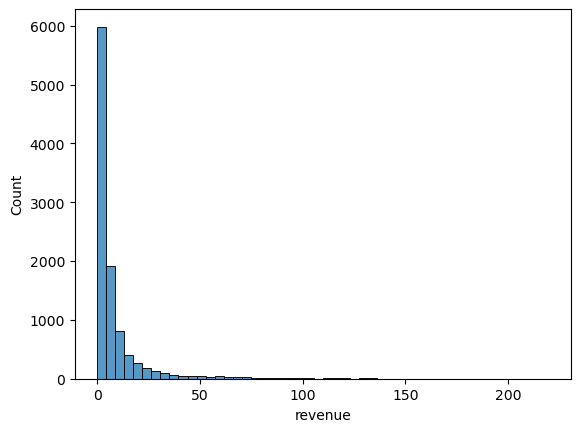

In [332]:
sns.histplot(data=stores_train['revenue'], bins=50)

### Investigating the different features

In [333]:
stores_train.dtypes

store_id                object
year                     int64
store_name              object
plaace_hierarchy_id     object
sales_channel_name      object
grunnkrets_id            int64
address                 object
lat                    float64
lon                    float64
chain_name              object
mall_name               object
revenue                float64
dtype: object

In [334]:
stores_train.describe()

,year,grunnkrets_id,lat,lon,revenue
count,10287.0,1.028700e+04,10287.000000,10287.000000,10287.000000
mean,2016.0,9.348313e+06,61.223094,10.005801,8.328546
std,0.0,5.794345e+06,2.969380,3.825401,15.659131
min,2016.0,1.010105e+06,57.994443,4.625889,0.000000
25%,2016.0,3.014302e+06,59.433541,7.223571,1.188000
50%,2016.0,9.065412e+06,59.941830,10.407527,3.363000
75%,2016.0,1.449020e+07,62.144366,10.850242,8.052500
max,2016.0,2.030031e+07,71.098287,31.118935,219.599000


store_id and year are redundant as they provide no information

In [335]:
stores_train["store_name"].nunique()


10265

Since there are so many unique store names, we omit this ATM

#### Plaace Hierarchy ID

In [336]:
stores_train["plaace_hierarchy_id"].value_counts()

3.2.4.0     959
2.8.1.0     879
2.4.6.0     700
3.2.1.0     605
1.1.6.2     499
2.7.1.0     386
1.1.7.0     385
1.1.6.4     339
2.6.3.2     322
1.2.4.0     279
2.2.1.0     275
3.6.1.0     261
2.9.4.0     219
2.9.8.0     218
1.1.9.0     193
3.3.3.0     191
1.3.2.0     186
2.1.6.0     164
2.8.2.0     161
1.1.6.1     158
3.3.5.0     154
3.3.6.0     142
1.1.5.0     139
2.3.1.0     138
1.1.6.3     123
3.2.2.0     107
2.9.3.0     103
2.9.1.0     103
2.1.2.0      99
2.4.2.0      98
2.9.2.0      87
1.1.2.0      85
2.7.2.0      80
2.7.5.0      80
2.5.2.0      76
2.6.2.0      75
2.1.1.0      67
2.8.10.0     67
3.4.3.0      67
2.4.1.0      61
2.1.4.0      61
2.3.2.0      57
2.7.6.0      55
3.4.2.0      52
2.6.1.0      47
2.3.4.0      46
2.1.3.0      41
1.2.2.0      38
2.4.5.0      37
2.9.5.0      37
1.1.4.0      35
2.6.6.1      34
2.9.9.0      32
1.2.3.0      32
2.6.5.0      25
3.3.4.0      24
2.7.3.0      23
2.3.3.0      22
2.8.6.0      22
2.8.4.0      20
1.1.1.0      19
1.1.3.0      19
2.8.5.0 

In [337]:
stores_train["plaace_hierarchy_id_6"] = stores_train["plaace_hierarchy_id"].apply(lambda x: x[:3])
stores_train["plaace_hierarchy_id_6"].value_counts()

1.1    1994
3.2    1671
2.8    1204
2.4     908
2.9     816
2.7     627
3.3     521
2.6     517
2.1     453
1.2     355
2.2     288
2.3     274
3.6     261
1.3     191
3.4     119
2.5      80
1.4       8
Name: plaace_hierarchy_id_6, dtype: int64

IDEA: split into 4 columns, first column contains only first number, second contains first two numbers...

Treat as categorical variable

#### Sales Channel Name

In [338]:
stores_train["sales_channel_name"].value_counts()

Spas                                         959
Grocery stores                               879
Clothing stores                              700
Hairdressers                                 605
Restaurants                                  499
Other stores                                 386
Hotels with restaurants                      385
Belongs to dining                            339
Sporting goods stores                        322
Cafes                                        279
Gas stations                                 275
Gyms                                         261
Furniture stores                             219
Flower shops                                 218
Fast food                                    193
Photographers                                191
Pubs                                         186
Construction stores                          164
Kiosks                                       161
Eateries                                     158
Opticians           

Contains same information as plaace hierarchy id, redundant

#### Grunnkrets ID

In [339]:
stores_train["grunnkrets_id"]

2506      6020601
12305     2350203
4142      6240307
8561     15040206
818       3012312
           ...   
4859     18330207
3264     16017522
9845     15040101
10799    12012008
2732     20120607
Name: grunnkrets_id, Length: 10287, dtype: int64

Simply a foreign key to link to the other CSV files, will look at it later

#### Address

In [340]:
stores_train["address"].nunique()

6880

#### Lat & Long

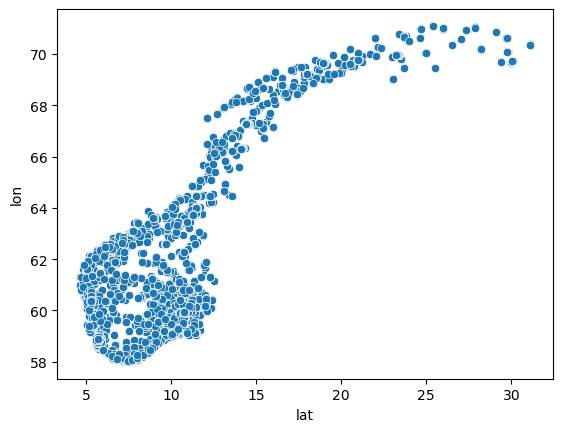

In [341]:
sns.scatterplot(data = stores_train, y = 'lat', x = 'lon')
plt.ylabel("lon")
plt.xlabel("lat")
plt.show();

<AxesSubplot:xlabel='lon', ylabel='lat'>

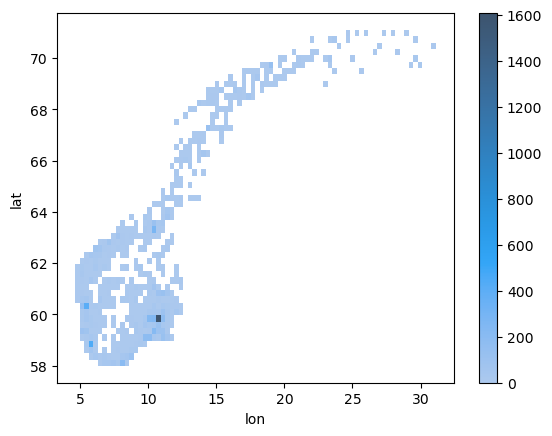

In [342]:
sns.histplot(data = stores_train, y = 'lat', x = 'lon', cbar=True)

We see that the stores are spread all across the country, but that they are most frequent in the large cities

#### Chain Name

In [343]:
# pd.set_option('display.max_rows', None)  # or 1000
stores_train["chain_name"].value_counts()

REMA FRANCHISE NORGE                      223
JOKER                                     132
BUNNPRIS                                   96
CIRCLE K DETALJIST                         94
MIX                                        86
INTERFLORA NORGE SA                        85
SPAR                                       71
NÆRBUTIKKEN                                58
KIWI NORGE                                 54
SPORT 1 BUTIKKENE                          53
YX NORGE                                   50
C OPTIKK                                   41
FARGERIKE                                  40
SPECSAVERS NORWAY                          39
CHOICE HOTELS & RESORTS                    38
ESSO NORGE                                 35
PIZZABAKEREN INVEST                        35
G-SPORT                                    35
NORSKE SHELL                               33
MX SPORT NORGE                             32
MØBELRINGEN                                31
BJØRKLUND NORGE                   

In [344]:
stores_train["chain_name"].isna().sum() / stores_train.shape[0]

0.7103139885292117

IMPUTE NANS: impute NANs as a category of its own. Can also treat the whole column as binary not-NAN/NAN. Can also decide threshold for when a chain becomes a NAN or another category altogether.

#### Mall Name

In [345]:
stores_train["mall_name"].isna().sum() / stores_train.shape[0]

0.8260911830465636

In [346]:
pd.set_option('display.max_rows', 500)
stores_train["mall_name"].value_counts()

Strømmen Storsenter               30
Amfi Moa                          22
Sandvika Storsenter               19
Kvadrat                           18
Jessheim Storsenter               15
Ski Storsenter                    14
Gulskogen Senter                  14
Amfi Borg                         13
Stovner Senter                    13
CC Gjøvik                         13
Lagunen Storsenter                13
Sørlandssenteret                  13
Amfi Finnsnes                     12
Amfi Madla                        12
CC Vest                           11
Torvbyen                          11
Herkules                          11
Knarvik Senter                    11
Storo Storsenter                  11
CC Hamar                          11
Triaden Lørenskog Storsenter      11
Vinterbro Senter                  11
Sartor Storsenter                 10
House of Oslo                     10
Vulkan                            10
Magasinet Drammen                 10
Amfi Førde                        10
J

Treat similarly to chain name, we think a binary approach would be the best as the size of a lot of malls seems to be wrong due to missing shops etc.

#### Revenue

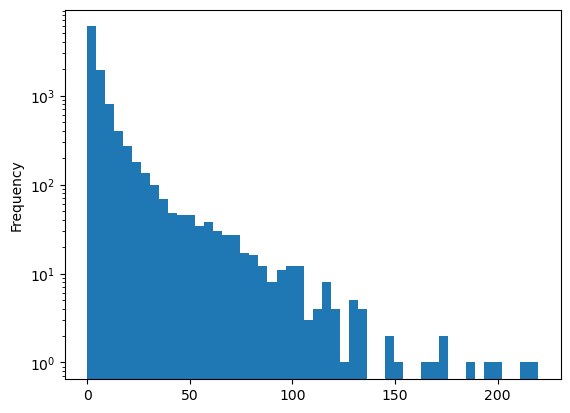

In [347]:
stores_train.revenue.plot.hist(bins=50, logy=True);

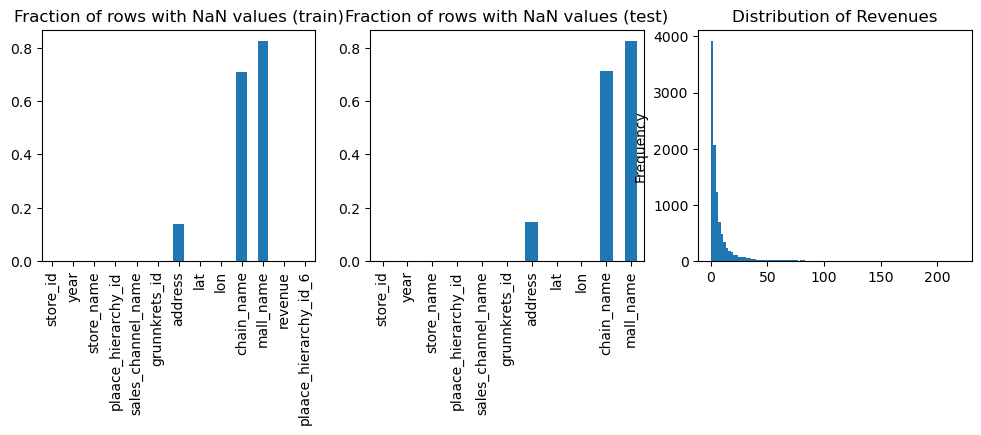

In [348]:
fig, (ax1, ax2, ax3) = plt.subplots(figsize=(12, 3), ncols=3)
stores_train.isna().mean().plot.bar(ax=ax1)
ax1.set_title('Fraction of rows with NaN values (train)')
stores_test.isna().mean().plot.bar(ax=ax2)
ax2.set_title('Fraction of rows with NaN values (test)')
stores_train.revenue.plot.hist(bins=100, ax=ax3)
ax3.set_title('Distribution of Revenues');

### Feature engineering

We start by including lat, lon, chain_name, mall_name and plaace_hierarchy_id

Categorical that tells if a given store is in a mall

In [349]:
stores_train["is_mall"] = ~stores_train["mall_name"].isna()

Categorical that tells if a given store is in a chain of a certain size

In [350]:
lower_limit = 10

chain_count = stores_train["chain_name"].value_counts().to_dict()
stores_train["bounded_chain_name"] = stores_train["chain_name"].apply(lambda x: "OTHER" if(x in chain_count and chain_count[x] < lower_limit) else x)
stores_train[["chain_name", "bounded_chain_name"]].head()

,chain_name,bounded_chain_name
2506,BAKER KLAUSEN DRAMMEN,OTHER
12305,NaN,NaN
4142,EXPERT,EXPERT
8561,NaN,NaN
818,NaN,NaN


Split the plaace cat as detailed above 

In [351]:
stores_train["plaace_cat_1"] = stores_train["plaace_hierarchy_id"].apply(lambda x: x[:1])
stores_train["plaace_cat_2"] = stores_train["plaace_hierarchy_id"].apply(lambda x: x[:3])
stores_train["plaace_cat_3"] = stores_train["plaace_hierarchy_id"].apply(lambda x: x[:5])
stores_train["plaace_cat_4"] = stores_train["plaace_hierarchy_id"]
stores_train[["plaace_cat_1", "plaace_cat_2", "plaace_cat_3", "plaace_cat_4"]].head()

,plaace_cat_1,plaace_cat_2,plaace_cat_3,plaace_cat_4
2506,1,1.2,1.2.2,1.2.2.0
12305,3,3.4,3.4.2,3.4.2.0
4142,2,2.3,2.3.1,2.3.1.0
8561,2,2.9,2.9.1,2.9.1.0
818,1,1.1,1.1.6,1.1.6.2


In [352]:
stores_train["plaace_cat_4"].unique()

array(['1.2.2.0', '3.4.2.0', '2.3.1.0', '2.9.1.0', '1.1.6.2', '3.2.4.0',
       '2.8.6.0', '2.4.6.0', '1.1.7.0', '1.2.4.0', '2.9.8.0', '2.1.2.0',
       '2.8.1.0', '2.6.3.2', '3.4.3.0', '2.8.2.0', '2.9.4.0', '3.3.6.0',
       '3.2.1.0', '2.3.2.0', '2.8.10.0', '2.6.6.1', '1.1.6.4', '2.9.2.0',
       '1.2.3.0', '2.2.1.0', '2.7.6.0', '2.9.3.0', '1.3.2.0', '3.3.3.0',
       '1.1.6.1', '2.7.2.0', '1.1.9.0', '3.2.2.0', '1.1.5.0', '2.5.2.0',
       '2.3.4.0', '2.7.5.0', '2.4.1.0', '2.1.6.0', '1.1.6.3', '2.8.3.0',
       '2.6.5.0', '2.9.9.0', '1.1.4.0', '2.7.1.0', '3.6.1.0', '2.6.2.0',
       '2.4.2.0', '2.1.1.0', '3.3.5.0', '2.1.3.0', '2.8.7.0', '2.4.4.0',
       '2.8.4.0', '2.1.4.0', '2.8.11.2', '2.7.3.0', '2.8.5.0', '2.6.1.0',
       '2.6.6.2', '1.1.2.0', '2.9.7.0', '2.4.5.0', '2.3.5.0', '2.3.3.0',
       '1.1.3.0', '3.3.4.0', '2.2.4.0', '3.3.7.0', '2.9.5.0', '2.1.5.0',
       '1.1.1.0', '2.1.7.0', '1.4.2.0', '1.2.1.0', '1.3.1.0', '2.6.4.0',
       '2.6.3.3', '2.5.1.0', '1.4.1.0', '3.3.2.0'

In [353]:
len(stores_train["plaace_cat_4"].unique())

88

In [354]:
stores_train[stores_train["plaace_cat_1"] == "1"].shape

(2548, 19)

In [355]:
stores_train[stores_train["plaace_cat_1"] == "2"].shape

(5167, 19)

In [356]:
stores_train[stores_train["plaace_cat_1"] == "3"].shape

(2572, 19)

/tmp/ipykernel_16041/1636759022.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


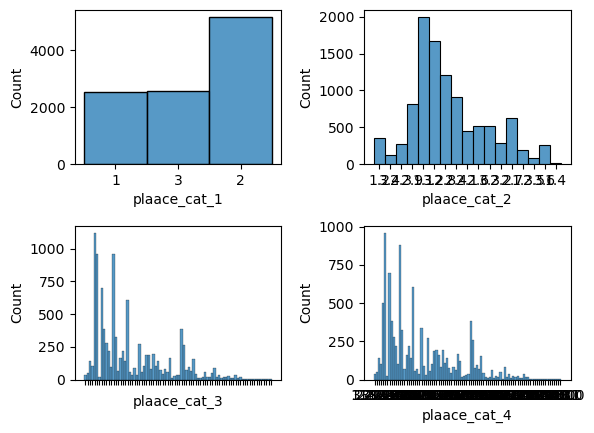

In [357]:
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.4)
ax = fig.add_subplot(2, 2, 1)
sns.histplot(data=stores_train, x = 'plaace_cat_1')
ax = fig.add_subplot(2, 2, 2)
sns.histplot(data=stores_train, x = 'plaace_cat_2')
ax = fig.add_subplot(2, 2, 3)
sns.histplot(data=stores_train, x = 'plaace_cat_3')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax = fig.add_subplot(2, 2, 4)
sns.histplot(data=stores_train, x = 'plaace_cat_4')
plt.show()

We see that there are large variations in the number of stores in each category 

In [358]:
from scipy.spatial.distance import cdist


def closest_point(point, points):
    """ Find closest point from a list of points. """
    if(len(points) == 0):
        return None
    return points[cdist([point], points).argmin()]

**!NB**

Next cell can take up to 1 minute to run

In [359]:
stores_train["point"] = [(x, y) for x,y in zip(stores_train['lat'], stores_train['lon'])]
stores_train['closest'] = [closest_point(x["point"], list(stores_train.loc[stores_train["plaace_cat_3"] == x["plaace_cat_3"]]['point'].drop([i], axis=0))) for i, x in stores_train.iterrows()]

Find the closest store for each store 

In [360]:
stores_train["closest"].isna().sum()

5

In [361]:
stores_train["closest"].head()

2506       (59.7810714029896, 10.4971149784371)
12305      (59.9224815637455, 11.1742995190455)
4142      (59.96577320581039, 9.99504792924738)
8561      (62.4712640586064, 6.337605165649361)
818      (59.9241550536053, 10.758884654304198)
Name: closest, dtype: object

In [362]:
for i, row in stores_train.iterrows():
    if(row["closest"] == None):
        val = float("inf")
    else:
        val = cdist(np.array(row["point"]).reshape(1, -1), np.array(row["closest"]).reshape(1, -1))
    stores_train.at[i,'dist_to_nearest_comp'] = val

Finds the distance to the nearest store

In [363]:
stores_train.sample(5)

,store_id,year,store_name,plaace_hierarchy_id,sales_channel_name,grunnkrets_id,address,lat,lon,chain_name,...,plaace_hierarchy_id_6,is_mall,bounded_chain_name,plaace_cat_1,plaace_cat_2,plaace_cat_3,plaace_cat_4,point,closest,dist_to_nearest_comp
8467,889031492-914653800-734646,2016,VIOL INVEST AS,2.8.6.0,Fish shops,3014706,NaN,59.932258,10.689622,NaN,...,2.8,False,NaN,2,2.8,2.8.6,2.8.6.0,"(59.9322578392119, 10.6896223308531)","(59.872805525732005, 10.8115982331579)",0.135693
12655,813265672-813281392-678934,2016,DOMBÅS TRENINGSSTUDIO AS,3.6.1.0,Gyms,5110205,GUDBRANDSDALSVEGEN 2582,62.072432,9.123934,NaN,...,3.6,False,NaN,3,3.6,3.6.1,3.6.1.0,"(62.0724317099549, 9.12393400935375)","(61.8776925120986, 9.09817995643552)",0.196435
8457,913265122-913324153-680007,2016,SMAK MATGLEDER,2.8.6.0,Fish shops,2310803,STØPERIVEIEN 5,59.947108,11.007533,NaN,...,2.8,True,NaN,2,2.8,2.8.6,2.8.6.0,"(59.9471076229766, 11.0075329976168)","(59.9289816300544, 10.880530949442198)",0.128289
1132,886664842-986811478-64421,2016,LATTER,1.1.6.2,Restaurants,3010304,HOLMENS GATE 1,59.910814,10.726769,NaN,...,1.1,True,NaN,1,1.1,1.1.6,1.1.6.2,"(59.9108137019415, 10.7267685814265)","(59.9106233528858, 10.7269017692412)",0.000232
10700,913443314-813495082-686636,2016,HC ROLVSØY AS,3.2.4.0,Spas,1063103,DIKEVEIEN 27,59.252553,10.997369,NaN,...,3.2,False,NaN,3,3.2,3.2.4,3.2.4.0,"(59.252552982931, 10.9973687755978)","(59.225236785633705, 10.9541492158645)",0.051128


Extract delomrade, kommune and fylke from grunnkrets_id 

In [364]:

def create_fylke_column(dataframe: pd.DataFrame, grunnkrets_column_name: str = "grunnkrets_id") -> pd.DataFrame:
    """Decodes the grunnkrets_id column into 1 new columns for "fylke" information.

    Args:
        dataframe (pd.DataFrame): The dataframe to be processed.
        grunnkrets_column_name (str, optional): The name of the column containing the 
                                                "grunnkrets" information. Defaults to "grunnkrets_id".

    Returns:
        pd.DataFrame: _description_
    """
    dataframe["fylke"] = dataframe[grunnkrets_column_name].apply(
        lambda x: int(str(x)[:len(str(x)) - 6]))
    return dataframe


def create_kommune_column(dataframe: pd.DataFrame, grunnkrets_column_name: str = "grunnkrets_id") -> pd.DataFrame:
    """Decodes the grunnkrets_id column into 1 new columns for "kommune" information.

    Args:
        dataframe (pd.DataFrame): The dataframe to be processed.
        grunnkrets_column_name (str, optional): The name of the column containing the 
                                                "grunnkrets" information. Defaults to "grunnkrets_id".

    Returns:
        pd.DataFrame: _description_
    """
    dataframe["kommune"] = dataframe[grunnkrets_column_name].apply(
        lambda x: int(str(x)[:len(str(x)) - 4]))
    return dataframe


def create_delomrade_column(dataframe: pd.DataFrame, grunnkrets_column_name: str = "grunnkrets_id") -> pd.DataFrame:
    """Decodes the grunnkrets_id column into 1 new columns for "delomrade" information.

    Args:
        dataframe (pd.DataFrame): The dataframe to be processed.
        grunnkrets_column_name (str, optional): The name of the column containing the 
                                                "grunnkrets" information. Defaults to "grunnkrets_id".

    Returns:
        pd.DataFrame: _description_
    """
    dataframe["delomrade"] = dataframe[grunnkrets_column_name].apply(
        lambda x: int(str(x)[:len(str(x)) - 2]))
    return dataframe


def create_geographical_columns(dataframe: pd.DataFrame, grunnkrets_column_name: str = "grunnkrets_id") -> pd.DataFrame:
    """Decodes the grunnkrets_id column into 3 new columns. A column for "fylke",
    a column for "kommune" and a column for "delomrade".

    Args:
        dataframe (pd.DataFrame): The dataframe to be processed.
        grunnkrets_column_name (str, optional): The name of the column containing the 
                                                "grunnkrets" information. Defaults to "grunnkrets_id".

    Returns:
        pd.DataFrame: The modified dataframe.
    """
#    dataframe = dataframe.copy()
    dataframe = create_fylke_column(
        dataframe=dataframe, grunnkrets_column_name=grunnkrets_column_name)
    dataframe = create_kommune_column(
        dataframe=dataframe, grunnkrets_column_name=grunnkrets_column_name)
    dataframe = create_delomrade_column(
        dataframe=dataframe, grunnkrets_column_name=grunnkrets_column_name)
    return dataframe

stores_train = create_geographical_columns(stores_train)

Get the mean revenue for the different plaace levels

In [365]:
unq_vals = stores_train["plaace_cat_4"].unique()

In [366]:
rev_dict = {}
for val in unq_vals:
    rev_dict[val] = stores_train["revenue"].where(stores_train["plaace_cat_4"] == val).mean()

In [367]:
stores_train["mean_revenue"] = stores_train["plaace_cat_4"].apply(lambda x: rev_dict[x])

# Examine data from grunnkrets dataframes

In [368]:
# Magic to automatically update imports if functions in utils are changed
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import seaborn as sns
import sklearn
import matplotlib.pyplot as plt

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [369]:
age_distribution = pd.read_csv("data/grunnkrets_age_distribution.csv")
age_distribution.shape

(22620, 93)

In [370]:
age_distribution.head()

,grunnkrets_id,year,age_0,age_1,age_2,age_3,age_4,age_5,age_6,age_7,...,age_81,age_82,age_83,age_84,age_85,age_86,age_87,age_88,age_89,age_90
0,16013117,2015,14,14,14,14,13,13,12,11,...,0,0,0,0,0,0,0,0,0,0
1,16013117,2016,10,10,10,10,10,10,9,9,...,0,0,0,0,0,0,0,0,0,0
2,11030206,2015,5,5,5,5,5,4,4,3,...,0,0,0,0,0,0,0,0,0,0
3,16011203,2016,2,2,2,2,2,3,3,3,...,1,1,1,1,1,1,1,0,0,0
4,3011601,2016,7,7,7,7,6,6,5,4,...,1,1,0,0,0,0,0,0,0,0


Look at the distribution of stores at different granularities (grunnkrets, delomrade, kommune, fylke) 

In [371]:
from sklearn.model_selection import train_test_split

stores_train = pd.read_csv("data/stores_train.csv")
stores_train, _ = train_test_split(stores_train, test_size=0.2, random_state=0)
stores_train_explore = stores_train[ ['grunnkrets_id'] ].copy()
stores_train_explore["store_count"] = 1

In [372]:
stores_train_explore = create_geographical_columns(stores_train_explore)


In [373]:
def group_df(dataframe: pd.DataFrame, column_to_group_by: str) -> pd.DataFrame:
    """_summary_

    Args:
        dataframe (pd.DataFrame): The dataframe to be processed.
        column_to_group_by (str): The column we group the dataframe by. Should take 
        "fylke", "kommune" or "delomrade" as value.

    Returns:
        pd.DataFrame: The dataframe grouped by specified column.
    """
    new_df = dataframe.copy()
    new_df = new_df.groupby([column_to_group_by]).sum()
    return new_df
group_df(stores_train_explore, 'grunnkrets_id')[ ['store_count'] ].value_counts()

store_count
1              1842
2               581
3               285
4               158
5               107
6                79
7                58
8                44
9                40
11               28
10               24
12               19
13               16
14               13
15               11
16               11
18               11
19                8
20                8
17                7
23                6
24                5
21                4
28                4
25                4
32                4
22                3
26                3
29                2
30                2
37                2
27                1
31                1
33                1
35                1
36                1
41                1
42                1
44                1
47                1
51                1
61                1
67                1
dtype: int64

This is very sparsely populated 

In [374]:
group_df(stores_train_explore, 'delomrade')[ ['store_count'] ].value_counts()

store_count
1              269
2              192
3              133
4              114
5               76
6               68
8               51
7               38
9               27
10              23
11              22
12              22
15              18
22              15
14              14
13              13
16              13
18              12
23              11
17              11
20              10
19               8
30               8
21               7
35               6
24               6
25               5
26               5
45               4
31               4
41               3
38               3
37               3
33               3
28               3
32               2
29               2
39               2
59               2
43               2
34               1
92               1
69               1
70               1
84               1
142              1
102              1
111              1
65               1
144              1
150              1
66               1


We see that each delomrade is also quite sparsely populated, except for a few

In [375]:
group_df(stores_train_explore, 'kommune')[ ['store_count'] ].value_counts()

store_count
4              39
1              30
5              29
3              26
8              26
2              25
6              21
7              14
9              11
16              9
17              9
11              9
12              8
19              8
10              8
24              7
22              7
23              6
15              6
26              6
20              5
21              5
31              5
13              4
25              4
28              4
62              4
32              4
36              4
44              3
35              3
41              3
43              3
18              3
33              3
14              3
37              2
39              2
30              2
29              2
48              2
66              2
34              1
138             1
112             1
118             1
121             1
122             1
129             1
182             1
143             1
160             1
94              1
184             1
197             

We see that most "kommuner" contain few stores

In [376]:
group_df(stores_train_explore, 'fylke')[ ['store_count'] ].value_counts()

store_count
213            1
505            1
944            1
860            1
854            1
592            1
586            1
581            1
573            1
462            1
241            1
414            1
379            1
364            1
360            1
345            1
275            1
258            1
1481           1
dtype: int64

We can see that each fylke contains many stores

In [377]:
def drop_oldest_duplicates(
    dataframe: pd.DataFrame,
    grunnkrets_column_name: str = "grunnkrets_id",
    year_column_name: str = "year"
) -> pd.DataFrame:
    """Only retains the newest information available for each grunnkrets id, and removes old information.

    Args:
        dataframe (pd.DataFrame): The dataframe to be processed.
        grunnkrets_column_name (str, optional): The name of the column containing the 
                                                "grunnkrets" information. Defaults to "grunnkrets_id".
        year_column_name (str, optional): The name of the column containing the "year" information. 
                                          Defaults to "year".

    Returns:
        pd.DataFrame: The new dataframe containing only the newest data, without duplicates.
    """
    new_df = dataframe.copy()
    new_df = new_df.sort_values(by=[year_column_name])
    new_df = new_df.drop_duplicates(grunnkrets_column_name, keep="last")
    return new_df
def preprocess_grunnkrets_df(
    dataframe: pd.DataFrame,
    grunnkrets_column_name: str = "grunnkrets_id",
    year_column_name: str = "year"
) -> pd.DataFrame:
    """This takes in a pandas dataframe containing data related to grunnkrets_ids
    and preprocesses it. Only keeps newest information available for each grunnkrets
    and decodes the grunnkrets_id into "fylke", "kommune" and "delomrade".

    Args:
        dataframe (pd.DataFrame): The dataframe to be preprocessed
        grunnkrets_column_name (str, optional): The name of the column containing the 
                                                "grunnkrets" information. Defaults to "grunnkrets_id".
        year_column_name (str, optional): The name of the column containing the "year" information. 
                                          Defaults to "year".

    Returns:
        pd.DataFrame: The modified dataframe
    """
    dataframe = drop_oldest_duplicates(
        dataframe=dataframe,
        grunnkrets_column_name=grunnkrets_column_name,
        year_column_name=year_column_name
    )
    dataframe = create_geographical_columns(
        dataframe=dataframe, grunnkrets_column_name=grunnkrets_column_name)
    return dataframe
age_distribution = preprocess_grunnkrets_df(age_distribution, "grunnkrets_id")

In [378]:
age_list = []
for col in list(age_distribution.columns):
    if col.startswith("age"):
        _, age_num = col.split("_")
        age_list.append([int(age_num), col])
age_list = sorted(age_list, key=lambda x: (x[0]))
age_list[:3]

[[0, 'age_0'], [1, 'age_1'], [2, 'age_2']]

We need to in some way group ages for it to be useful 

## Age distribution 

In [379]:
def group_age_columns(age_distribution_df: pd.DataFrame, span_size: int = 5):
    """Collapse n age-columns into one, summing their contents (where n = span_size).

    Args:
        age_distribution_df (pd.DataFrame): The dataframe whose columns we want to collapse
        span_size (int, optional): Number of columns to collapse for each new column created.
                                   Defaults to 5.

    Returns:
        _type_: The new dataframe where age-columns are grouped.
    """
    age_list = []
    new_df = pd.DataFrame()
    for col in list(age_distribution_df.columns):
        if col.startswith("age"):
            _, age_num = col.split("_")
            age_list.append([int(age_num), col])
        else:
            new_df[col] = age_distribution_df[col]
    age_list = sorted(age_list, key=lambda x: (x[0]))
    max_val = age_list[-1][0]
    for i in range(0, max_val+1, span_size):
        new_df["age_" + str(i) + "-" + str(min(i + span_size - 1, max_val))] = age_distribution_df[
            [
                row[1]for row in age_list[i:min(i+span_size, max_val)]
            ]
        ].sum(axis=1)
    return new_df

pro_age_distribution = preprocess_grunnkrets_df(age_distribution)

new_age_distribution = group_age_columns(age_distribution_df=age_distribution, span_size=7)

Could do a 'bucket' approach like this 

In [380]:
new_age_distribution.head()

,grunnkrets_id,year,fylke,kommune,delomrade,age_0-6,age_7-13,age_14-20,age_21-27,age_28-34,age_35-41,age_42-48,age_49-55,age_56-62,age_63-69,age_70-76,age_77-83,age_84-90
6784,2190812,2015,2,219,21908,0,0,0,3,16,21,18,14,7,1,0,0,0
8175,2190914,2015,2,219,21909,29,54,46,35,23,32,44,47,33,22,12,7,5
8529,20300310,2015,20,2030,203003,2,0,6,16,24,11,7,7,7,0,0,0,0
8577,5170101,2015,5,517,51701,2,0,5,19,32,14,1,0,3,0,0,0,0
16348,2191013,2015,2,219,21910,71,70,36,44,63,76,67,50,47,37,28,25,9


But an intuition guided approach like below might be more useful

In [381]:
def merge_age_columns_list(
    df: pd.DataFrame,
    ranges : list[int],
) -> pd.DataFrame:
    result_df = df.copy().drop([f'age_{a}' for a in range(91)], axis=1)
    for r in ranges:
        cols = [f'age_{a}' for a in range(r[0], r[1])]
        temp_df = df[cols]
        series = temp_df.sum(axis=1)
        result_df[f'c_age_{r[0]}-{r[1]-1}'] = series
    return result_df

custom_age_list = [(0,19), (19, 31 ), (31, 56), (56, 91 )]
custom_age_bins = ['c_age_0-18',	'c_age_19-30',	'c_age_31-55',	'c_age_56-90']
custom_age_df = merge_age_columns_list(pro_age_distribution, custom_age_list)
custom_age_df.head()

,grunnkrets_id,year,fylke,kommune,delomrade,c_age_0-18,c_age_19-30,c_age_31-55,c_age_56-90
6784,2190812,2015,2,219,21908,0,9,63,8
21504,12240103,2015,12,1224,122401,12,14,30,26
21506,12240306,2015,12,1224,122403,24,9,22,17
2186,12340102,2015,12,1234,123401,16,21,21,31
2181,11340310,2015,11,1134,113403,24,17,24,18


Join in the age bins for different geographical units

In [382]:
from utils import join_grouped_df, age_bins

full_population_df = create_geographical_columns(stores_train)

full_population_df = join_grouped_df(full_population_df, new_age_distribution[age_bins(age_list, span_size=7) + ['grunnkrets_id']], 'grunnkrets_id')
full_population_df = join_grouped_df(full_population_df, new_age_distribution[age_bins(age_list, span_size=7) + ['delomrade']], 'delomrade')
full_population_df = join_grouped_df(full_population_df, new_age_distribution[age_bins(age_list, span_size=7) + ['kommune']], 'kommune')
full_population_df = join_grouped_df(full_population_df, new_age_distribution[age_bins(age_list, span_size=7) + ['fylke']], 'fylke')
full_population_df = join_grouped_df(full_population_df, custom_age_df[custom_age_bins + ['grunnkrets_id']], 'grunnkrets_id')
full_population_df = join_grouped_df(full_population_df, custom_age_df[custom_age_bins + ['delomrade']], 'delomrade')
full_population_df = join_grouped_df(full_population_df, custom_age_df[custom_age_bins + ['kommune']], 'kommune')
full_population_df = join_grouped_df(full_population_df, custom_age_df[custom_age_bins + ['fylke']], 'fylke')


### Mean age

In [383]:
def merge_age_columns_mean(
    df: pd.DataFrame,
    level: str,
) -> pd.Series:
    """ Combines columns in a dataframe by averaging their values
    Args:
        df (pd.DataFrame): The dataframe 
        columns (list[str]): The columns to be merged 

    Returns:
        pd.Series: Series containing the result
    """
    return merge_columns_mean(df.groupby(level).sum(), [f'age_{i}' for i in range(91)], f'{level}.mean_age', level, list(range(91)))

def merge_columns_mean(
    df: pd.DataFrame,
    columns: list[str],
    new_column: str,
    new_index: str,
    weights : list[int] = None,
) -> pd.Series:
    """ Combines columns in a dataframe by averaging their values
    Args:
        df (pd.DataFrame): The dataframe 
        columns (list[str]): The columns to be merged 

    Returns:
        pd.Series: Series containing the result
    """
    # df = df.set_index(key)
    df = df[columns]
    total = len(columns)
    if weights:
        total = df.sum(axis=1)
        df = df*weights
    series = df.sum(axis=1) / total
    return pd.DataFrame({new_column:series.values}, index=series.index)

def merge_age_columns_sum(
    df: pd.DataFrame,
    level: str,
) -> pd.Series:
    """ Combines columns in a dataframe by averaging their values
    Args:
        df (pd.DataFrame): The dataframe 
        columns (list[str]): The columns to be merged 

    Returns:
        pd.Series: Series containing the result
    """
    return merge_columns_sum(df.groupby(level).sum(), [f'age_{i}' for i in range(91)], f'{level}.tot_pop', level)

def merge_columns_sum(
    df: pd.DataFrame,
    columns: list[str],
    new_column: str,
    new_index: str = '',
) -> pd.Series:
    """ Combines columns in a dataframe by averaging their values
    Args:
        df (pd.DataFrame): The dataframe 
        columns (list[str]): The columns to be merged 

    Returns:
        pd.Series: Series containing the result
    """
    # df = df.set_index(key)
    df = df[columns]
    series = df.sum(axis=1) 
    return pd.DataFrame({new_column:series.values}, index=series.index)

new_age_distribution2 = pd.read_csv("data/grunnkrets_age_distribution.csv")
new_age_distribution2 = preprocess_grunnkrets_df(new_age_distribution2)

#### Mean age for each grunnkrets

In [384]:
mean_ages_grunnkrets = merge_age_columns_mean(new_age_distribution2, 'grunnkrets_id')
mean_ages_grunnkrets.describe()

,grunnkrets_id.mean_age
count,11379.000000
mean,40.058491
std,5.000218
min,21.694444
25%,36.874665
50%,39.684000
75%,42.807146
max,81.190476


This varies quite a bit 

#### Delomrade

In [385]:
mean_ages_delomrade = merge_age_columns_mean(new_age_distribution2, 'delomrade')
mean_ages_delomrade.describe()

,delomrade.mean_age
count,1541.000000
mean,40.195220
std,3.203201
min,29.243990
25%,37.966243
50%,40.102068
75%,42.268260
max,54.132353


#### Kommune

In [386]:
mean_ages_kommune = merge_age_columns_mean(new_age_distribution2, 'kommune')
mean_ages_kommune.describe()

,kommune.mean_age
count,428.000000
mean,40.860425
std,2.415133
min,33.826465
25%,39.101782
50%,41.044260
75%,42.622069
max,47.307203


#### Fylke

In [387]:
mean_ages_fylke = merge_age_columns_mean(new_age_distribution2, 'fylke')
mean_ages_fylke.describe()

,fylke.mean_age
count,19.000000
mean,39.530080
std,1.494322
min,36.713186
25%,38.424188
50%,39.936194
75%,40.508635
max,42.140772


Do the same for total population

In [388]:
tot_pop_grunnkrets = merge_age_columns_sum(new_age_distribution2, 'grunnkrets_id')
tot_pop_grunnkrets.describe()

,grunnkrets_id.tot_pop
count,11379.00000
mean,449.91291
std,431.94708
min,59.00000
25%,167.00000
50%,308.00000
75%,575.00000
max,5993.00000


In [389]:
tot_pop_delomrade = merge_age_columns_sum(new_age_distribution2, 'delomrade')
tot_pop_delomrade

,delomrade.tot_pop
delomrade,
10101,7812
10102,9267
10103,4404
10104,4011
10105,2050
...,...
203001,387
203002,4584
203003,3642


In [390]:
tot_pop_kommune = merge_age_columns_sum(new_age_distribution2, 'kommune')
tot_pop_kommune.describe()

,kommune.tot_pop
count,428.000000
mean,11961.586449
std,38203.092998
min,201.000000
25%,1990.500000
50%,4505.500000
75%,10510.250000
max,665638.000000


In [391]:
tot_pop_fylke = merge_age_columns_sum(new_age_distribution2, 'fylke')
tot_pop_fylke.describe()

,fylke.tot_pop
count,19.000000
mean,269450.473684
std,168589.355280
min,71233.000000
25%,162694.500000
50%,229962.000000
75%,297173.500000
max,665638.000000


Merge into main df

In [392]:
full_population_df=full_population_df.merge(mean_ages_grunnkrets, how='left', right_index=True, left_on='grunnkrets_id')
full_population_df=full_population_df.merge(mean_ages_delomrade, how='left', right_index=True, left_on='delomrade')
full_population_df=full_population_df.merge(mean_ages_kommune, how='left', right_index=True, left_on='kommune')
full_population_df=full_population_df.merge(mean_ages_fylke, how='left', right_index=True, left_on='fylke')
full_population_df=full_population_df.merge(tot_pop_grunnkrets, how='left', right_index=True, left_on='grunnkrets_id')
full_population_df=full_population_df.merge(tot_pop_delomrade, how='left', right_index=True, left_on='delomrade')
full_population_df=full_population_df.merge(tot_pop_kommune, how='left', right_index=True, left_on='kommune')
full_population_df=full_population_df.merge(tot_pop_fylke, how='left', right_index=True, left_on='fylke')

In [393]:
full_population_df.shape

(10287, 91)

In [394]:

def corr_plot(df):
    corr = df.corr()
    mask = np.triu(np.ones_like(corr, dtype=bool))

    f, ax = plt.subplots(figsize=(11, 9))

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(230, 20, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})

def quad_geo_histogram(df, column, log=False):
    fig = plt.figure()
    fig.subplots_adjust(hspace=0.4, wspace=0.4)
    ax = fig.add_subplot(2, 2, 1)
    sns.histplot(data=df, x=f'grunnkrets_id.{column}', log_scale=log)
    ax = fig.add_subplot(2, 2, 2)
    sns.histplot(data=df, x=f'delomrade.{column}', log_scale=log)
    ax = fig.add_subplot(2, 2, 3)
    sns.histplot(data=df, x=f'kommune.{column}', log_scale=log)
    # ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    ax = fig.add_subplot(2, 2, 4)
    sns.histplot(data=df, x=f'fylke.{column}', log_scale=log)
    plt.show()

def quad_geo_scatter(df, column, xscale='linear', yscale ='linear'):
    fig = plt.figure()
    fig.subplots_adjust(hspace=0.4, wspace=0.4)
    ax = fig.add_subplot(2, 2, 1)
    ax.set(xscale = xscale, yscale = yscale)
    sns.scatterplot(data=df, x=f"grunnkrets_id.{column}", y="revenue")
    ax = fig.add_subplot(2, 2, 2)
    ax.set(xscale = xscale, yscale = yscale)
    sns.scatterplot(data=df, x=f"delomrade.{column}", y="revenue")
    ax = fig.add_subplot(2, 2, 3)
    ax.set(xscale = xscale, yscale = yscale)
    sns.scatterplot(data=df, x=f"kommune.{column}", y="revenue")
    ax = fig.add_subplot(2, 2, 4)
    ax.set(xscale = xscale, yscale = yscale)
    sns.scatterplot(data=df, x=f"fylke.{column}", y="revenue")
    plt.show()

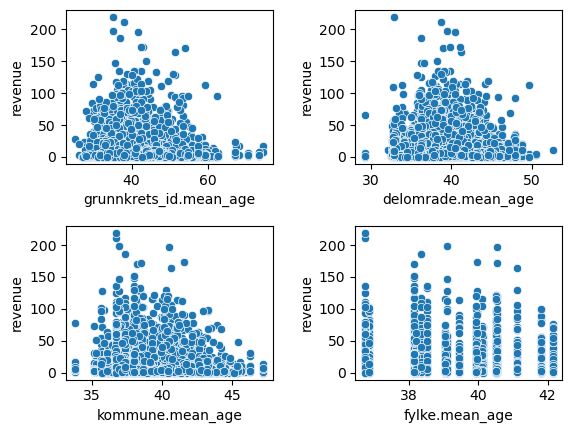

In [395]:
quad_geo_scatter(full_population_df, 'mean_age')

Check correlations with revenue 

In [396]:
full_population_df[['revenue','grunnkrets_id.mean_age', 'delomrade.mean_age', 'kommune.mean_age', 'fylke.mean_age', ]].corr().head(1)

,revenue,grunnkrets_id.mean_age,delomrade.mean_age,kommune.mean_age,fylke.mean_age
revenue,1.0,-0.030029,-0.057971,-0.034496,-0.005362


In [397]:
full_population_df[['revenue']+[ f'grunnkrets_id.{i}' for i in age_bins(age_list, span_size=7)]].corr().head(1)

,revenue,grunnkrets_id.age_0-6,grunnkrets_id.age_7-13,grunnkrets_id.age_14-20,grunnkrets_id.age_21-27,grunnkrets_id.age_28-34,grunnkrets_id.age_35-41,grunnkrets_id.age_42-48,grunnkrets_id.age_49-55,grunnkrets_id.age_56-62,grunnkrets_id.age_63-69,grunnkrets_id.age_70-76,grunnkrets_id.age_77-83,grunnkrets_id.age_84-90
revenue,1.0,0.01462,0.015664,0.018087,0.00485,0.000687,0.005873,0.010822,0.009239,0.006265,-0.00417,-0.009109,-0.004204,-0.001976


In [398]:
full_population_df[['revenue']+[ f'grunnkrets_id.{i}' for i in custom_age_bins]].corr().head(1)

,revenue,grunnkrets_id.c_age_0-18,grunnkrets_id.c_age_19-30,grunnkrets_id.c_age_31-55,grunnkrets_id.c_age_56-90
revenue,1.0,0.01638,0.004677,0.007095,-0.002505


In [399]:
full_population_df[['revenue']+[ f'delomrade.{i}' for i in age_bins(age_list, span_size=7)]].corr().head(1)

,revenue,delomrade.age_0-6,delomrade.age_7-13,delomrade.age_14-20,delomrade.age_21-27,delomrade.age_28-34,delomrade.age_35-41,delomrade.age_42-48,delomrade.age_49-55,delomrade.age_56-62,delomrade.age_63-69,delomrade.age_70-76,delomrade.age_77-83,delomrade.age_84-90
revenue,1.0,0.024235,0.024122,0.023133,0.011912,0.009899,0.016274,0.020793,0.019898,0.018408,0.012147,0.007343,0.007292,0.007562


In [400]:
full_population_df[['revenue']+[ f'delomrade.{i}' for i in custom_age_bins]].corr().head(1)

,revenue,delomrade.c_age_0-18,delomrade.c_age_19-30,delomrade.c_age_31-55,delomrade.c_age_56-90
revenue,1.0,0.024144,0.012199,0.017773,0.012276


In [401]:
full_population_df[['revenue']+[ f'kommune.{i}' for i in age_bins(age_list, span_size=7)]].corr().head(1)

,revenue,kommune.age_0-6,kommune.age_7-13,kommune.age_14-20,kommune.age_21-27,kommune.age_28-34,kommune.age_35-41,kommune.age_42-48,kommune.age_49-55,kommune.age_56-62,kommune.age_63-69,kommune.age_70-76,kommune.age_77-83,kommune.age_84-90
revenue,1.0,0.006465,0.007736,0.009398,0.008027,0.00537,0.005788,0.006999,0.007529,0.008076,0.008347,0.008516,0.008348,0.007773


In [402]:
full_population_df[['revenue']+[ f'kommune.{i}' for i in custom_age_bins]].corr().head(1)

,revenue,kommune.c_age_0-18,kommune.c_age_19-30,kommune.c_age_31-55,kommune.c_age_56-90
revenue,1.0,0.007464,0.00745,0.00631,0.008251


In [403]:
full_population_df[['revenue']+[ f'fylke.{i}' for i in age_bins(age_list, span_size=7)]].corr().head(1)

,revenue,fylke.age_0-6,fylke.age_7-13,fylke.age_14-20,fylke.age_21-27,fylke.age_28-34,fylke.age_35-41,fylke.age_42-48,fylke.age_49-55,fylke.age_56-62,fylke.age_63-69,fylke.age_70-76,fylke.age_77-83,fylke.age_84-90
revenue,1.0,0.003941,0.003988,0.005117,0.006769,0.004139,0.003714,0.003678,0.003939,0.005082,0.006023,0.005752,0.006486,0.007392


In [404]:
full_population_df[['revenue']+[ f'fylke.{i}' for i in custom_age_bins]].corr().head(1)

,revenue,fylke.c_age_0-18,fylke.c_age_19-30,fylke.c_age_31-55,fylke.c_age_56-90
revenue,1.0,0.004078,0.00611,0.003873,0.005842


It looks like c_age captures much of the same variability as age, and is probably better as it contains fewer features 

Maybe concider ratios instead 

In [405]:
from constants import levels
for level in levels:
    for bn in custom_age_bins:
        full_population_df[f'{level}.{bn}_ratio'] = full_population_df[f'{level}.{bn}']/full_population_df[f'{level}.tot_pop']

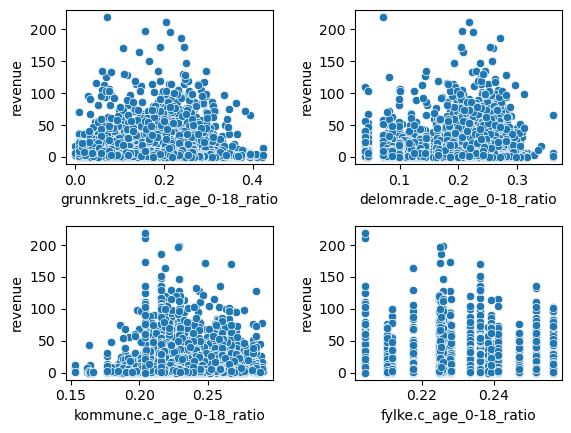

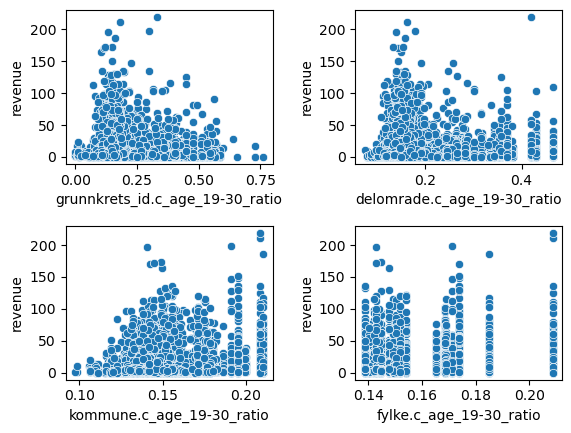

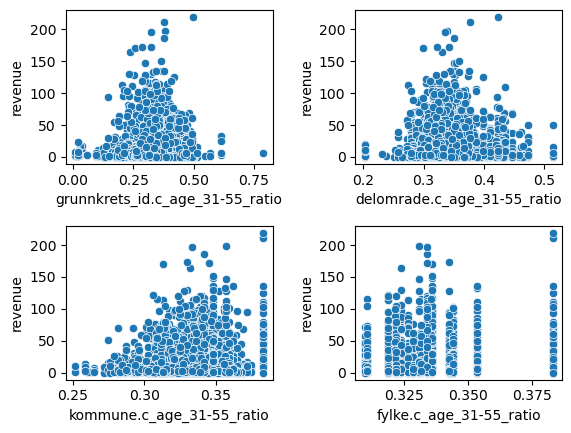

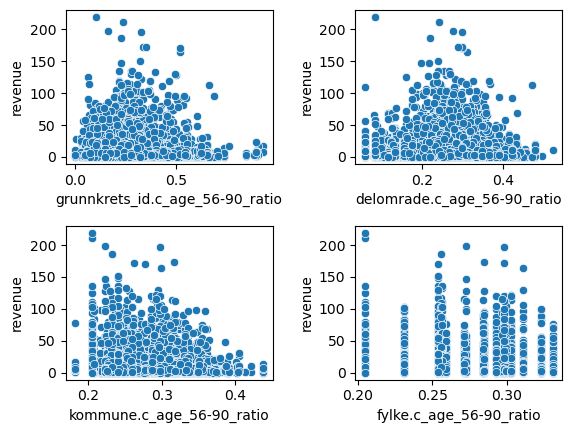

In [406]:
for bn in custom_age_bins:
    quad_geo_scatter(full_population_df, f'{bn}_ratio')


In [407]:
full_population_df[['revenue']+[ f'{i}.{bn}_ratio' for i in levels for bn in custom_age_bins]].corr().head(1)

,revenue,grunnkrets_id.c_age_0-18_ratio,grunnkrets_id.c_age_19-30_ratio,grunnkrets_id.c_age_31-55_ratio,grunnkrets_id.c_age_56-90_ratio,delomrade.c_age_0-18_ratio,delomrade.c_age_19-30_ratio,delomrade.c_age_31-55_ratio,delomrade.c_age_56-90_ratio,kommune.c_age_0-18_ratio,kommune.c_age_19-30_ratio,kommune.c_age_31-55_ratio,kommune.c_age_56-90_ratio,fylke.c_age_0-18_ratio,fylke.c_age_19-30_ratio,fylke.c_age_31-55_ratio,fylke.c_age_56-90_ratio
revenue,1.0,0.036879,-0.000175,0.007283,-0.025318,0.031598,0.010051,0.02527,-0.048656,0.000501,0.037984,0.022671,-0.035004,-0.008807,0.013443,0.002256,-0.005836


Some of these should be selected for the model

Define some constants

In [408]:
levels = ['grunnkrets_id', 'delomrade', 'kommune', 'fylke']
levels_ext = ['grunnkrets_id', 'delomrade', 'kommune', 'fylke', 'country']
next_nevel = {'grunnkrets_id':'delomrade', 'delomrade':'kommune', 'kommune':'fylke'}
next_nevel_ext = {'grunnkrets_id':'delomrade', 'delomrade':'kommune', 'kommune':'fylke', 'fylke':'country'}
income_cols = ['all_households', 'singles', 'couple_without_children',	'couple_with_children', 'other_households',	'single_parent_with_children']
plaace_cols = ['plaace_cat_1',	'plaace_cat_2',	'plaace_cat_3',	'plaace_cat_4']
plaace_cols_alt = ['lv1',	'lv2',	'lv3',	'lv4']
plaace_cols_explain = ['lv1_desc',	'lv2_desc','lv3_desc','lv4_desc']
plaace_cols_ext = ['plaace_cat_0','plaace_cat_1',	'plaace_cat_2',	'plaace_cat_3',	'plaace_cat_4']
next_plaace_col = { 'plaace_cat_2':'plaace_cat_1','plaace_cat_3':'plaace_cat_2','plaace_cat_4':'plaace_cat_3'}
next_plaace_col_ext = { 'plaace_cat_1':'plaace_cat_0','plaace_cat_2':'plaace_cat_1','plaace_cat_3':'plaace_cat_2','plaace_cat_4':'plaace_cat_3'}

In [409]:
from constants import levels
full_population_df[['revenue']+[f'{level}.tot_pop' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.tot_pop,delomrade.tot_pop,kommune.tot_pop,fylke.tot_pop
revenue,1.0,0.007021,0.018022,0.007184,0.004849


In [410]:
for level in levels:
    full_population_df[f'{level}.tot_pop_log'] = np.log(full_population_df[f'{level}.tot_pop'])
full_population_df[['revenue']+[f'{level}.tot_pop_log' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.tot_pop_log,delomrade.tot_pop_log,kommune.tot_pop_log,fylke.tot_pop_log
revenue,1.0,0.009356,0.026712,0.02346,0.00518


The log of the total population seems to be more correlated with revenue 

## Area 

In [411]:

area_df = pd.read_csv("data/grunnkrets_norway_stripped.csv")
area_df.shape

(26536, 7)

In [412]:
area_df.head()

,grunnkrets_id,year,grunnkrets_name,district_name,municipality_name,geometry,area_km2
0,10010701,2015,Grim-Dueknipen,Grim-Møllevann-Dalane,Kristiansand,MULTIPOLYGON(((7.97199691121304 58.14336769560...,0.768961
1,10010803,2015,Kvadraturen sørøst,Kvadraturen-Eg,Kristiansand,"POLYGON((8.00234207061135 58.1443514886041, 8....",0.361355
2,10020608,2015,Ormestad,Holum,Mandal,"POLYGON((7.48512808482995 58.0374976883392, 7....",0.280188
3,10020901,2015,Tregde,Tregde-Skjernøy,Mandal,MULTIPOLYGON(((7.50996051810658 58.02134863868...,0.156311
4,10030210,2015,Bryneheia,Vanse/Åpta,Farsund,"POLYGON((6.70396719073296 58.0877854965615, 6....",0.791894


In [413]:
new_area_df = preprocess_grunnkrets_df(area_df).drop([ 'grunnkrets_name', 'district_name', 'municipality_name', 'geometry' ], axis = 1)

In [414]:
new_area_df.describe()

,grunnkrets_id,year,area_km2,fylke,kommune,delomrade
count,1.327000e+04,13270.000000,13270.000000,13270.000000,13270.000000,13270.000000
mean,1.002524e+07,2015.999699,1.263028,9.819292,1002.452600,100252.326827
std,5.931629e+06,0.017360,1.643493,5.890494,593.177561,59316.291639
min,1.010102e+06,2015.000000,0.000001,1.000000,101.000000,10101.000000
25%,4.340102e+06,2016.000000,0.209965,4.000000,434.000000,43401.000000
50%,1.017525e+07,2016.000000,0.600853,10.000000,1017.500000,101752.500000
75%,1.566020e+07,2016.000000,1.715737,15.000000,1566.000000,156602.000000
max,2.030050e+07,2016.000000,17.228670,20.000000,2030.000000,203005.000000


Make areas for all geographical levels

In [415]:
full_population_df = join_grouped_df(full_population_df, new_area_df[['area_km2','grunnkrets_id']], 'grunnkrets_id')
full_population_df = join_grouped_df(full_population_df, new_area_df[['area_km2','delomrade']], 'delomrade')
full_population_df = join_grouped_df(full_population_df, new_area_df[['area_km2','kommune']], 'kommune')
full_population_df = join_grouped_df(full_population_df, new_area_df[['area_km2','fylke']], 'fylke')


In [416]:
full_population_df.head()

,store_id,year,store_name,plaace_hierarchy_id,sales_channel_name,grunnkrets_id,address,lat,lon,chain_name,...,fylke.c_age_31-55_ratio,fylke.c_age_56-90_ratio,grunnkrets_id.tot_pop_log,delomrade.tot_pop_log,kommune.tot_pop_log,fylke.tot_pop_log,grunnkrets_id.area_km2,delomrade.area_km2,kommune.area_km2,fylke.area_km2
2506,990857423-990974489-88185,2016,BAKER KLAUSEN UNION,1.2.2.0,Bakery shop,6020601,GRØNLAND 54,59.743135,10.194627,BAKER KLAUSEN DRAMMEN,...,0.342571,0.284978,6.803505,8.904359,11.111104,12.516084,0.323513,1.969443,42.638211,859.205000
12305,948879220-972145203-18800,2016,PRIKKEN RENS AS,3.4.2.0,Laundromats and dry cleaners,2350203,ENERGIVEGEN 5,60.149288,11.187290,NaN,...,0.353231,0.256358,7.232733,9.401209,10.421984,13.278976,1.170247,9.494818,132.638669,1297.151107
4142,951136751-971668970-6795,2016,EXPERT HOKKSUND,2.3.1.0,Electronics stores,6240307,SUNDMOEN NÆRINGSOMRÅDE,59.768986,9.899066,EXPERT,...,0.342571,0.284978,6.999422,8.451481,9.798238,12.516084,2.214808,15.680468,79.795608,859.205000
8561,980237508-980246167-71346,2016,INVIT AS,2.9.1.0,Gifts and interior design shops,15040206,APOTEKERGATA 9,62.471607,6.151301,NaN,...,0.321983,0.292824,6.452049,8.184235,10.744925,12.468406,0.098487,0.783869,29.398590,1023.445561
818,974421305-974489902-136560,2016,MUCHO MAS,1.1.6.2,Restaurants,3012312,THORVALD MEYERS GATE 36,59.924205,10.759401,NaN,...,0.382839,0.204521,7.153834,9.543020,13.408501,13.408501,0.060921,0.615833,139.782324,139.782324


## Households

In [417]:

num_persons_df = pd.read_csv("data/grunnkrets_households_num_persons.csv")
num_persons_df.shape

(26009, 10)

In [418]:
num_persons_df.head()

,grunnkrets_id,year,couple_children_0_to_5_years,couple_children_18_or_above,couple_children_6_to_17_years,couple_without_children,single_parent_children_0_to_5_years,single_parent_children_18_or_above,single_parent_children_6_to_17_years,singles
0,12010509,2015,0,0,4,0,0,0,0,4
1,14390206,2015,0,7,0,0,0,0,0,3
2,18040514,2015,10,0,0,0,0,0,0,7
3,18040804,2015,0,0,0,0,0,0,0,0
4,18200101,2015,0,6,0,0,0,0,0,4


In [419]:

num_persons_df.describe()

,grunnkrets_id,year,couple_children_0_to_5_years,couple_children_18_or_above,couple_children_6_to_17_years,couple_without_children,single_parent_children_0_to_5_years,single_parent_children_18_or_above,single_parent_children_6_to_17_years,singles
count,2.600900e+04,26009.000000,26009.000000,26009.000000,26009.000000,26009.000000,26009.000000,26009.000000,26009.000000,26009.000000
mean,1.002896e+07,2015.500019,74.124149,29.244915,80.865854,88.010689,6.190396,10.003960,17.490061,80.364335
std,5.929462e+06,0.500010,96.273040,33.258452,98.161437,92.247059,10.911467,12.710166,23.411638,107.537268
min,1.010102e+06,2015.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.320205e+06,2015.000000,17.000000,9.000000,21.000000,28.000000,0.000000,0.000000,0.000000,20.000000
50%,1.018011e+07,2016.000000,43.000000,20.000000,49.000000,58.000000,0.000000,7.000000,10.000000,44.000000
75%,1.563030e+07,2016.000000,94.000000,38.000000,104.000000,116.000000,9.000000,14.000000,24.000000,98.000000
max,2.030050e+07,2016.000000,1729.000000,497.000000,1613.000000,1066.000000,173.000000,173.000000,309.000000,1700.000000


In [420]:
new_num_persons_df = preprocess_grunnkrets_df(num_persons_df)

In [421]:
from utils import num_persons_cols
full_population_df = join_grouped_df(full_population_df, new_num_persons_df[num_persons_cols+['grunnkrets_id']], 'grunnkrets_id')
full_population_df = join_grouped_df(full_population_df, new_num_persons_df[num_persons_cols+['delomrade']], 'delomrade')
full_population_df = join_grouped_df(full_population_df, new_num_persons_df[num_persons_cols+['kommune']], 'kommune')
full_population_df = join_grouped_df(full_population_df, new_num_persons_df[num_persons_cols+['fylke']], 'fylke')


Not sure if total households is correct, as I suspect there might be some overlap

In [422]:
num_persons_cols = ['couple_children_0_to_5_years', 'couple_children_18_or_above', 'couple_children_6_to_17_years', 'couple_without_children', 'single_parent_children_0_to_5_years', 'single_parent_children_18_or_above', 'single_parent_children_6_to_17_years', 'singles']
def merge_households_sum(
    df: pd.DataFrame,
    level: str,
) -> pd.Series:
    """ Combines columns in a dataframe by averaging their values
    Args:
        df (pd.DataFrame): The dataframe 
        columns (list[str]): The columns to be merged 

    Returns:
        pd.Series: Series containing the result
    """
    return merge_columns_sum(df.groupby(level).sum(), num_persons_cols, f'{level}.tot_household', level)

tot_households_grunnkrets = merge_households_sum(new_num_persons_df, 'grunnkrets_id')
tot_households_delomrade = merge_households_sum(new_num_persons_df, 'delomrade')
tot_households_kommune = merge_households_sum(new_num_persons_df, 'kommune')
tot_households_fylke = merge_households_sum(new_num_persons_df, 'fylke')

In [423]:

full_population_df=full_population_df.merge(tot_households_grunnkrets, how='left', right_index=True, left_on='grunnkrets_id')
full_population_df=full_population_df.merge(tot_households_delomrade, how='left', right_index=True, left_on='delomrade')
full_population_df=full_population_df.merge(tot_households_kommune, how='left', right_index=True, left_on='kommune')
full_population_df=full_population_df.merge(tot_households_fylke, how='left', right_index=True, left_on='fylke')

In [424]:
for level in levels:
    for house in num_persons_cols:
        full_population_df[f'{level}.{house}_ratio'] = full_population_df[f'{level}.{house}']/full_population_df[f'{level}.tot_household']

In [425]:
full_population_df.head(1)

,store_id,year,store_name,plaace_hierarchy_id,sales_channel_name,grunnkrets_id,address,lat,lon,chain_name,...,kommune.single_parent_children_6_to_17_years_ratio,kommune.singles_ratio,fylke.couple_children_0_to_5_years_ratio,fylke.couple_children_18_or_above_ratio,fylke.couple_children_6_to_17_years_ratio,fylke.couple_without_children_ratio,fylke.single_parent_children_0_to_5_years_ratio,fylke.single_parent_children_18_or_above_ratio,fylke.single_parent_children_6_to_17_years_ratio,fylke.singles_ratio
2506,990857423-990974489-88185,2016,BAKER KLAUSEN UNION,1.2.2.0,Bakery shop,6020601,GRØNLAND 54,59.743135,10.194627,BAKER KLAUSEN DRAMMEN,...,0.050088,0.228836,0.183108,0.07888,0.213383,0.232266,0.015415,0.029345,0.048619,0.198984


In [426]:
full_population_df[['revenue']+[ f'grunnkrets_id.{i}_ratio' for i in num_persons_cols]].corr().head(1)

,revenue,grunnkrets_id.couple_children_0_to_5_years_ratio,grunnkrets_id.couple_children_18_or_above_ratio,grunnkrets_id.couple_children_6_to_17_years_ratio,grunnkrets_id.couple_without_children_ratio,grunnkrets_id.single_parent_children_0_to_5_years_ratio,grunnkrets_id.single_parent_children_18_or_above_ratio,grunnkrets_id.single_parent_children_6_to_17_years_ratio,grunnkrets_id.singles_ratio
revenue,1.0,0.015946,0.013844,0.026694,-0.027512,0.002216,0.007495,-0.000731,-0.012083


In [427]:
full_population_df[['revenue']+[ f'delomrade.{i}_ratio' for i in num_persons_cols]].corr().head(1)

,revenue,delomrade.couple_children_0_to_5_years_ratio,delomrade.couple_children_18_or_above_ratio,delomrade.couple_children_6_to_17_years_ratio,delomrade.couple_without_children_ratio,delomrade.single_parent_children_0_to_5_years_ratio,delomrade.single_parent_children_18_or_above_ratio,delomrade.single_parent_children_6_to_17_years_ratio,delomrade.singles_ratio
revenue,1.0,0.040743,0.011231,0.024475,-0.034767,0.003653,0.015914,0.017966,-0.026169


In [428]:
full_population_df[['revenue']+[ f'kommune.{i}_ratio' for i in num_persons_cols]].corr().head(1)

,revenue,kommune.couple_children_0_to_5_years_ratio,kommune.couple_children_18_or_above_ratio,kommune.couple_children_6_to_17_years_ratio,kommune.couple_without_children_ratio,kommune.single_parent_children_0_to_5_years_ratio,kommune.single_parent_children_18_or_above_ratio,kommune.single_parent_children_6_to_17_years_ratio,kommune.singles_ratio
revenue,1.0,0.017202,-0.014083,-0.013668,-0.016532,0.005262,0.002437,0.001279,0.010738


In [429]:
full_population_df[['revenue']+[ f'fylke.{i}_ratio' for i in num_persons_cols]].corr().head(1)

,revenue,fylke.couple_children_0_to_5_years_ratio,fylke.couple_children_18_or_above_ratio,fylke.couple_children_6_to_17_years_ratio,fylke.couple_without_children_ratio,fylke.single_parent_children_0_to_5_years_ratio,fylke.single_parent_children_18_or_above_ratio,fylke.single_parent_children_6_to_17_years_ratio,fylke.singles_ratio
revenue,1.0,-0.002526,-0.000019,-0.007304,-0.005233,-0.008486,0.014718,-0.005485,0.00833


In [430]:
levels = ['grunnkrets_id', 'delomrade', 'kommune', 'fylke']
full_population_df[['revenue']+[f'{level}.tot_household' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.tot_household,delomrade.tot_household,kommune.tot_household,fylke.tot_household
revenue,1.0,-0.002484,0.018962,0.007577,0.005142


In [431]:
full_population_df.columns.shape

(183,)

Some of these ratios might be useful 

## Income

In [432]:
income_df = pd.read_csv("data/grunnkrets_income_households.csv")
income_df.shape

(26530, 8)

In [433]:
income_df.head()

,grunnkrets_id,year,all_households,singles,couple_without_children,couple_with_children,other_households,single_parent_with_children
0,14200105,2016,551700,270300,0,0,0,0
1,2311202,2015,577700,311800,0,682300,0,0
2,2310501,2015,668800,292500,0,842000,0,0
3,14200401,2016,507000,250700,0,0,0,0
4,14200105,2015,539900,275800,0,710300,0,0


In [434]:
new_income_df = preprocess_grunnkrets_df(income_df)
income_cols = ['all_households', 'singles', 'couple_without_children',	'couple_with_children', 'other_households',	'single_parent_with_children']
new_names = [(i,i+'_income') for i in income_cols]
new_income_cols = list(map(lambda t: t[1], new_names))
new_income_df.rename(columns = dict(new_names), inplace=True)

In [435]:

new_income_df.describe()

,grunnkrets_id,year,all_households_income,singles_income,couple_without_children_income,couple_with_children_income,other_households_income,single_parent_with_children_income,fylke,kommune,delomrade
count,1.326900e+04,13269.000000,13269.000000,13269.000000,13269.000000,1.326900e+04,1.326900e+04,13269.000000,13269.000000,13269.000000,13269.000000
mean,1.002577e+07,2015.999699,509904.657472,278061.150049,606118.004371,7.576799e+05,7.532133e+05,367578.702238,9.819806,1002.505464,100257.609466
std,5.931540e+06,0.017360,77041.335633,21716.663249,60517.512364,1.684715e+05,1.961871e+05,115282.944573,5.890418,593.168653,59315.405173
min,1.010102e+06,2015.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,1.000000,101.000000,10101.000000
25%,4.340103e+06,2016.000000,457600.000000,263400.000000,570500.000000,7.291000e+05,7.329000e+05,370700.000000,4.000000,434.000000,43401.000000
50%,1.018010e+07,2016.000000,501400.000000,276200.000000,599300.000000,7.693000e+05,7.902000e+05,394800.000000,10.000000,1018.000000,101801.000000
75%,1.566020e+07,2016.000000,558900.000000,292100.000000,632900.000000,8.143000e+05,8.473000e+05,417300.000000,15.000000,1566.000000,156602.000000
max,2.030050e+07,2016.000000,861900.000000,462500.000000,904800.000000,1.312100e+06,1.109600e+06,572800.000000,20.000000,2030.000000,203005.000000


In [436]:
from utils import join_grouped_df_avg
full_population_df = join_grouped_df_avg(full_population_df, new_income_df[new_income_cols+['grunnkrets_id']], 'grunnkrets_id')
full_population_df = join_grouped_df_avg(full_population_df, new_income_df[new_income_cols+['delomrade']], 'delomrade')
full_population_df = join_grouped_df_avg(full_population_df, new_income_df[new_income_cols+['kommune']], 'kommune')
full_population_df = join_grouped_df_avg(full_population_df, new_income_df[new_income_cols+['fylke']], 'fylke')


In [437]:
full_population_df.head()

,store_id,year,store_name,plaace_hierarchy_id,sales_channel_name,grunnkrets_id,address,lat,lon,chain_name,...,kommune.couple_without_children_income,kommune.couple_with_children_income,kommune.other_households_income,kommune.single_parent_with_children_income,fylke.all_households_income,fylke.singles_income,fylke.couple_without_children_income,fylke.couple_with_children_income,fylke.other_households_income,fylke.single_parent_with_children_income
2506,990857423-990974489-88185,2016,BAKER KLAUSEN UNION,1.2.2.0,Bakery shop,6020601,GRØNLAND 54,59.743135,10.194627,BAKER KLAUSEN DRAMMEN,...,622622.580645,776525.806452,760959.677419,389419.892473,512753.284672,280906.277372,615335.912409,776264.379562,795741.459854,398502.919708
12305,948879220-972145203-18800,2016,PRIKKEN RENS AS,3.4.2.0,Laundromats and dry cleaners,2350203,ENERGIVEGEN 5,60.149288,11.187290,NaN,...,631696.078431,668298.039216,765878.431373,347649.019608,589587.580761,300160.301508,679852.261307,883807.035176,850532.376167,428280.402010
4142,951136751-971668970-6795,2016,EXPERT HOKKSUND,2.3.1.0,Electronics stores,6240307,SUNDMOEN NÆRINGSOMRÅDE,59.768986,9.899066,EXPERT,...,601397.297297,767056.756757,786986.486486,386645.945946,512753.284672,280906.277372,615335.912409,776264.379562,795741.459854,398502.919708
8561,980237508-980246167-71346,2016,INVIT AS,2.9.1.0,Gifts and interior design shops,15040206,APOTEKERGATA 9,62.471607,6.151301,NaN,...,628010.909091,789296.363636,759500.000000,410290.909091,515067.292225,270737.131367,597728.150134,751447.721180,745691.689008,352163.270777
818,974421305-974489902-136560,2016,MUCHO MAS,1.1.6.2,Restaurants,3012312,THORVALD MEYERS GATE 36,59.924205,10.759401,NaN,...,674976.491863,829752.622061,701220.072333,392790.958409,465401.627486,302411.211573,674976.491863,829752.622061,701220.072333,392790.958409


In [438]:
full_population_df[['revenue']+[ f'grunnkrets_id.{i}_income' for i in income_cols]].corr().head(1)

,revenue,grunnkrets_id.all_households_income,grunnkrets_id.singles_income,grunnkrets_id.couple_without_children_income,grunnkrets_id.couple_with_children_income,grunnkrets_id.other_households_income,grunnkrets_id.single_parent_with_children_income
revenue,1.0,0.032146,0.032608,0.010565,0.014198,0.022106,0.024869


In [439]:
full_population_df[['revenue']+[ f'delomrade.{i}_income' for i in income_cols]].corr().head(1)

,revenue,delomrade.all_households_income,delomrade.singles_income,delomrade.couple_without_children_income,delomrade.couple_with_children_income,delomrade.other_households_income,delomrade.single_parent_with_children_income
revenue,1.0,0.031927,0.032822,0.010707,0.014385,0.021992,0.025213


In [440]:
full_population_df[['revenue']+[ f'kommune.{i}_income' for i in income_cols]].corr().head(1)

,revenue,kommune.all_households_income,kommune.singles_income,kommune.couple_without_children_income,kommune.couple_with_children_income,kommune.other_households_income,kommune.single_parent_with_children_income
revenue,1.0,-0.003404,0.018274,0.004008,0.0055,-0.000988,0.013619


In [441]:
full_population_df[['revenue']+[ f'fylke.{i}_income' for i in income_cols]].corr().head(1)

,revenue,fylke.all_households_income,fylke.singles_income,fylke.couple_without_children_income,fylke.couple_with_children_income,fylke.other_households_income,fylke.single_parent_with_children_income
revenue,1.0,-0.001688,0.004142,-0.000088,-0.000596,0.008542,0.007453


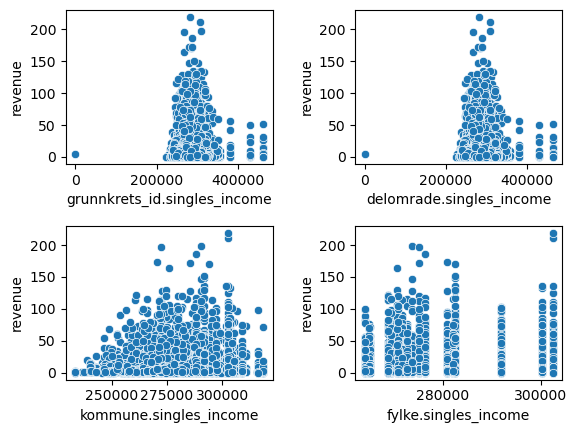

In [442]:
quad_geo_scatter(full_population_df, 'singles_income')


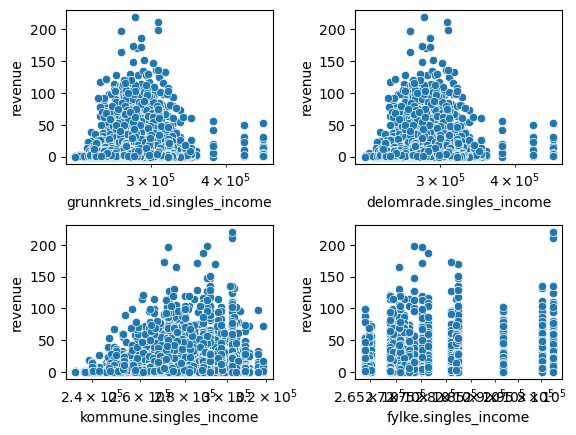

In [443]:
quad_geo_scatter(full_population_df, 'singles_income', xscale='log')


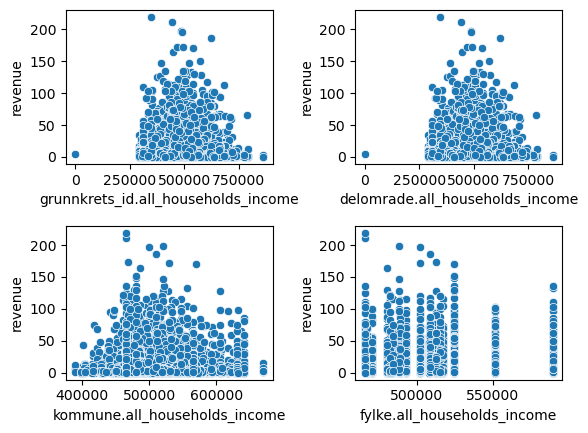

In [444]:
quad_geo_scatter(full_population_df, 'all_households_income')


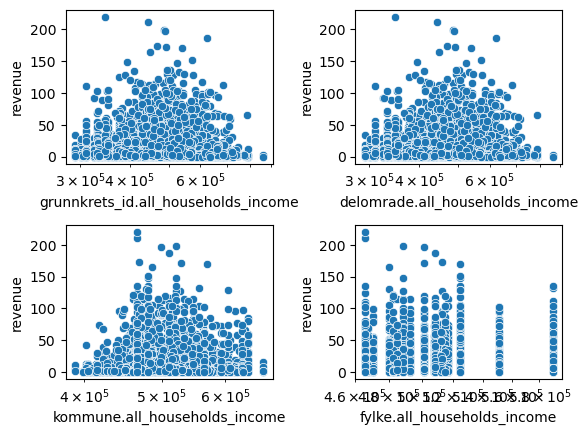

In [445]:
quad_geo_scatter(full_population_df, 'all_households_income', xscale='log')


### Combine income and households 

In [446]:
full_population_df['grunnkrets_id.total_income']  = full_population_df['grunnkrets_id.all_households_income']*full_population_df['grunnkrets_id.tot_household']
full_population_df['delomrade.total_income']  = full_population_df['delomrade.all_households_income']*full_population_df['delomrade.tot_household']
full_population_df['kommune.total_income']  = full_population_df['kommune.all_households_income']*full_population_df['kommune.tot_household']
full_population_df['fylke.total_income']  = full_population_df['fylke.all_households_income']*full_population_df['fylke.tot_household']

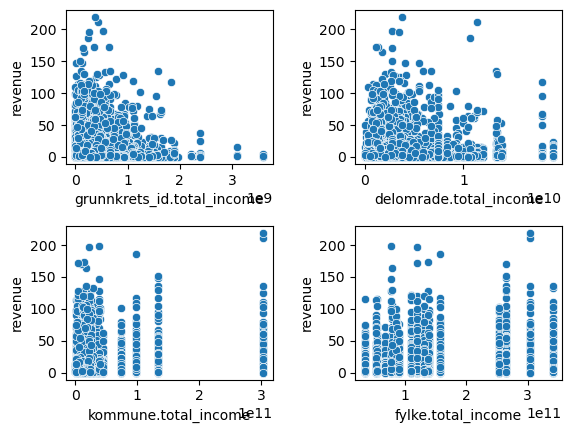

In [447]:
quad_geo_scatter(full_population_df, 'total_income')


In [448]:
full_population_df[['revenue'] + [f'{level}.total_income' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.total_income,delomrade.total_income,kommune.total_income,fylke.total_income
revenue,1.0,0.003614,0.02276,0.007824,0.004693


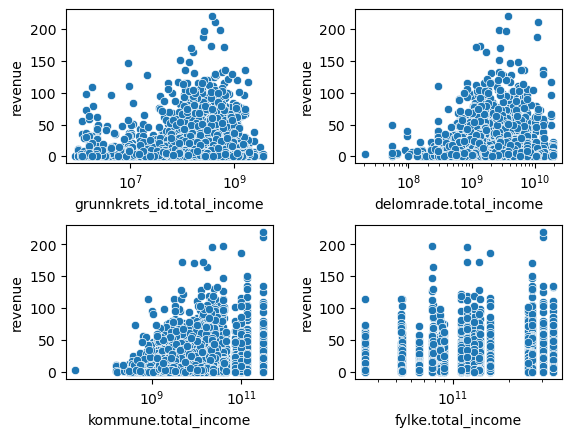

In [449]:
quad_geo_scatter(full_population_df, 'total_income', xscale='log')


Log looks more promising

In [450]:
full_population_df['grunnkrets_id.total_income_log']  = np.log1p(full_population_df['grunnkrets_id.all_households_income']*full_population_df['grunnkrets_id.tot_household'])
full_population_df['delomrade.total_income_log']  = np.log1p(full_population_df['delomrade.all_households_income']*full_population_df['delomrade.tot_household'])
full_population_df['kommune.total_income_log']  = np.log1p(full_population_df['kommune.all_households_income']*full_population_df['kommune.tot_household'])
full_population_df['fylke.total_income_log']  = np.log1p(full_population_df['fylke.all_households_income']*full_population_df['fylke.tot_household'])

In [451]:
full_population_df[['revenue'] + [f'{level}.total_income_log' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.total_income_log,delomrade.total_income_log,kommune.total_income_log,fylke.total_income_log
revenue,1.0,-0.031601,0.033948,0.0237,0.005088


In [452]:
full_population_df['grunnkrets_id.income_density']  = full_population_df['grunnkrets_id.total_income']/full_population_df['grunnkrets_id.area_km2']
full_population_df['delomrade.income_density']  = full_population_df['delomrade.total_income']/full_population_df['delomrade.area_km2']
full_population_df['kommune.income_density']  = full_population_df['kommune.total_income']/full_population_df['kommune.area_km2']
full_population_df['fylke.income_density']  = full_population_df['fylke.total_income']/full_population_df['fylke.area_km2']

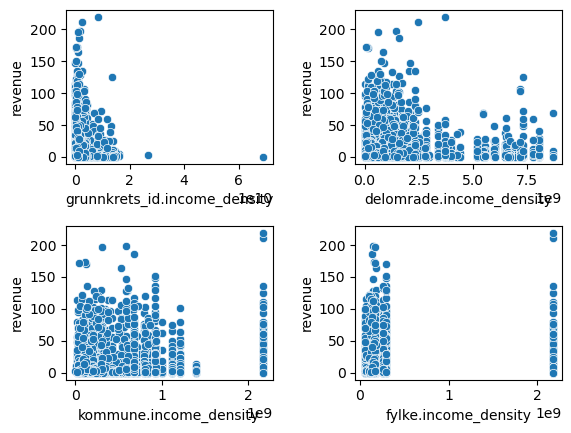

In [453]:
quad_geo_scatter(full_population_df, 'income_density')


In [454]:
full_population_df[['revenue'] + [f'{level}.income_density' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.income_density,delomrade.income_density,kommune.income_density,fylke.income_density
revenue,1.0,-0.032173,-0.010781,0.002872,-0.000496


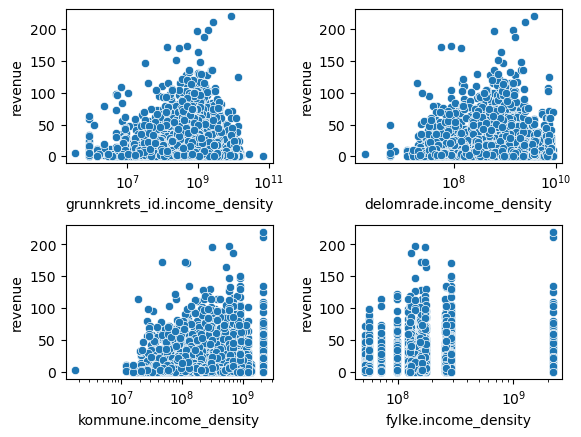

In [455]:
quad_geo_scatter(full_population_df, 'income_density', xscale='log')


In [456]:
full_population_df['grunnkrets_id.income_density_log']  = np.log1p(full_population_df['grunnkrets_id.total_income']/full_population_df['grunnkrets_id.area_km2'])
full_population_df['delomrade.income_density_log']  = np.log1p(full_population_df['delomrade.total_income']/full_population_df['delomrade.area_km2'])
full_population_df['kommune.income_density_log']  = np.log1p(full_population_df['kommune.total_income']/full_population_df['kommune.area_km2'])
full_population_df['fylke.income_density_log']  = np.log1p(full_population_df['fylke.total_income']/full_population_df['fylke.area_km2'])

In [457]:
full_population_df[['revenue'] + [f'{level}.income_density_log' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.income_density_log,delomrade.income_density_log,kommune.income_density_log,fylke.income_density_log
revenue,1.0,-0.054621,0.000576,0.014032,0.006418


This could maybe also be combined with store density

### Population density

In [458]:
for level in levels:
    full_population_df[f'{level}.pop_density'] = full_population_df[f'{level}.tot_pop']/full_population_df[f'{level}.area_km2']
    full_population_df[f'{level}.pop_density_log'] = np.log1p(full_population_df[f'{level}.tot_pop']/full_population_df[f'{level}.area_km2'])


In [459]:
full_population_df[['revenue'] + [f'{level}.pop_density' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.pop_density,delomrade.pop_density,kommune.pop_density,fylke.pop_density
revenue,1.0,-0.029476,-0.013859,0.003216,-0.000579


In [460]:
full_population_df[['revenue'] + [f'{level}.pop_density_log' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.pop_density_log,delomrade.pop_density_log,kommune.pop_density_log,fylke.pop_density_log
revenue,1.0,-0.033183,-0.004951,0.013769,0.00622


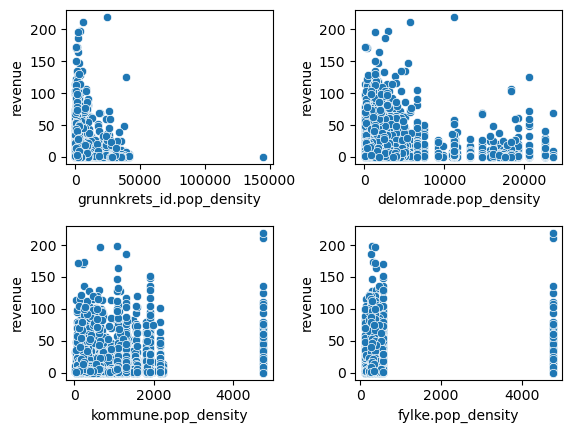

In [461]:
quad_geo_scatter(full_population_df, 'pop_density')


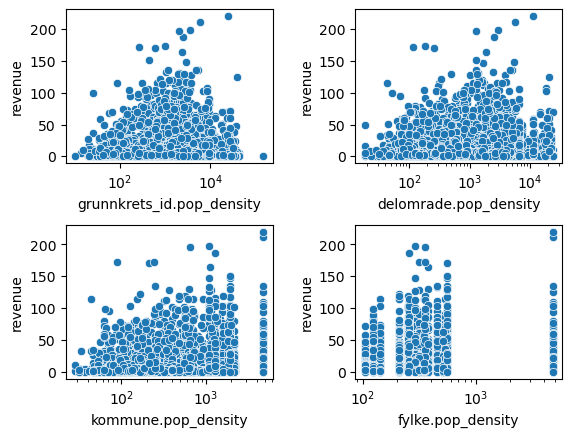

In [462]:
quad_geo_scatter(full_population_df, 'pop_density', xscale='log')


## Total number of stores in plaace and geographical units 

In [463]:
import pandas as pd
from sklearn.model_selection import train_test_split

stores_total_train = pd.read_csv("data/stores_train.csv")
stores_test = pd.read_csv("data/stores_test.csv")
stores_extra = pd.read_csv("data/stores_extra.csv")
stores_train, stores_val = train_test_split(stores_total_train, test_size=0.2, random_state=0)

In [464]:
def split_plaace_cat(df):
    df["plaace_cat_1"] = df["plaace_hierarchy_id"].apply(lambda x: str(x.split('.')[0]))
    df["plaace_cat_2"] = df["plaace_hierarchy_id"].apply(lambda x: str('.'.join(x.split('.')[:2])))
    df["plaace_cat_3"] = df["plaace_hierarchy_id"].apply(lambda x: str('.'.join(x.split('.')[:3])))
    df["plaace_cat_4"] = df["plaace_hierarchy_id"]
    return df

In [465]:
geo_df = pd.concat([ stores_total_train, stores_extra , stores_test])
geo_df = geo_df[['grunnkrets_id', 'store_id', 'plaace_hierarchy_id']]
geo_df = create_geographical_columns(geo_df)
geo_df = split_plaace_cat(geo_df)
results_df = geo_df.copy()
geo_df['count'] = 1
geo_df.head()


,grunnkrets_id,store_id,plaace_hierarchy_id,fylke,kommune,delomrade,plaace_cat_1,plaace_cat_2,plaace_cat_3,plaace_cat_4,count
0,6020303,983540538-974187930-44774,1.1.1.0,6,602,60203,1,1.1,1.1.1,1.1.1.0,1
1,3010306,987074191-973117734-44755,1.1.1.0,3,301,30103,1,1.1,1.1.1,1.1.1.0,1
2,6050102,984890265-981157303-64491,1.1.1.0,6,605,60501,1,1.1,1.1.1,1.1.1.0,1
3,18040102,914057442-992924179-126912,1.1.1.0,18,1804,180401,1,1.1,1.1.1,1.1.1.0,1
4,16017414,913018583-913063538-668469,1.1.1.0,16,1601,160174,1,1.1,1.1.1,1.1.1.0,1


Iterate over all combinations and calculate 

In [466]:
for level in levels:
    for cat in plaace_cols:
        grouped = geo_df.groupby([ level , cat]).sum()['count'].to_frame()
        grouped['count']
        grouped.rename(columns= {'count':f'{level}.{cat}_count'}, inplace=True)
        grouped.to_csv(path_or_buf=f"temp_data/store_nums_{level}_{cat}.csv", index=True)
    grouped = geo_df.groupby([ level ]).sum()['count'].to_frame()
    grouped.rename(columns= {'count':f'{level}.count'}, inplace=True)
    grouped.to_csv(path_or_buf=f"temp_data/store_nums_{level}.csv", index=True)

In [467]:
for level in levels:
    for cat in plaace_cols:
        csv_name = f"temp_data/store_nums_{level}_{cat}.csv" 
        store_counts_df = pd.read_csv(csv_name, dtype={cat: object})
        results_df = pd.merge(results_df, store_counts_df, how='left', on=[level, cat])
    csv_name = f"temp_data/store_nums_{level}.csv" 
    store_counts_df = pd.read_csv(csv_name)
    results_df = pd.merge(results_df, store_counts_df, how='left', on=[level])

In [468]:
results_df.head()

,grunnkrets_id,store_id,plaace_hierarchy_id,fylke,kommune,delomrade,plaace_cat_1,plaace_cat_2,plaace_cat_3,plaace_cat_4,...,kommune.plaace_cat_1_count,kommune.plaace_cat_2_count,kommune.plaace_cat_3_count,kommune.plaace_cat_4_count,kommune.count,fylke.plaace_cat_1_count,fylke.plaace_cat_2_count,fylke.plaace_cat_3_count,fylke.plaace_cat_4_count,fylke.count
0,6020303,983540538-974187930-44774,1.1.1.0,6,602,60203,1,1.1,1.1.1,1.1.1.0,...,171,122,3,3,819,572,417,9,9,2741
1,3010306,987074191-973117734-44755,1.1.1.0,3,301,30103,1,1.1,1.1.1,1.1.1.0,...,2186,1592,35,35,7267,2186,1592,35,35,7267
2,6050102,984890265-981157303-64491,1.1.1.0,6,605,60501,1,1.1,1.1.1,1.1.1.0,...,57,40,1,1,300,572,417,9,9,2741
3,18040102,914057442-992924179-126912,1.1.1.0,18,1804,180401,1,1.1,1.1.1,1.1.1.0,...,117,85,2,2,551,500,369,3,3,2498
4,16017414,913018583-913063538-668469,1.1.1.0,16,1601,160174,1,1.1,1.1.1,1.1.1.0,...,471,341,7,7,1910,665,487,7,7,2924


In [469]:
results_df.to_csv(path_or_buf=f"temp_data/num_stores.csv", index=True)

In [470]:
num_stores = pd.read_csv('temp_data/num_stores.csv')
num_stores_df = pd.merge(full_population_df, num_stores, on='store_id', how='left')

num_stores_df.columns

Index(['store_id', 'year', 'store_name', 'plaace_hierarchy_id_x',
       'sales_channel_name', 'grunnkrets_id_x', 'address', 'lat', 'lon',
       'chain_name',
       ...
       'kommune.plaace_cat_1_count', 'kommune.plaace_cat_2_count',
       'kommune.plaace_cat_3_count', 'kommune.plaace_cat_4_count',
       'kommune.count', 'fylke.plaace_cat_1_count', 'fylke.plaace_cat_2_count',
       'fylke.plaace_cat_3_count', 'fylke.plaace_cat_4_count', 'fylke.count'],
      dtype='object', length=261)

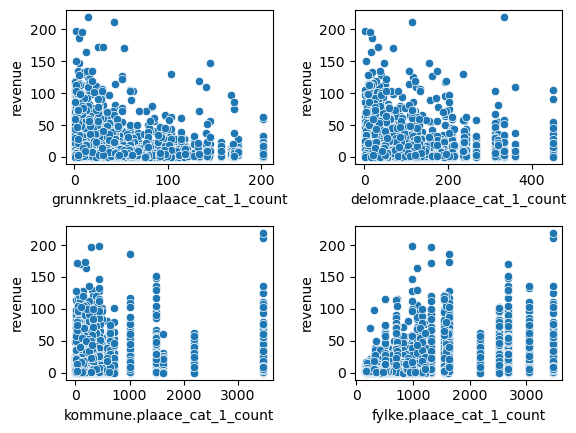

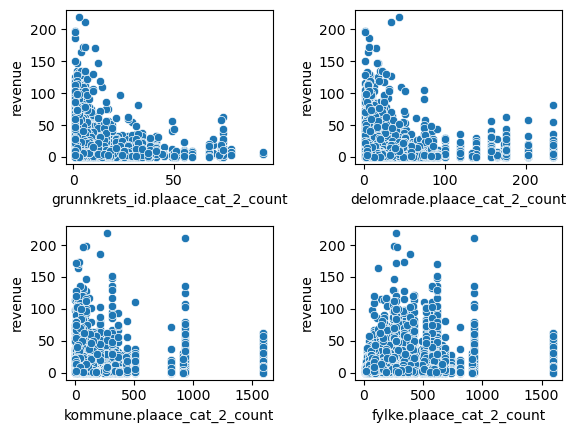

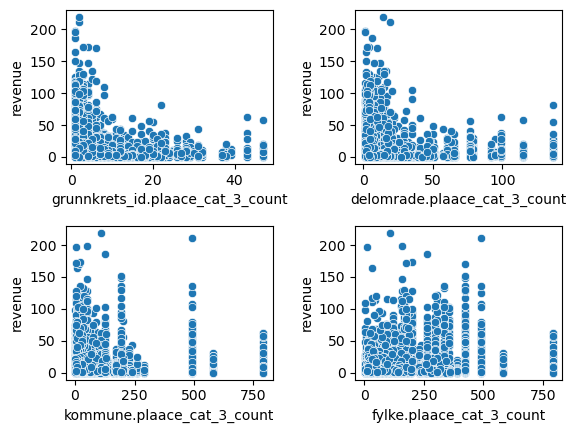

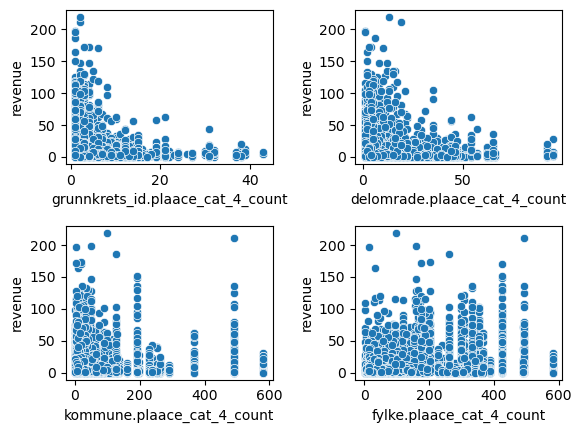

In [471]:
for cat in plaace_cols:
    quad_geo_scatter(num_stores_df, f'{cat}_count')

In [472]:

num_stores_df[['revenue'] + [f'{level}.plaace_cat_1_count' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.plaace_cat_1_count,delomrade.plaace_cat_1_count,kommune.plaace_cat_1_count,fylke.plaace_cat_1_count
revenue,1.0,0.04622,0.058717,0.057294,0.167402


In [473]:

num_stores_df[['revenue'] + [f'{level}.plaace_cat_2_count' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.plaace_cat_2_count,delomrade.plaace_cat_2_count,kommune.plaace_cat_2_count,fylke.plaace_cat_2_count
revenue,1.0,-0.017245,-0.006837,0.008128,0.027939


In [474]:

num_stores_df[['revenue'] + [f'{level}.plaace_cat_3_count' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.plaace_cat_3_count,delomrade.plaace_cat_3_count,kommune.plaace_cat_3_count,fylke.plaace_cat_3_count
revenue,1.0,-0.003791,0.012285,0.024312,0.11999


In [475]:

num_stores_df[['revenue'] + [f'{level}.plaace_cat_4_count' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.plaace_cat_4_count,delomrade.plaace_cat_4_count,kommune.plaace_cat_4_count,fylke.plaace_cat_4_count
revenue,1.0,-0.017586,0.000531,0.03195,0.161784


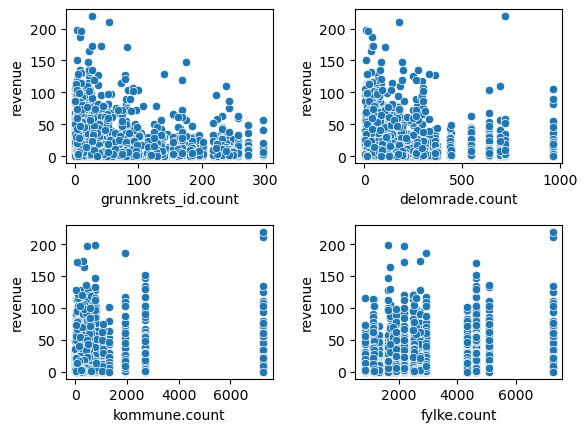

In [476]:
quad_geo_scatter(num_stores_df, 'count')

In [477]:

num_stores_df[['revenue'] + [f'{level}.count' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.count,delomrade.count,kommune.count,fylke.count
revenue,1.0,-0.012793,-0.005773,0.006751,0.003436


### Number of stores interactions

In [478]:
num_stores_df['log_revenue'] = np.log1p(num_stores_df['revenue'])

In [479]:
for level in levels:
    for cat in plaace_cols:
        num_stores_df[f'{level}.{cat}_per_capita'] = num_stores_df[f'{level}.{cat}_count'] / num_stores_df[f'{level}.tot_pop']

In [480]:

num_stores_df[['revenue'] + [f'{level}.plaace_cat_1_per_capita' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.plaace_cat_1_per_capita,delomrade.plaace_cat_1_per_capita,kommune.plaace_cat_1_per_capita,fylke.plaace_cat_1_per_capita
revenue,1.0,0.011993,0.02751,0.204476,0.250646


In [481]:

num_stores_df[['revenue'] + [f'{level}.plaace_cat_2_per_capita' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.plaace_cat_2_per_capita,delomrade.plaace_cat_2_per_capita,kommune.plaace_cat_2_per_capita,fylke.plaace_cat_2_per_capita
revenue,1.0,-0.011821,-0.002396,0.010652,0.060561


In [482]:

num_stores_df[['revenue'] + [f'{level}.plaace_cat_3_per_capita' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.plaace_cat_3_per_capita,delomrade.plaace_cat_3_per_capita,kommune.plaace_cat_3_per_capita,fylke.plaace_cat_3_per_capita
revenue,1.0,0.000228,0.007448,0.084327,0.21149


In [483]:

num_stores_df[['revenue'] + [f'{level}.plaace_cat_4_per_capita' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.plaace_cat_4_per_capita,delomrade.plaace_cat_4_per_capita,kommune.plaace_cat_4_per_capita,fylke.plaace_cat_4_per_capita
revenue,1.0,-0.01315,-0.002612,0.096388,0.25173


Some of these features look promising

In [484]:
for level in levels:
    for cat in plaace_cols:
        num_stores_df[f'{level}.{cat}_per_km2'] = num_stores_df[f'{level}.{cat}_count'] / num_stores_df[f'{level}.area_km2']

In [485]:
num_stores_df[['revenue'] + [f'{level}.plaace_cat_1_per_km2' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.plaace_cat_1_per_km2,delomrade.plaace_cat_1_per_km2,kommune.plaace_cat_1_per_km2,fylke.plaace_cat_1_per_km2
revenue,1.0,0.001923,0.015579,0.078759,0.049149


In [486]:
num_stores_df[['revenue'] + [f'{level}.plaace_cat_2_per_km2' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.plaace_cat_2_per_km2,delomrade.plaace_cat_2_per_km2,kommune.plaace_cat_2_per_km2,fylke.plaace_cat_2_per_km2
revenue,1.0,-0.023678,-0.012952,0.005736,0.006557


In [487]:
num_stores_df[['revenue'] + [f'{level}.plaace_cat_3_per_km2' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.plaace_cat_3_per_km2,delomrade.plaace_cat_3_per_km2,kommune.plaace_cat_3_per_km2,fylke.plaace_cat_3_per_km2
revenue,1.0,-0.013409,-0.004673,0.032477,0.025939


In [488]:
num_stores_df[['revenue'] + [f'{level}.plaace_cat_4_per_km2' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.plaace_cat_4_per_km2,delomrade.plaace_cat_4_per_km2,kommune.plaace_cat_4_per_km2,fylke.plaace_cat_4_per_km2
revenue,1.0,-0.019765,-0.019886,0.04489,0.03656


These look less promising

In [489]:
for level in levels:
    for cat in plaace_cols:
        num_stores_df[f'{level}.{cat}_per_tot_income'] = num_stores_df[f'{level}.{cat}_count'] / num_stores_df[f'{level}.total_income']
        num_stores_df[f'{level}.{cat}_per_tot_income_log'] = np.log1p(num_stores_df[f'{level}.{cat}_per_tot_income'])

In [490]:
num_stores_df[['revenue'] + [f'{level}.plaace_cat_1_per_tot_income' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.plaace_cat_1_per_tot_income,delomrade.plaace_cat_1_per_tot_income,kommune.plaace_cat_1_per_tot_income,fylke.plaace_cat_1_per_tot_income
revenue,1.0,0.033652,0.019525,0.194004,0.245292


In [491]:
num_stores_df[['revenue'] + [f'{level}.plaace_cat_2_per_tot_income' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.plaace_cat_2_per_tot_income,delomrade.plaace_cat_2_per_tot_income,kommune.plaace_cat_2_per_tot_income,fylke.plaace_cat_2_per_tot_income
revenue,1.0,0.021205,-0.001557,0.008637,0.058272


In [492]:
num_stores_df[['revenue'] + [f'{level}.plaace_cat_3_per_tot_income' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.plaace_cat_3_per_tot_income,delomrade.plaace_cat_3_per_tot_income,kommune.plaace_cat_3_per_tot_income,fylke.plaace_cat_3_per_tot_income
revenue,1.0,0.017354,0.006386,0.070352,0.20426


In [493]:
num_stores_df[['revenue'] + [f'{level}.plaace_cat_4_per_tot_income' for level in levels]].corr().head(1)

,revenue,grunnkrets_id.plaace_cat_4_per_tot_income,delomrade.plaace_cat_4_per_tot_income,kommune.plaace_cat_4_per_tot_income,fylke.plaace_cat_4_per_tot_income
revenue,1.0,0.016739,-0.004125,0.080292,0.247218


## Impute nans

In [494]:
def impute_geography(row: pd.Series):
    def impute_geography_internal(new_row: pd.Series, i: int):
        for col in row.index:
            if column.startswith(levels[::-1][i+1]):
                new_row[col] = new_row[col.replace(levels[::-1][i+1], levels[::-1][i])]
    new_row = row.copy()
    for i, level in enumerate(levels[::-1][1:]):
        has_nans = False
        for column in row.index:
            if column.startswith(level) and np.isnan(new_row[column]):
                has_nans = True
                break
        if has_nans:
            impute_geography_internal(new_row, i)
    return new_row

    
    
full_population_df = full_population_df.apply(impute_geography, axis = 1)

## Some data analysis 

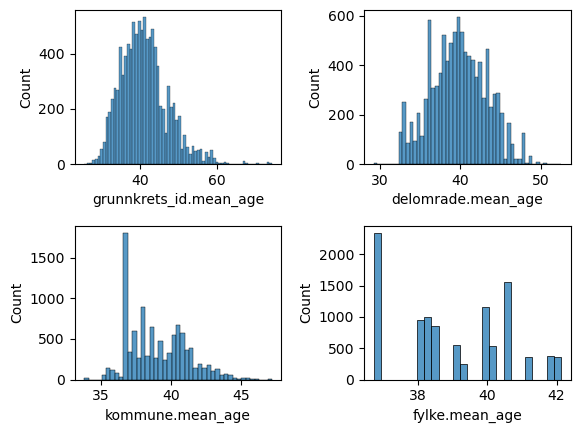

In [496]:
from plot_utils import quad_geo_histogram
quad_geo_histogram(full_population_df, 'mean_age')

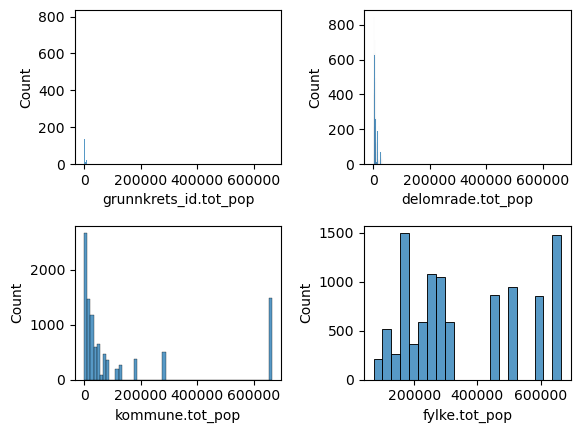

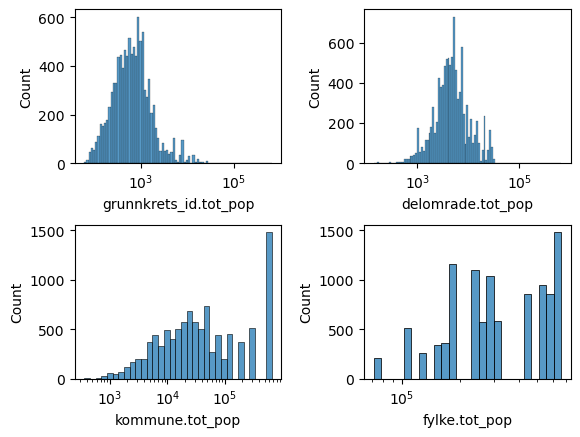

In [497]:
quad_geo_histogram(full_population_df, 'tot_pop', log=False)
quad_geo_histogram(full_population_df, 'tot_pop', log=True)

We should consider taking the log an removing the outliers

# Investigation of missing grunnkrets-data

In [498]:
# Magic to automatically update imports if functions in utils are changed
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import seaborn as sns
import sklearn
import matplotlib.pyplot as plt

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [499]:
age_distribution = pd.read_csv("data/grunnkrets_age_distribution.csv")
new_age_distribution = preprocess_grunnkrets_df(age_distribution)
new_age_distribution.shape

(11379, 96)

In [500]:
house_distribution = pd.read_csv("data/grunnkrets_households_num_persons.csv")
new_house_distribution = preprocess_grunnkrets_df(house_distribution)
new_house_distribution.shape

(13035, 13)

In [501]:
income_distribution = pd.read_csv("data/grunnkrets_income_households.csv")
new_income_distribution = preprocess_grunnkrets_df(income_distribution)
new_income_distribution.shape

(13269, 11)

In [502]:
base_distribution = pd.read_csv("data/grunnkrets_norway_stripped.csv")
new_base_distribution = preprocess_grunnkrets_df(base_distribution)
new_base_distribution.shape

(13270, 10)

## Train 


In [515]:
from sklearn.model_selection import train_test_split

stores_train = pd.read_csv("data/stores_train.csv")
# stores_train, _ = train_test_split(stores_train, test_size=0.2, random_state=0)
stores_train = create_geographical_columns(stores_train)

In [516]:
stores_train.shape

(12859, 15)

In [517]:
stores_train['grunnkrets_id'].unique().shape
nums = set()
for i in set(stores_train['grunnkrets_id']):
    if not i in list(new_age_distribution['grunnkrets_id']):
        nums.add(i)
print(nums)
len(nums)

{1050113, 16017409, 11290103, 6020609, 16017414, 18180103, 16017415, 8260104, 16017418, 6020107, 20300301, 12010515, 10180116, 3015701, 5170202, 4150306, 12440102, 12440103, 18050601, 4030511, 5400113, 2191412, 3010101, 10011702, 3010103, 18370103, 3010614, 14210107, 14210108, 3014204, 3014209, 12430402, 5420101, 3013701, 2130506, 18040907, 16240204, 2130509, 8061006, 18040401, 7041107, 11490901, 3013719, 8150103, 8150105, 6020703, 18330218, 6020714, 7040113, 16200305, 8050801, 19020401, 16017525, 10180213, 7090807, 1062008, 18410107, 3015804, 12330109, 3015805, 20190201, 2192009, 3011210, 12010636, 10260108, 8340112, 20030101, 18110102, 16011417, 20180122, 2191516, 3010211, 3014307, 14120103, 3013801, 9140401, 9140402, 11031734, 11031736, 17490105, 17490106, 18450105, 11031737, 1063101, 8060601, 18650306, 1063107, 16380101, 8060101, 20220109, 18150101, 19430101, 8260316, 12240619, 12010225, 4030707, 5020404, 17210101, 1061110, 4120308, 16011514, 16011516, 14010109, 3010305, 3010306, 2

217

{'grunnkrets_id': {'age': {1050113,
   1052506,
   1061110,
   1062008,
   1063101,
   1063107,
   1063201,
   1064206,
   2130506,
   2130509,
   2160506,
   2170115,
   2170301,
   2190217,
   2190814,
   2190817,
   2190825,
   2191412,
   2191516,
   2192009,
   2300301,
   2310112,
   2311114,
   2350503,
   3010101,
   3010103,
   3010211,
   3010305,
   3010306,
   3010310,
   3010614,
   3011210,
   3012407,
   3013510,
   3013616,
   3013701,
   3013719,
   3013801,
   3014008,
   3014204,
   3014209,
   3014307,
   3015006,
   3015701,
   3015804,
   3015805,
   3016001,
   3016006,
   4030410,
   4030511,
   4030707,
   4120308,
   4120404,
   4150306,
   4280303,
   4320201,
   4380108,
   5010402,
   5020404,
   5150101,
   5170103,
   5170202,
   5210111,
   5400113,
   5420101,
   5430106,
   5450115,
   5450117,
   6020107,
   6020402,
   6020609,
   6020703,
   6020714,
   6120203,
   6200108,
   6200211,
   6220204,
   6280108,
   7040113,
   7040302,
   7041107,
   7

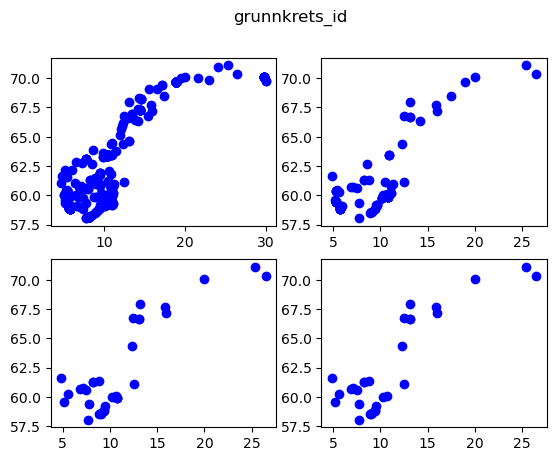

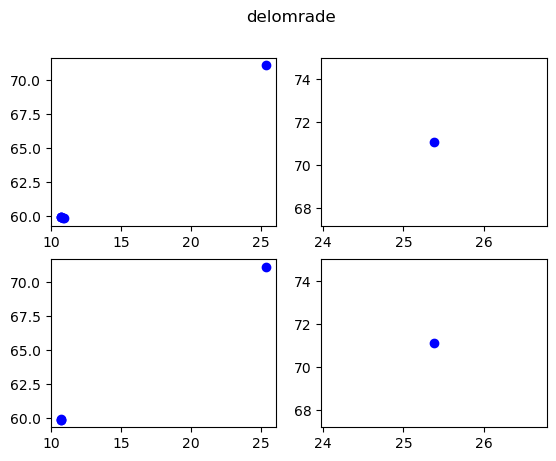

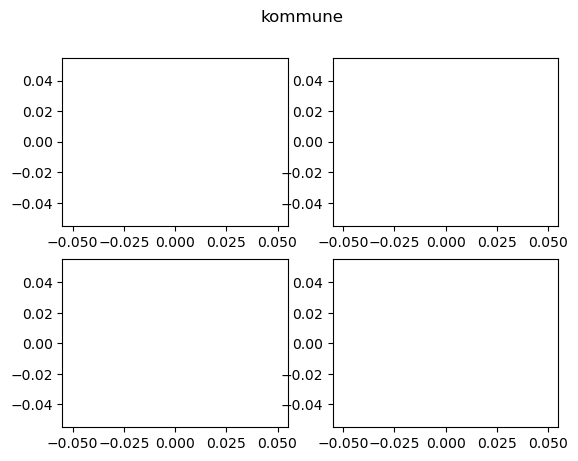

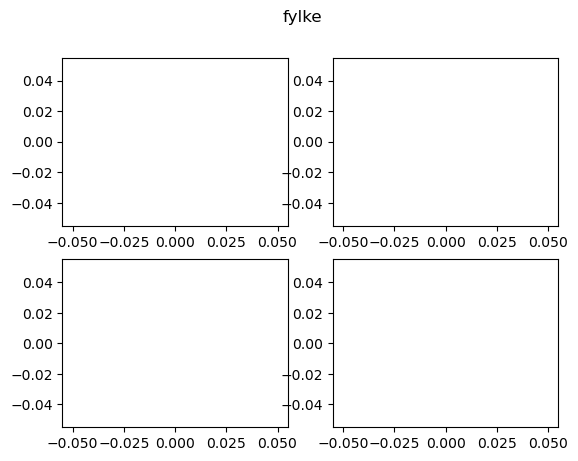

In [518]:
import matplotlib.pyplot as plt
pos = ([0,0],[0,1], [1,0], [1,1])
names = ['age', 'house', 'income', 'base']
levels = ['grunnkrets_id', 'delomrade', 'kommune', 'fylke']
train_nans_level_ids = dict()
train_nans_store_ids = dict()


for level in levels:
    train_nans_level_ids[level] = dict()
    train_nans_store_ids[level] = dict()
    fig, axs = plt.subplots(2,2)
    fig.suptitle(level)
    axs = axs.flatten()
    for i, (name, df) in enumerate( zip( names, [new_age_distribution, new_house_distribution, new_income_distribution, new_base_distribution] )):
        base = set(stores_train[level].values)
        age = set(df[level].values)
        nums = base - age
        train_nans_level_ids[level][name] = nums
        # print(len(base))
        # print(len(age))
        # print(len(nums))
        # print()
        missing_df = stores_train[stores_train[level].isin(list(nums))]
        train_nans_store_ids[level][name] = list(missing_df.index)
        axs[i].plot(missing_df["lon"], missing_df["lat"], "bo")
train_nans_level_ids

In [528]:
train_nans_store_ids['delomrade']['age']

[409, 451, 565, 868, 7106, 7847]

In [533]:
stores_train.loc[train_nans_store_ids['delomrade']['age']]['store_id'].values

array(['913016769-971957379-22225', '979928289-974384574-147400',
       '915881157-986981713-9664', '834577852-972362697-44517',
       '888384782-915473709-769022', '946165387-973243861-1223'],
      dtype=object)

We can see that there are a bunch of stores missing grunnkrets, and a few missing delomrade. These have to be imputed somehow. First approach is just bump them up to the level above. Might also concider taking the average of all contained in the level above.

The ones missing delomrade can probably be removed, as there are only 6

## Test 


In [534]:
stores_test = pd.read_csv("data/stores_test.csv")
stores_test = preprocess_grunnkrets_df(stores_test)

{'grunnkrets_id': {'age': {1061110,
   1062008,
   1063107,
   1063201,
   1064206,
   1110103,
   2130506,
   2130509,
   2170115,
   2170301,
   2190217,
   2190814,
   2190817,
   2190821,
   2190825,
   2190920,
   2191105,
   2191412,
   2191514,
   2191516,
   2191715,
   2300301,
   2311114,
   2330412,
   2350503,
   3010101,
   3010103,
   3010211,
   3010305,
   3010306,
   3010310,
   3010614,
   3013510,
   3013616,
   3013801,
   3013814,
   3014008,
   3014204,
   3014209,
   3014307,
   3015006,
   3016001,
   4020509,
   4030511,
   4030707,
   4120303,
   4120308,
   4230302,
   4300306,
   4380108,
   5020404,
   5130101,
   5130210,
   5140110,
   5170103,
   5170202,
   5210112,
   5220306,
   5280308,
   5290409,
   6020402,
   6020505,
   6020609,
   6020714,
   6120205,
   6200211,
   6280108,
   6280302,
   7040108,
   7040111,
   7041107,
   7041305,
   7060411,
   7090807,
   8060503,
   8060601,
   8060812,
   8061401,
   8290103,
   8330108,
   8340112,
   9

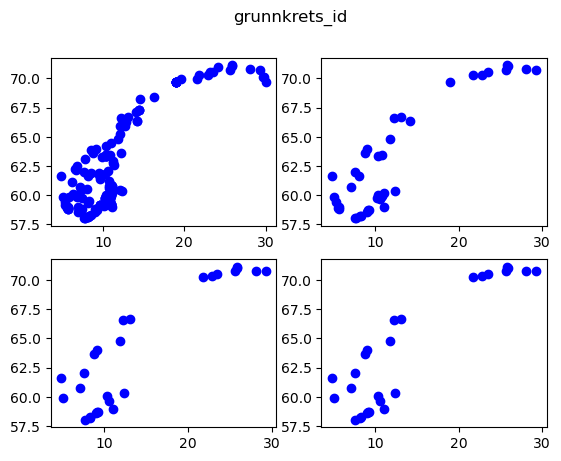

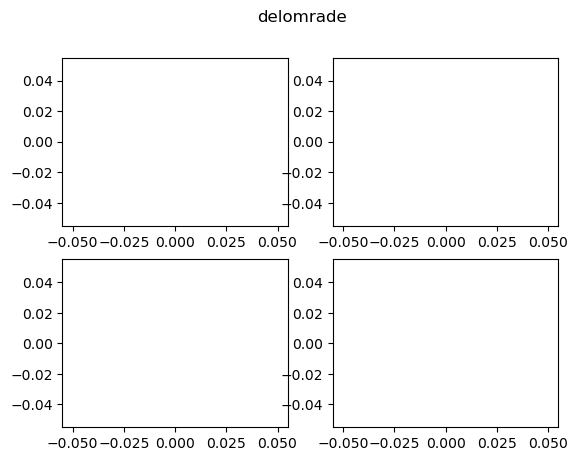

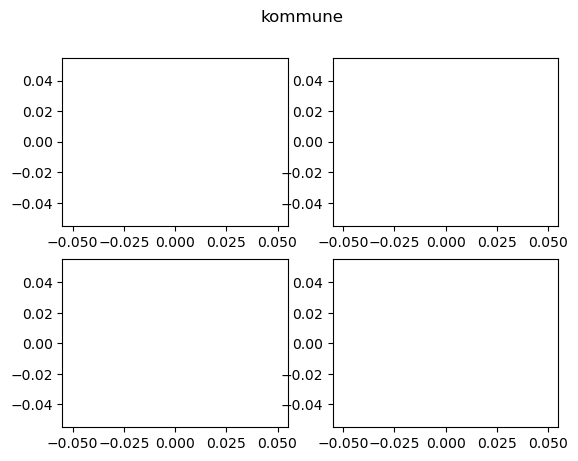

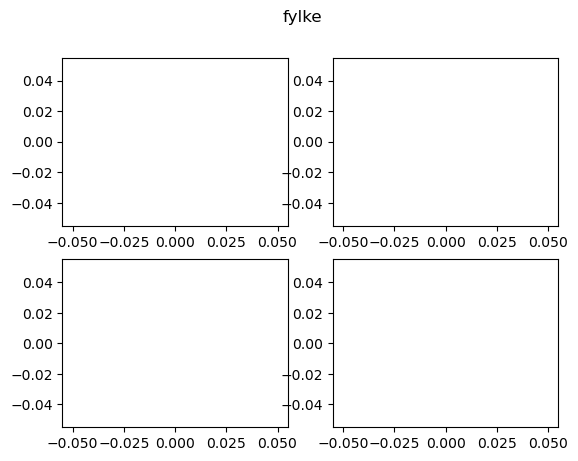

In [535]:
import matplotlib.pyplot as plt
pos = ([0,0],[0,1], [1,0], [1,1])
names = ['age', 'house', 'income', 'base']
levels = ['grunnkrets_id', 'delomrade', 'kommune', 'fylke']
test_nans_level_ids = dict()
test_nans_store_ids = dict()


for level in levels:
    test_nans_level_ids[level] = dict()
    test_nans_store_ids[level] = dict()
    fig, axs = plt.subplots(2,2)
    fig.suptitle(level)
    axs = axs.flatten()
    for i, (name, df) in enumerate( zip( names, [new_age_distribution, new_house_distribution, new_income_distribution, new_base_distribution] )):
        base = set(stores_test[level].values)
        age = set(df[level].values)
        nums = base - age
        test_nans_level_ids[level][name] = nums
        # print(len(base))
        # print(len(age))
        # print(len(nums))
        # print()
        missing_df = stores_test[stores_test[level].isin(list(nums))]
        test_nans_store_ids[level][name] = list(missing_df.index)
        axs[i].plot(missing_df["lon"], missing_df["lat"], "bo")
test_nans_level_ids

All stores in the test set have delomrade, so it might be okay to remove the ones missing delomrade from train, and to concider mostly delomrade features in the model

## Target encoding 

In [536]:
%load_ext autoreload
%autoreload 2
import pandas as pd
from sklearn.model_selection import train_test_split

stores_total_train = pd.read_csv("data/stores_train.csv")
stores_test = pd.read_csv("data/stores_test.csv")
stores_train, stores_val = train_test_split(stores_total_train, test_size=0.2, random_state=0)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [537]:
revenue_df = split_plaace_cat(create_geographical_columns(stores_train))
revenue_df_total = split_plaace_cat(create_geographical_columns(stores_total_train))
result_df_val = split_plaace_cat(create_geographical_columns(stores_val))
result_df_test = split_plaace_cat(create_geographical_columns(stores_test))
result_df_test_total = split_plaace_cat(create_geographical_columns(stores_test))

/tmp/ipykernel_16041/141921321.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe["fylke"] = dataframe[grunnkrets_column_name].apply(
/tmp/ipykernel_16041/141921321.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe["kommune"] = dataframe[grunnkrets_column_name].apply(
/tmp/ipykernel_16041/141921321.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

Calculate the mean revenue for all combiantions of plaace and geographical unit

In [538]:
result_df = revenue_df.copy()
revenue_df_dict : dict[str, pd.DataFrame]
revenue_df_dict_total : dict[str, pd.DataFrame]
revenue_df_dict = {}
revenue_df_dict_total = {}
for level in levels:
    grouped_df = revenue_df.groupby([level, 'plaace_cat_1']).mean()['revenue'].to_frame()
    grouped_df_total = revenue_df_total.groupby([level, 'plaace_cat_1']).mean()['revenue'].to_frame()
    grouped_df.rename(columns={'revenue':f'{level}.mean_revenue'}, inplace=True)
    grouped_df_total.rename(columns={'revenue':f'{level}.mean_revenue'}, inplace=True)
    revenue_df_dict[level] = grouped_df
    revenue_df_dict_total[level] = grouped_df_total
    result_df = pd.merge(result_df, grouped_df, right_index=True, left_on=[level, 'plaace_cat_1'], how='left')
    result_df_val = pd.merge(result_df_val, grouped_df, right_index=True, left_on=[level, 'plaace_cat_1'], how='left')
    result_df_test = pd.merge(result_df_test, grouped_df, right_index=True, left_on=[level, 'plaace_cat_1'], how='left')
    result_df_test_total = pd.merge(result_df_test_total, grouped_df_total, right_index=True, left_on=[level, 'plaace_cat_1'], how='left')

In [544]:
result_df =  result_df[[f'{level}.mean_revenue' for level in levels]+['store_id', 'revenue']]
result_df_val =  result_df_val[[f'{level}.mean_revenue' for level in levels]+['store_id', 'revenue']]
result_df_test =  result_df_test[[f'{level}.mean_revenue' for level in levels]+['store_id']]
result_df_test_total =  result_df_test_total[[f'{level}.mean_revenue' for level in levels]+['store_id']]

In [540]:
result_df_val.shape

(2572, 6)

In [541]:
result_df_val.isna().sum()

grunnkrets_id.mean_revenue    818
delomrade.mean_revenue        227
kommune.mean_revenue           54
fylke.mean_revenue              0
store_id                        0
revenue                         0
dtype: int64

In [542]:
result_df_test.isna().sum()

grunnkrets_id.mean_revenue    2864
delomrade.mean_revenue         833
kommune.mean_revenue           202
fylke.mean_revenue               0
store_id                         0
dtype: int64

In [543]:
result_df_test_total.isna().sum()

grunnkrets_id.mean_revenue    2541
delomrade.mean_revenue         690
kommune.mean_revenue           159
fylke.mean_revenue               0
store_id                         0
dtype: int64

In [545]:
result_df.corr()

,grunnkrets_id.mean_revenue,delomrade.mean_revenue,kommune.mean_revenue,fylke.mean_revenue,revenue
grunnkrets_id.mean_revenue,1.000000,0.727092,0.489814,0.383120,0.727744
delomrade.mean_revenue,0.727092,1.000000,0.673662,0.526921,0.529137
kommune.mean_revenue,0.489814,0.673662,1.000000,0.782175,0.356459
fylke.mean_revenue,0.383120,0.526921,0.782175,1.000000,0.278813
revenue,0.727744,0.529137,0.356459,0.278813,1.000000


In [546]:
result_df_val.corr()

,grunnkrets_id.mean_revenue,delomrade.mean_revenue,kommune.mean_revenue,fylke.mean_revenue,revenue
grunnkrets_id.mean_revenue,1.000000,0.704734,0.490257,0.377568,0.126271
delomrade.mean_revenue,0.704734,1.000000,0.598586,0.476958,0.111950
kommune.mean_revenue,0.490257,0.598586,1.000000,0.811830,0.190145
fylke.mean_revenue,0.377568,0.476958,0.811830,1.000000,0.257962
revenue,0.126271,0.111950,0.190145,0.257962,1.000000


We see that the correlation with the train set is much higher than the correlation with the val set for some features. We must be careful with these as to not overfit

In [547]:
for level, df in revenue_df_dict.items():
    df.to_csv(f'temp_data/{level}_mean_revenue.csv')

In [548]:
for level, df in revenue_df_dict_total.items():
    df.to_csv(f'temp_data/{level}_mean_revenue_total.csv')

## Bus stops 

In [ ]:
# Magic to automatically update imports if functions in utils are changed
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import seaborn as sns
import sklearn
import matplotlib.pyplot as plt
import math

In [ ]:
from sklearn.model_selection import train_test_split

stores_train = pd.read_csv("data/stores_train.csv")
stores_test = pd.read_csv("data/stores_test.csv")
bus_routes = pd.read_csv("data/busstops_norway.csv")
#stores_train, stores_val = train_test_split(stores_train, test_size=0.2, random_state=0)

In [ ]:
bus_routes.head()

,busstop_id,stopplace_type,importance_level,side_placement,geometry
0,853cb081-cc32-4880-aa3e-26e96870d874,Plattform og lomme,Mangler viktighetsnivå,LEFT_AND_RIGHT,POINT(6.54064723379766 61.0618887850553)
1,156b052b-2771-497a-b4f4-97fed59e1aca,"Lomme og skilt, ikke plattform",Mangler viktighetsnivå,LEFT_AND_RIGHT,POINT(5.89980086113255 60.1421872817075)
2,7312a280-e14f-4b09-a421-02e8fe1bc63e,NaN,Mangler viktighetsnivå,MIDDLE_LEFT,POINT(10.7781327278563 59.9299988828761)
3,d9cda2c7-355a-49c1-b56c-a33180d2a82e,NaN,Mangler viktighetsnivå,MIDDLE_LEFT,POINT(10.7781496457324 59.9301044643692)
4,f803bcd3-182d-450b-bbb4-113c6ca885c2,NaN,Mangler viktighetsnivå,MIDDLE_RIGHT,POINT(10.7781676444854 59.9302099995898)


In [ ]:
bus_routes["point"] = bus_routes.geometry.apply(lambda x: np.array(x[6:-1].split(" ")).astype(float)[::-1])

In [ ]:
bus_routes["point"].sample(5)

4995     [60.6561707575921, 6.43238681983523]
40603    [69.4191512347866, 17.9464639513676]
61696    [67.0379889963233, 14.0348430576409]
11748    [66.0819599967427, 13.8276898429152]
31238    [60.8455988682468, 10.1019572884014]
Name: point, dtype: object

In [ ]:
from scipy.spatial.distance import cdist


def closest_point(point, points, n_closest = 3, _sum = False):
    """ Find closest point from a list of points. """
    if(len(points) == 0):
        return None
    dist_points = cdist([point], points)
    dist_points = dist_points.flatten()
    dist_points.sort()
    n_closest_dist = dist_points[:n_closest]
    if(_sum):
        return np.sum(n_closest_dist)
    return np.mean(n_closest_dist)

In [ ]:
stores_train["point"] = [(x, y) for x,y in zip(stores_train['lat'], stores_train['lon'])]

In [ ]:
stores_train['mean_3_closest_bus_stop'] = [closest_point(x["point"], list(bus_routes["point"])) for _, x in stores_train.iterrows()]

In [ ]:
stores_train["mean_3_closest_bus_stop"].describe()

count    12859.000000
mean         0.004861
std          0.015264
min          0.000231
25%          0.001614
50%          0.002499
75%          0.004204
max          0.499380
Name: mean_3_closest_bus_stop, dtype: float64

In [ ]:
stores_train['mean_1_closest_bus_stop'] = [closest_point(x["point"], list(bus_routes["point"]), 1) for _, x in stores_train.iterrows()]
stores_train['mean_5_closest_bus_stop'] = [closest_point(x["point"], list(bus_routes["point"]), 5) for _, x in stores_train.iterrows()]
stores_train['mean_7_closest_bus_stop'] = [closest_point(x["point"], list(bus_routes["point"]), 7) for _, x in stores_train.iterrows()]

In [ ]:
stores_train['sum_3_closest_bus_stop'] = [closest_point(x["point"], list(bus_routes["point"]), 3, _sum=True) for _, x in stores_train.iterrows()]
stores_train['sum_5_closest_bus_stop'] = [closest_point(x["point"], list(bus_routes["point"]), 5, _sum=True) for _, x in stores_train.iterrows()]
stores_train['sum_7_closest_bus_stop'] = [closest_point(x["point"], list(bus_routes["point"]), 7, _sum=True) for _, x in stores_train.iterrows()]

In [ ]:
stores_train.head()

,store_id,year,store_name,plaace_hierarchy_id,sales_channel_name,grunnkrets_id,address,lat,lon,chain_name,mall_name,revenue,point,mean_3_closest_bus_stop,mean_1_closest_bus_stop,mean_5_closest_bus_stop,mean_7_closest_bus_stop,sum_3_closest_bus_stop,sum_5_closest_bus_stop,sum_7_closest_bus_stop
2506,990857423-990974489-88185,2016,BAKER KLAUSEN UNION,1.2.2.0,Bakery shop,6020601,GRØNLAND 54,59.743135,10.194627,BAKER KLAUSEN DRAMMEN,NaN,4.447,"(59.74313530386021, 10.1946270640764)",0.002881,0.002032,0.003508,0.004101,0.008643,0.017540,0.028706
12305,948879220-972145203-18800,2016,PRIKKEN RENS AS,3.4.2.0,Laundromats and dry cleaners,2350203,ENERGIVEGEN 5,60.149288,11.187290,NaN,NaN,2.040,"(60.14928769290111, 11.1872899024035)",0.007244,0.002121,0.008454,0.009322,0.021733,0.042271,0.065255
4142,951136751-971668970-6795,2016,EXPERT HOKKSUND,2.3.1.0,Electronics stores,6240307,SUNDMOEN NÆRINGSOMRÅDE,59.768986,9.899066,EXPERT,NaN,36.489,"(59.7689864010885, 9.89906598218001)",0.001622,0.001458,0.001887,0.002409,0.004865,0.009434,0.016863
8561,980237508-980246167-71346,2016,INVIT AS,2.9.1.0,Gifts and interior design shops,15040206,APOTEKERGATA 9,62.471607,6.151301,NaN,NaN,5.739,"(62.4716074153893, 6.15130082978494)",0.005224,0.002676,0.008216,0.011220,0.015671,0.041079,0.078540
818,974421305-974489902-136560,2016,MUCHO MAS,1.1.6.2,Restaurants,3012312,THORVALD MEYERS GATE 36,59.924205,10.759401,NaN,NaN,15.573,"(59.9242046792076, 10.759400799707802)",0.001884,0.001102,0.002545,0.003008,0.005653,0.012724,0.021053


In [ ]:
stores_train = stores_train[[
    'store_id', 
    'mean_1_closest_bus_stop', 
    'mean_3_closest_bus_stop', 
    'mean_5_closest_bus_stop', 
    'mean_7_closest_bus_stop', 
    'sum_3_closest_bus_stop',
    'sum_5_closest_bus_stop',
    'sum_7_closest_bus_stop',
    ]]

In [ ]:
stores_train.head()

,store_id,mean_1_closest_bus_stop,mean_3_closest_bus_stop,mean_5_closest_bus_stop,mean_7_closest_bus_stop,sum_3_closest_bus_stop,sum_5_closest_bus_stop,sum_7_closest_bus_stop
2506,990857423-990974489-88185,0.002032,0.002881,0.003508,0.004101,0.008643,0.017540,0.028706
12305,948879220-972145203-18800,0.002121,0.007244,0.008454,0.009322,0.021733,0.042271,0.065255
4142,951136751-971668970-6795,0.001458,0.001622,0.001887,0.002409,0.004865,0.009434,0.016863
8561,980237508-980246167-71346,0.002676,0.005224,0.008216,0.011220,0.015671,0.041079,0.078540
818,974421305-974489902-136560,0.001102,0.001884,0.002545,0.003008,0.005653,0.012724,0.021053


In [ ]:
stores_train.to_csv(path_or_buf="temp_data/closest_bus_stops.csv", index=False)

In [ ]:
def find_closest_bus_stop(df, n_closest: list[int], _sum = True, _mean = True):
    df["point"] = [(x, y) for x,y in zip(df['lat'], df['lon'])]
    bus_routes = pd.read_csv("data/busstops_norway.csv")
    bus_routes["point"] = bus_routes.geometry.apply(lambda x: np.array(x[6:-1].split(" ")).astype(float)[::-1])
    col_name = ""
    if _sum:
        col_name += "mean_"
    col_name += str(n_closest)
    col_name += "_closest_bus_stop"
    bus_stops = [closest_point(x["point"], list(bus_routes["point"])) for _, x in df.iterrows()]
    if _sum:
        for n in n_closest:
            col_name = "closest_bus_stop_"
            col_name += "sum_"
            col_name += str(n)
            df[col_name] = [np.sum(bus_stop[:n]) for bus_stop in bus_stops]
    if _mean:
        for n in n_closest:
            col_name = "closest_bus_stop_"
            col_name += "mean_"
            col_name += str(n)
            df[col_name] = [np.mean(bus_stop[:n]) for bus_stop in bus_stops]
    return df

In [ ]:
stores_test["point"] = [(x, y) for x,y in zip(stores_test['lat'], stores_test['lon'])]
stores_test = find_closest_bus_stop(stores_test, 1)
for i in [3, 5, 7]:
    print(i)
    stores_test = find_closest_bus_stop(stores_test, i, False)
    stores_test = find_closest_bus_stop(stores_test, i, True)

3
5
7


In [ ]:
stores_test = stores_test[[
    'store_id', 
    'mean_1_closest_bus_stop', 
    'mean_3_closest_bus_stop', 
    'mean_5_closest_bus_stop', 
    'mean_7_closest_bus_stop', 
    'sum_3_closest_bus_stop',
    'sum_5_closest_bus_stop',
    'sum_7_closest_bus_stop',
    ]]

In [ ]:
stores_test.head()

,store_id,mean_1_closest_bus_stop,mean_3_closest_bus_stop,mean_5_closest_bus_stop,mean_7_closest_bus_stop,sum_3_closest_bus_stop,sum_5_closest_bus_stop,sum_7_closest_bus_stop
0,914206820-914239427-717245,0.000231,0.001487,0.002603,0.003225,0.004462,0.013016,0.022576
1,916789157-916823770-824309,0.001014,0.002305,0.003208,0.004070,0.006916,0.016042,0.028490
2,913341082-977479363-2948,0.003690,0.004606,0.005470,0.005928,0.013819,0.027352,0.041495
3,889682582-889697172-28720,0.002887,0.003307,0.004064,0.004501,0.009920,0.020321,0.031509
4,997991699-998006945-417222,0.000919,0.002024,0.002630,0.003155,0.006072,0.013152,0.022085


In [ ]:
stores_test.to_csv(path_or_buf="temp_data/closest_bus_stops_test.csv", index=False)

## Cluster

In [551]:
%load_ext autoreload
%autoreload 2
from sklearn.cluster import DBSCAN
import pandas as pd
from sklearn.model_selection import train_test_split

stores_total_train = pd.read_csv("data/stores_train.csv")
stores_test = pd.read_csv("data/stores_test.csv")
stores_extra = pd.read_csv("data/stores_extra.csv")
stores_train, stores_val = train_test_split(stores_total_train, test_size=0.2, random_state=0)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [552]:
geo_df = stores_total_train.append(stores_extra).append(stores_test)[['lat', 'lon', 'store_id']]


/tmp/ipykernel_16041/2088512738.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  geo_df = stores_total_train.append(stores_extra).append(stores_test)[['lat', 'lon', 'store_id']]


In [553]:
clustering = DBSCAN(eps = 0.2, min_samples=100, metric='haversine').fit(geo_df[['lat', 'lon']])
geo_df['cluster'] = clustering.labels_

In [554]:
geo_df['cluster'].value_counts()

 0    49600
 1      334
-1      186
Name: cluster, dtype: int64

In [555]:
clustering.labels_.max()

1

<AxesSubplot:xlabel='lon', ylabel='lat'>

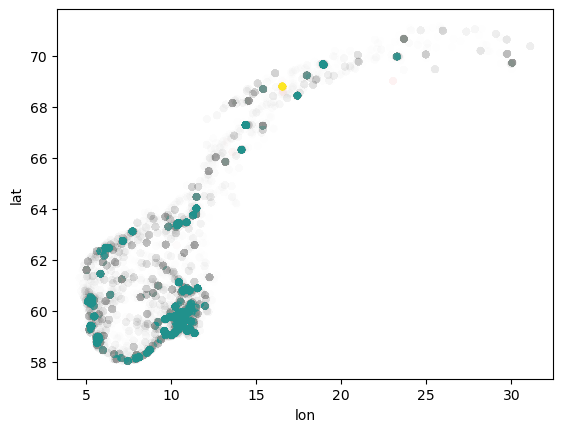

In [556]:
import seaborn as sns
import matplotlib as plt
sns.scatterplot(data=geo_df, x='lon', y="lat", c=clustering.labels_, alpha=0.005)

0.0001 100 10


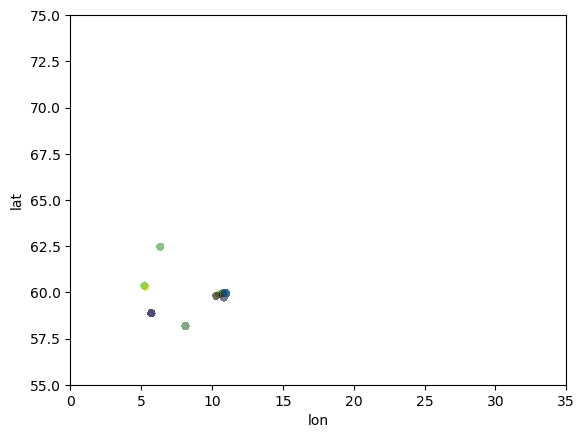

0.0001 125 6


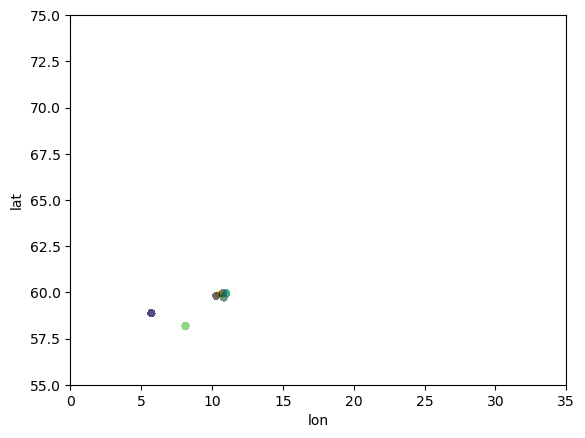

0.0002 100 10


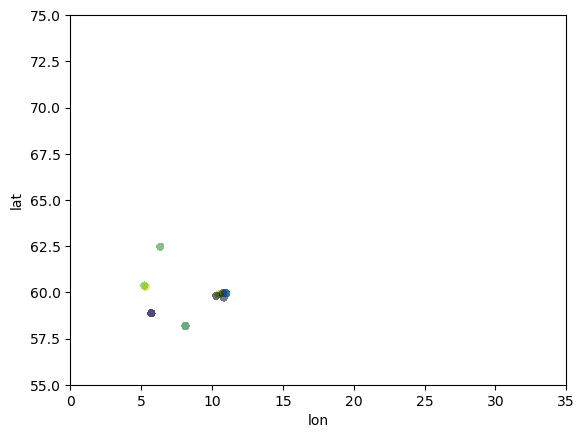

0.0002 125 6


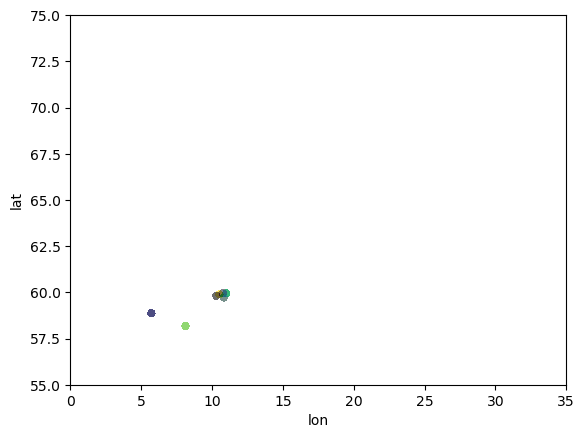

0.0005 100 12


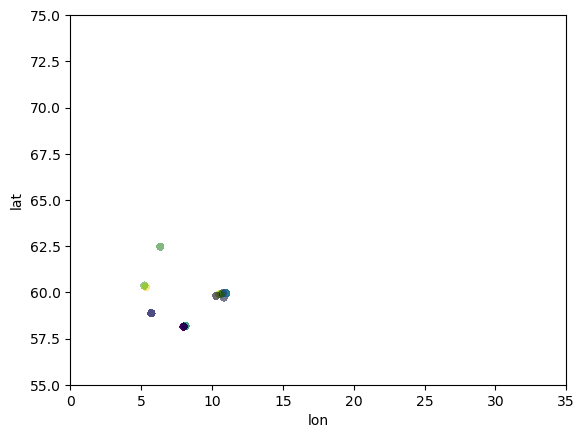

0.0005 125 8


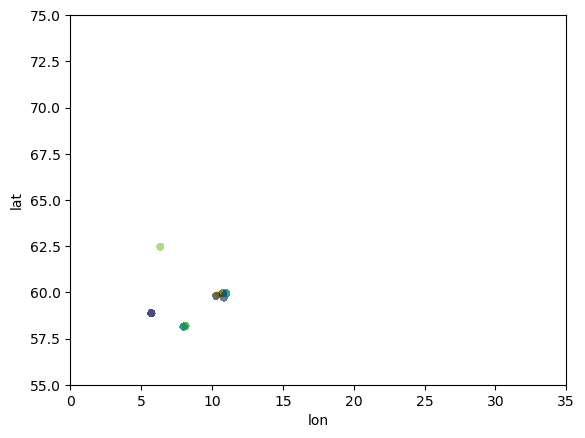

0.0007 100 13


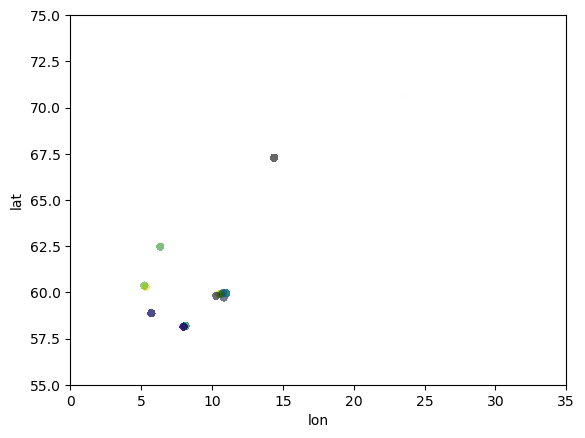

0.0007 125 8


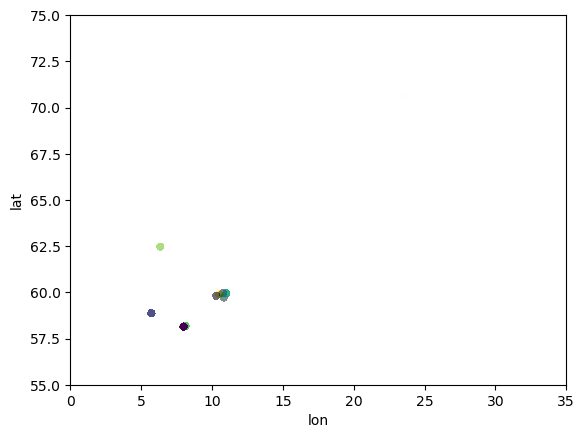

0.001 100 23


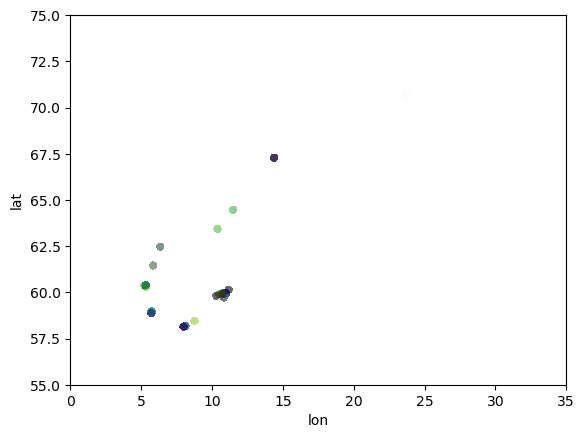

0.001 125 12


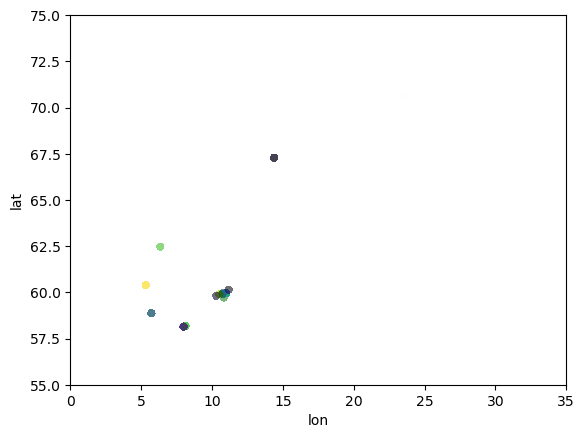

0.001 150 6


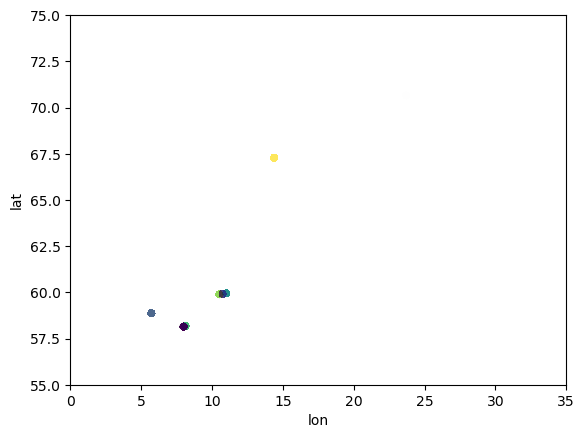

0.002 150 19


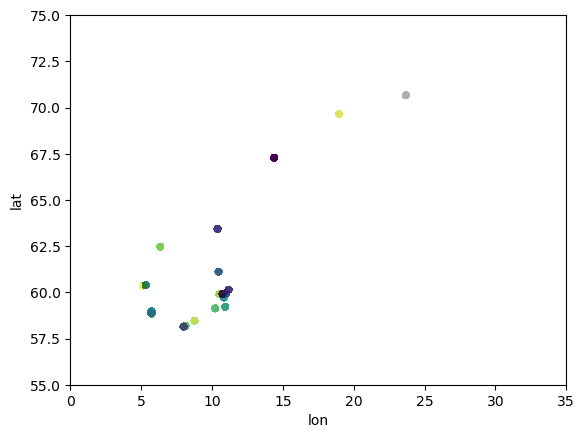

0.002 175 15


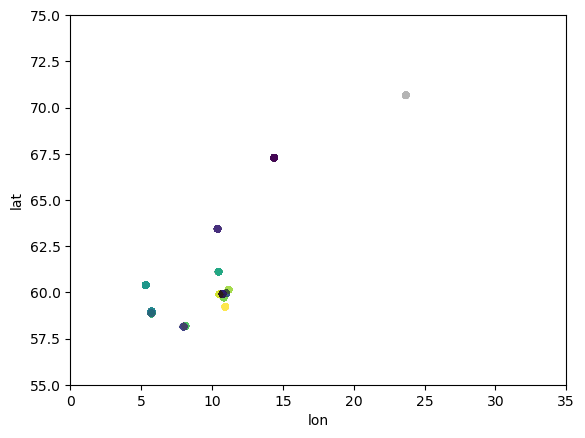

0.002 200 9


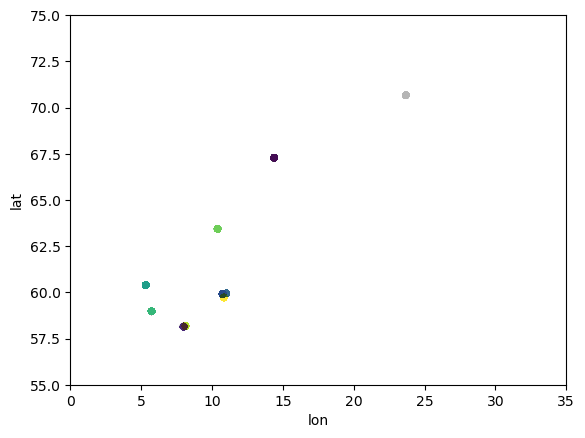

0.002 225 6


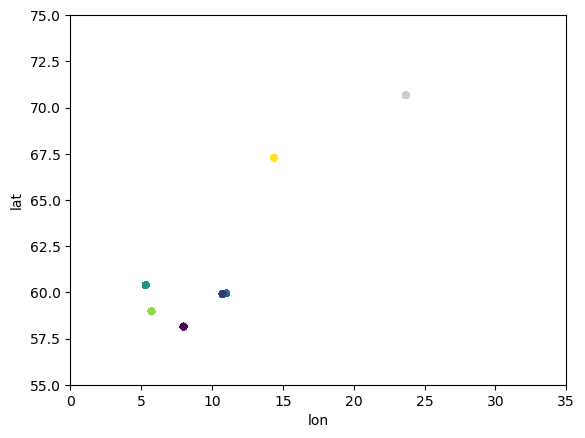

In [557]:
good = []
import matplotlib.pyplot as plt
for eps in [0.0001, 0.0002, 0.0005, 0.0007, 0.001, 0.002]:
    for min_samples in [10, 50, 100, 125, 150, 175, 200, 225, 250, 325, 450]:
        clustering = DBSCAN(eps = eps, min_samples=min_samples, metric='haversine').fit(geo_df[['lat', 'lon']])
        if clustering.labels_.max() > 5 and clustering.labels_.max() < 30:
            good.append((clustering.labels_, eps, min_samples))
            print(eps, min_samples, clustering.labels_.max())
            geo_df['cluster'] = clustering.labels_
            # sns.scatterplot(data=geo_df, x='lon', y="lat", c=clustering.labels_, size='cluster', sizes=(10,500), alpha=0.3)
            sns.scatterplot(data=geo_df[geo_df['cluster']!=-1], x='lon', y="lat", c=geo_df[geo_df['cluster']!=-1]['cluster'], alpha=0.005)
            plt.xlim(0,35)
            plt.ylim(55,75)
            plt.show()


0.0001 100 10


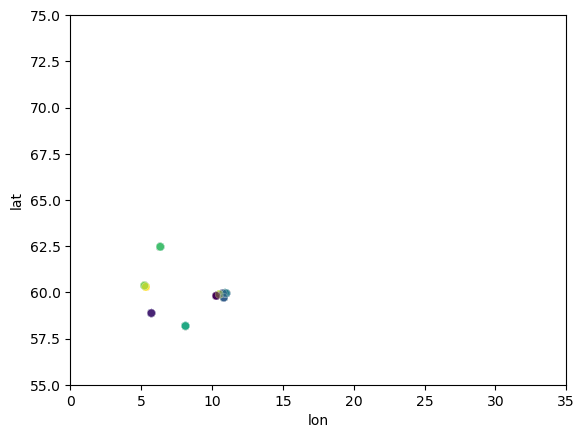

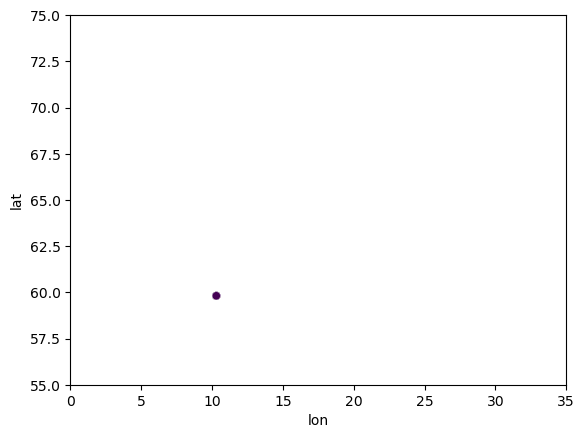

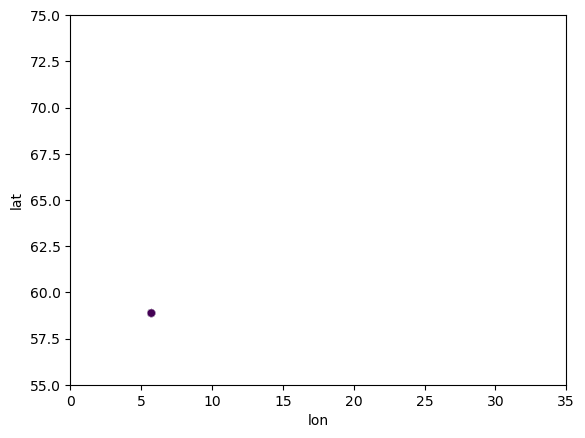

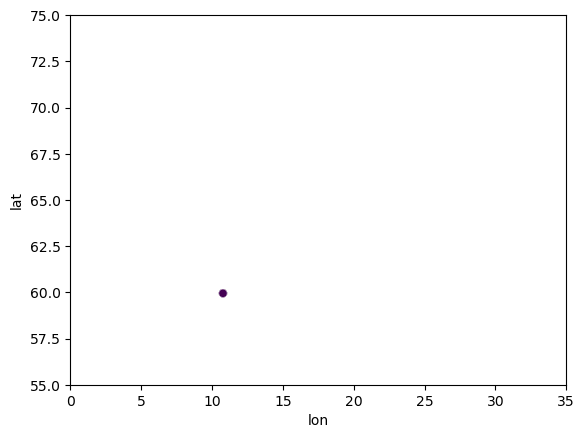

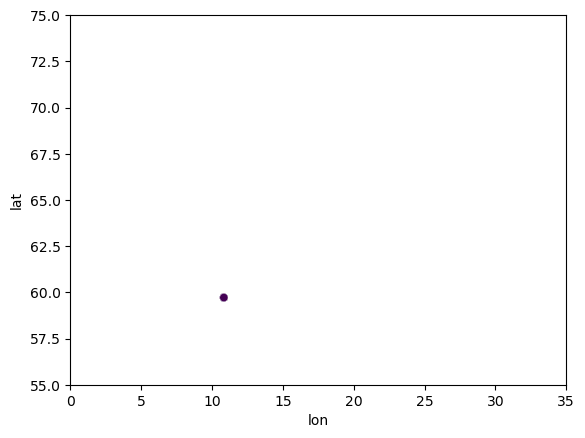

...

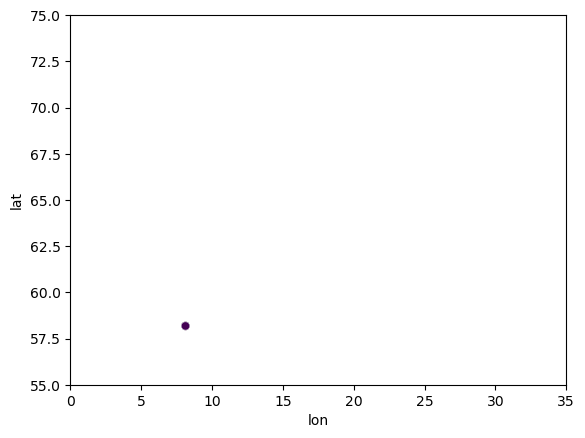

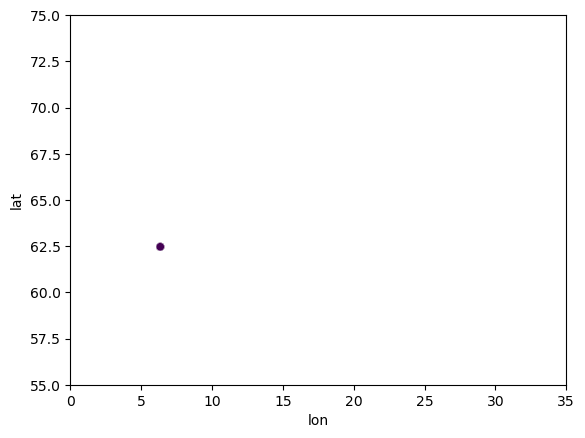

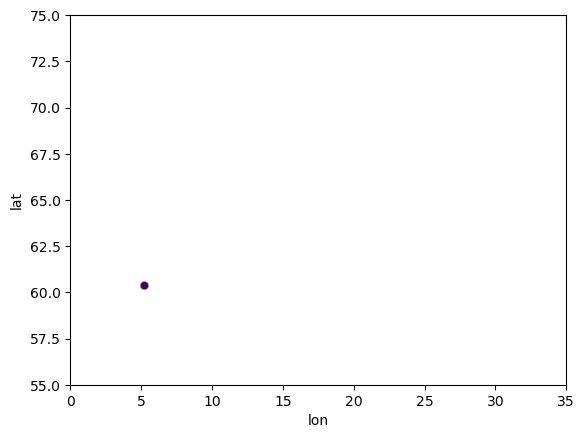

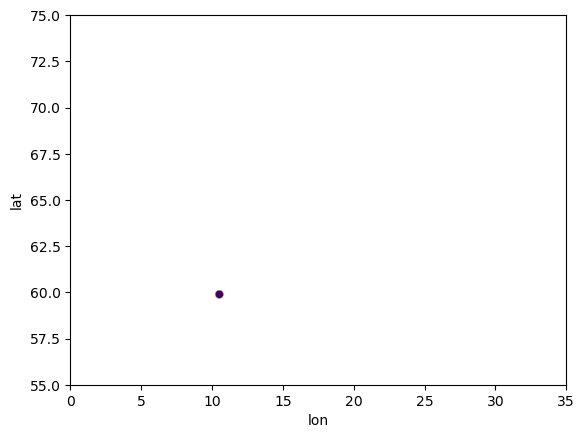

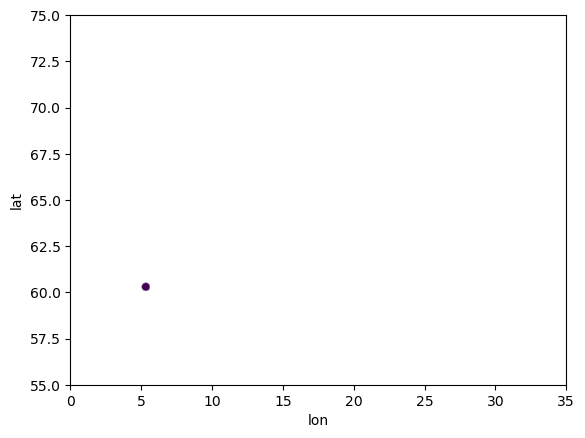

0.0001 125 6


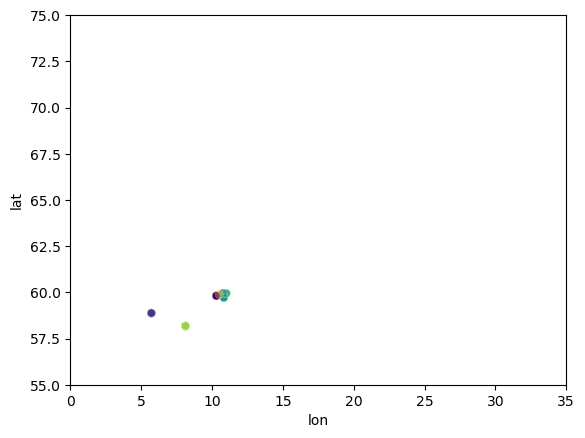

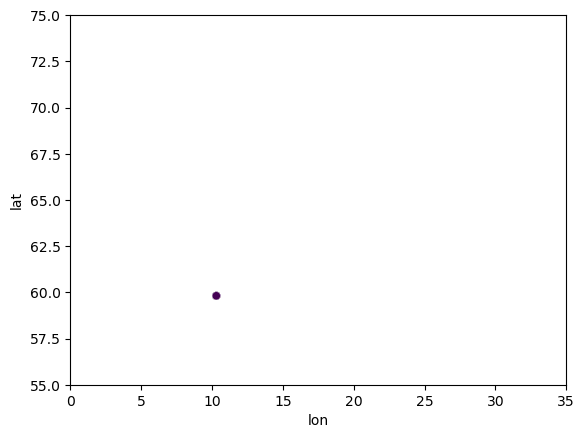

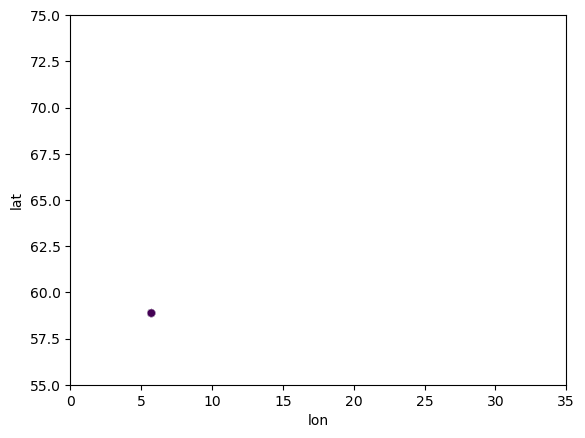

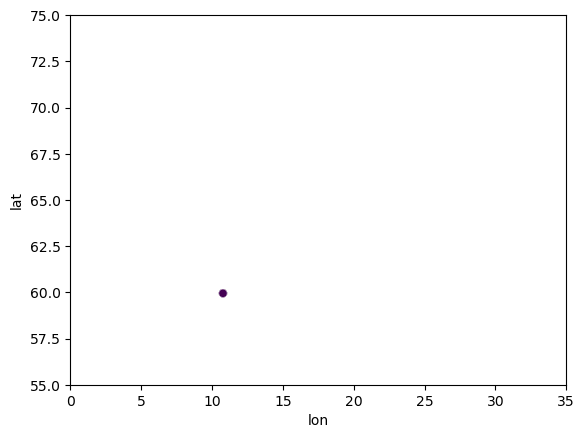

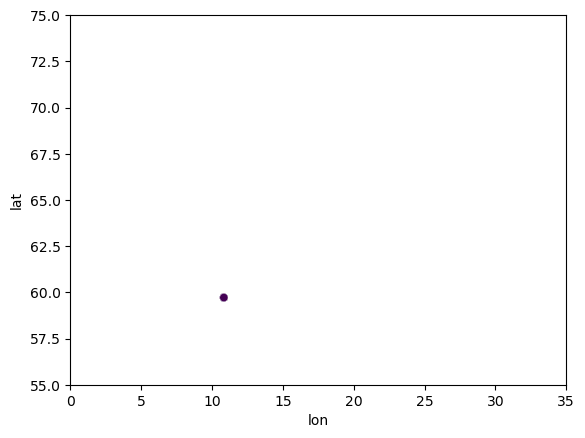

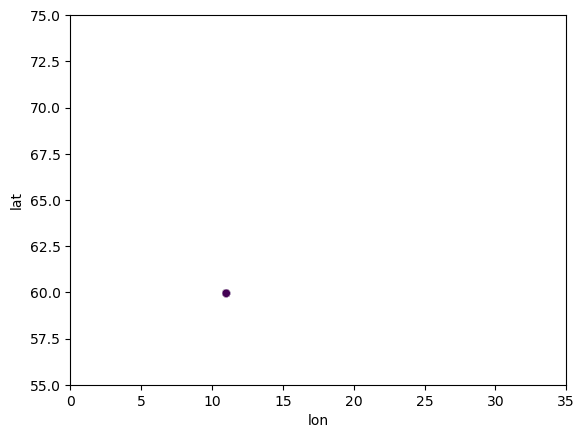

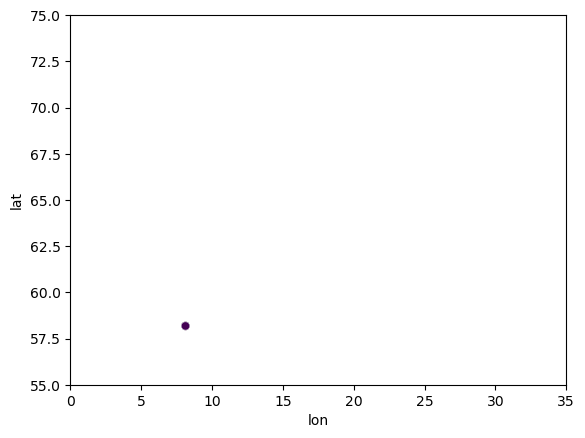

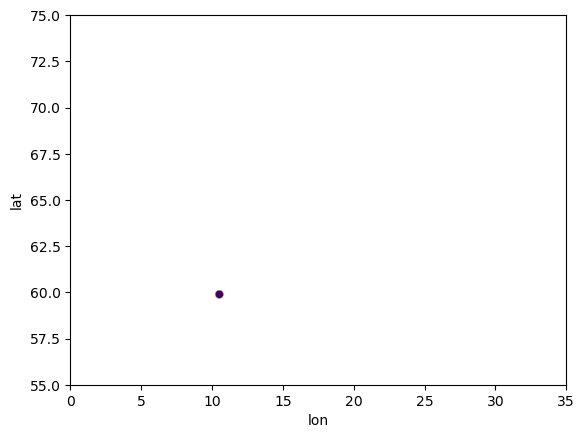

0.0002 100 10


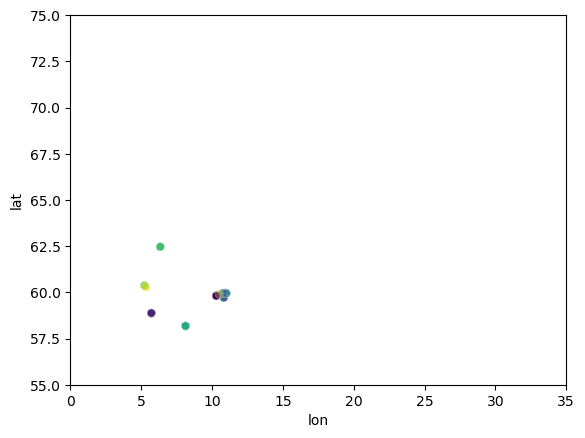

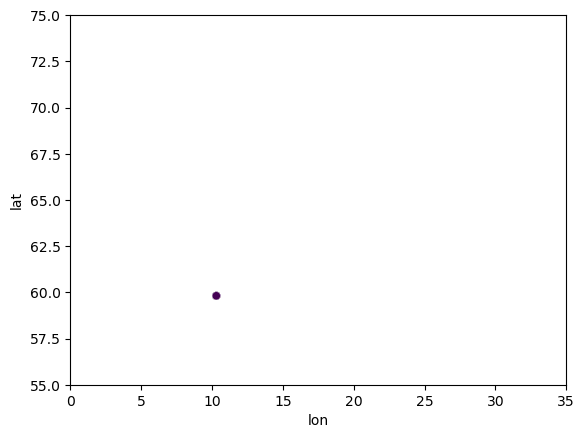

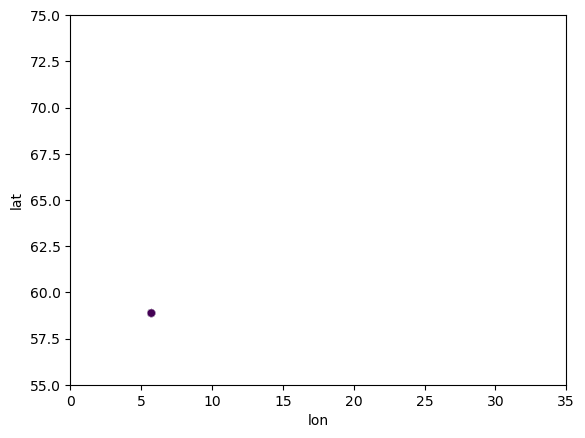

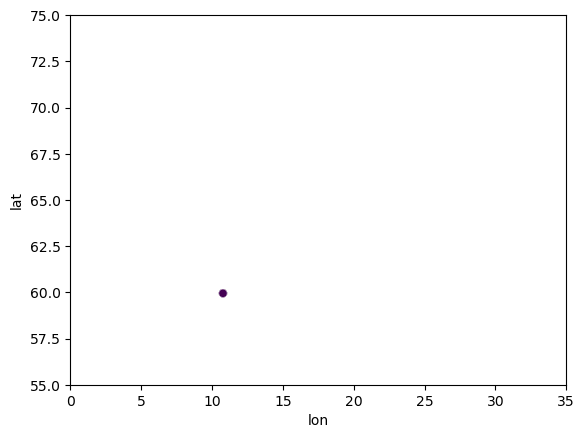

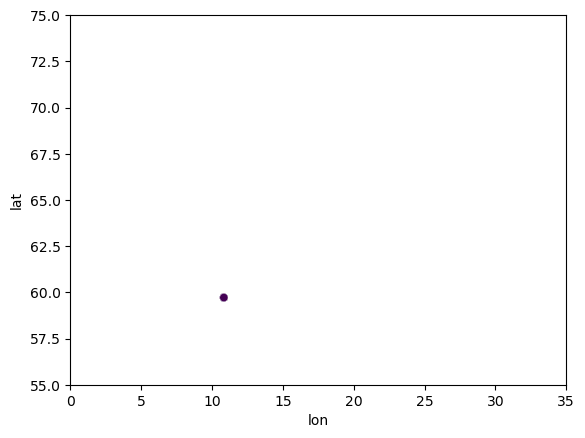

...

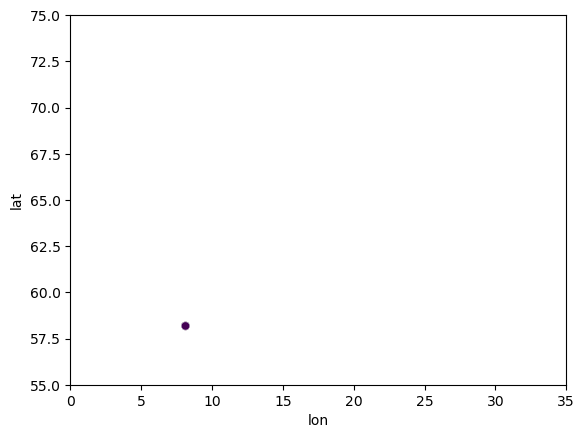

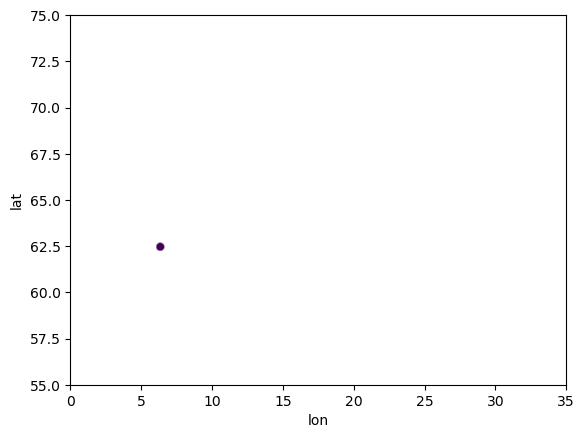

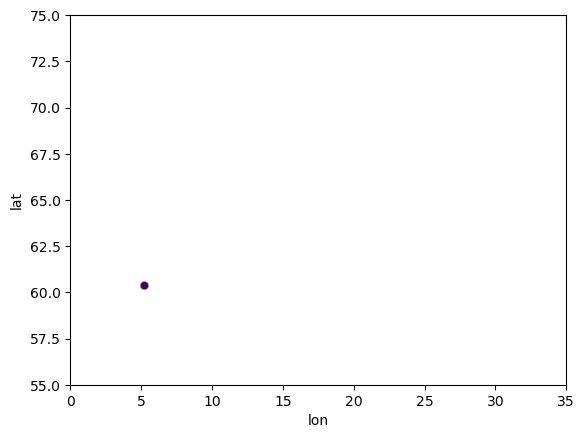

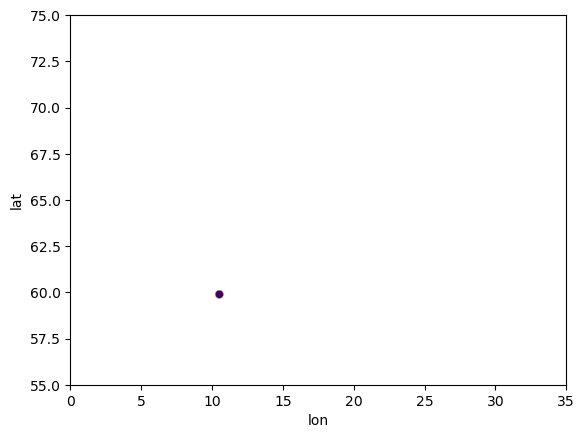

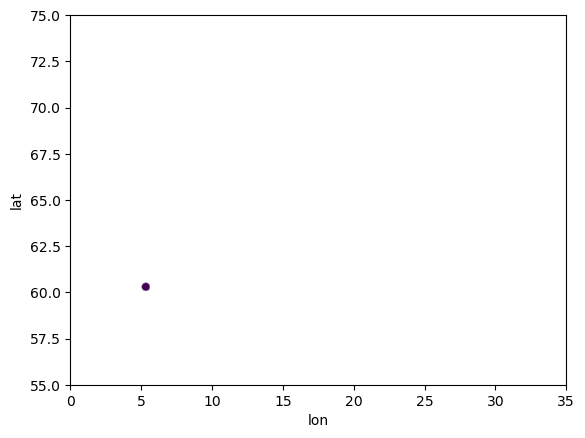

0.0002 125 6


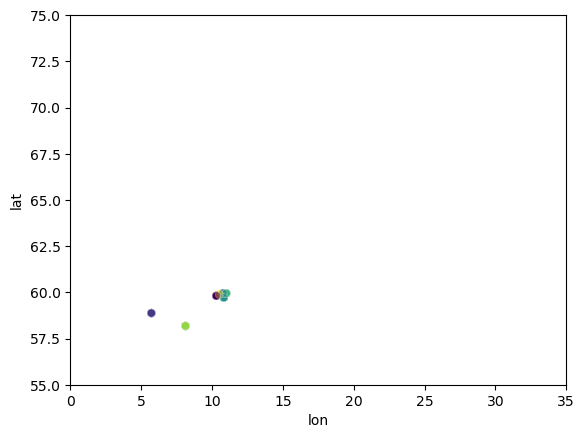

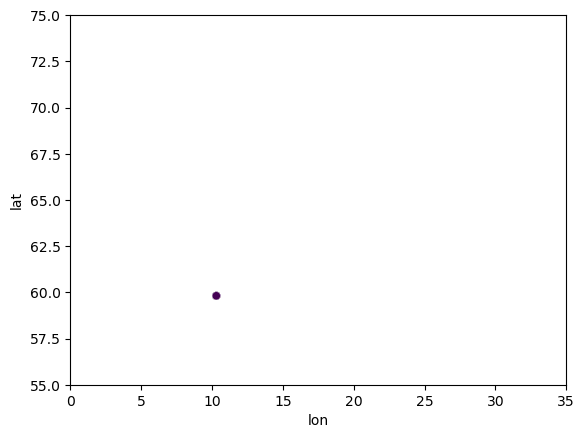

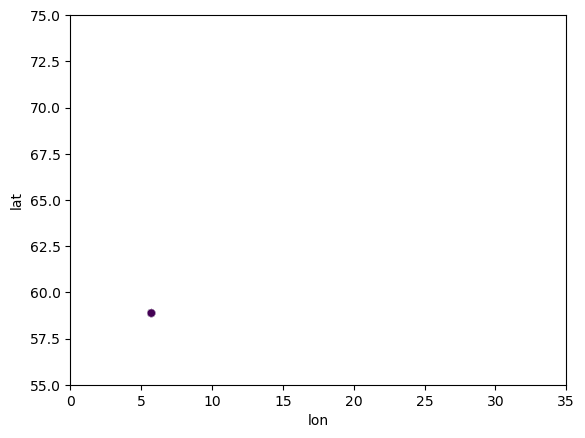

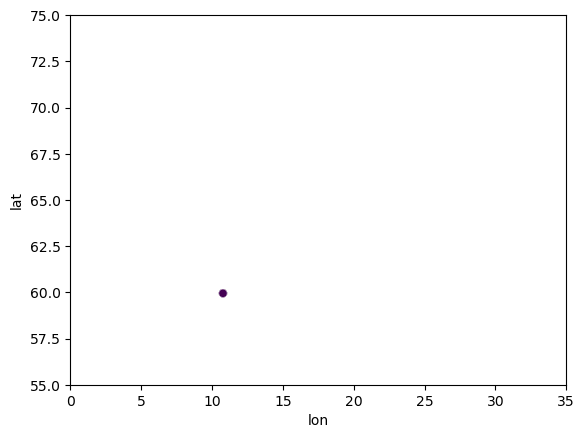

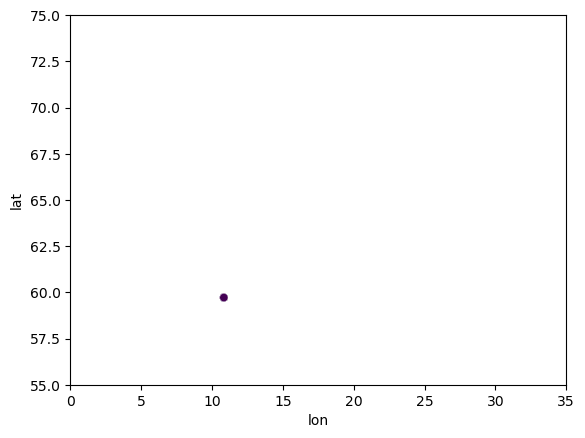

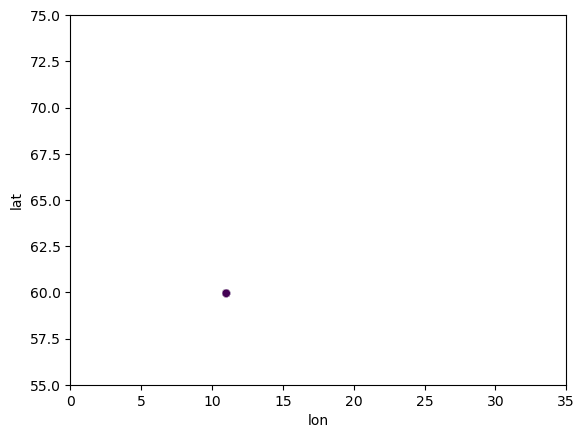

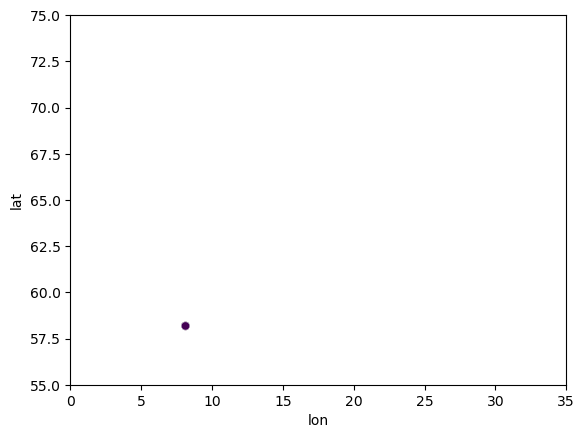

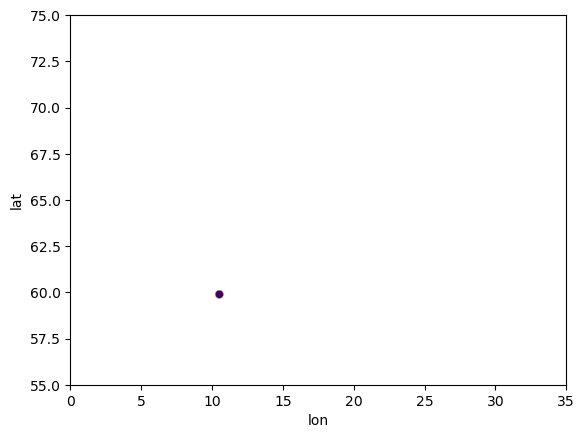

0.0005 100 12


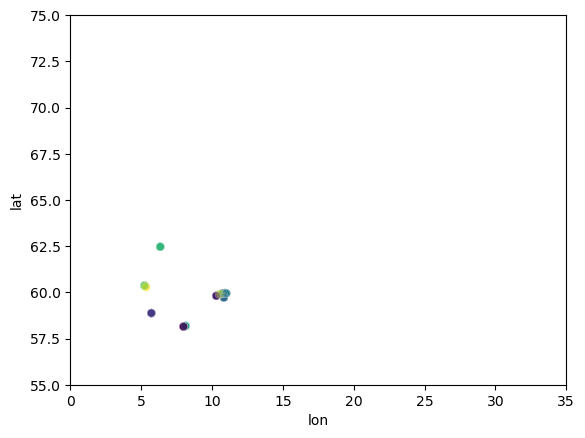

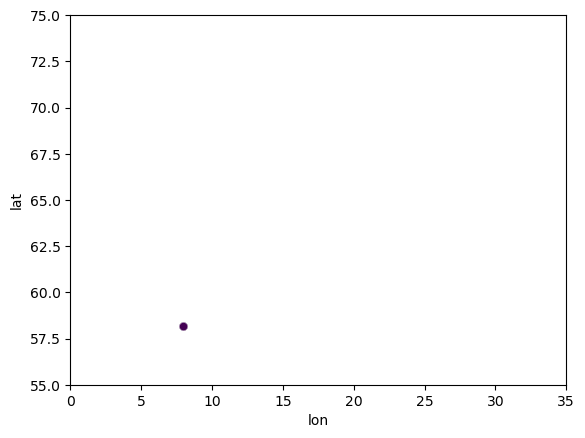

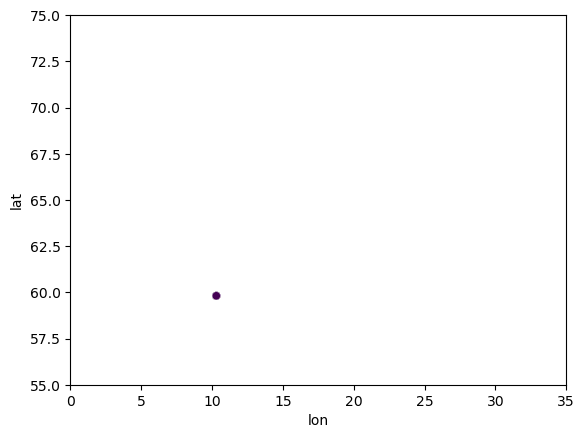

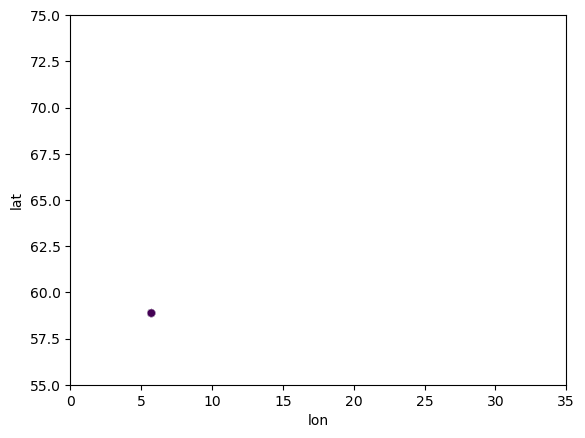

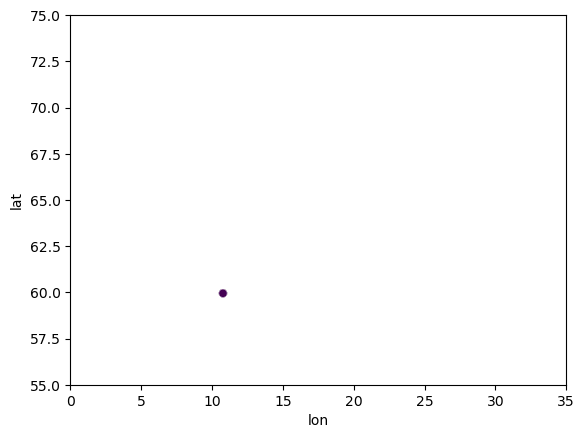

...

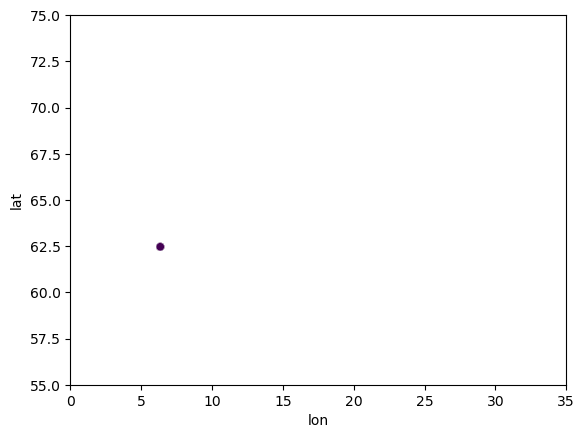

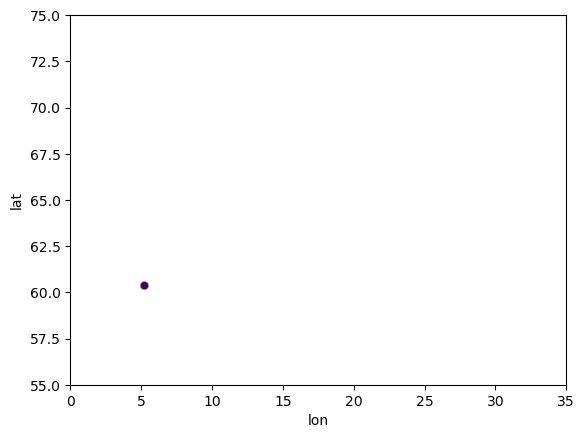

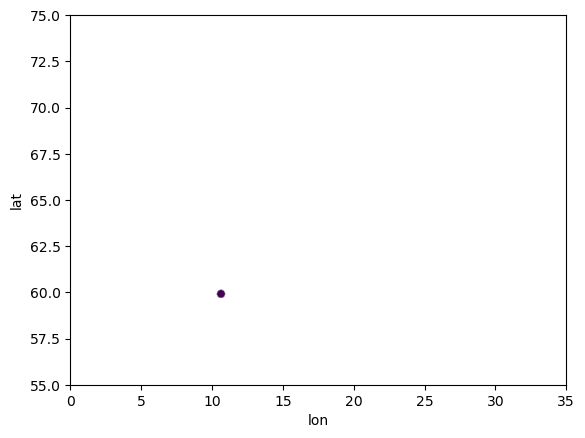

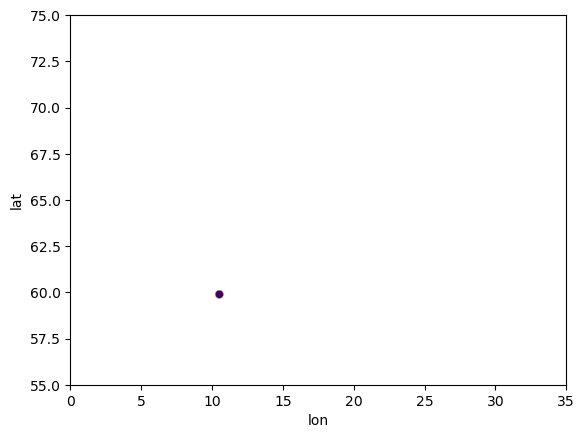

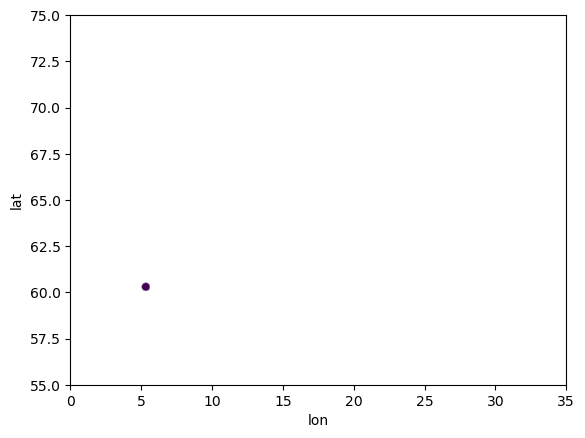

0.0005 125 8


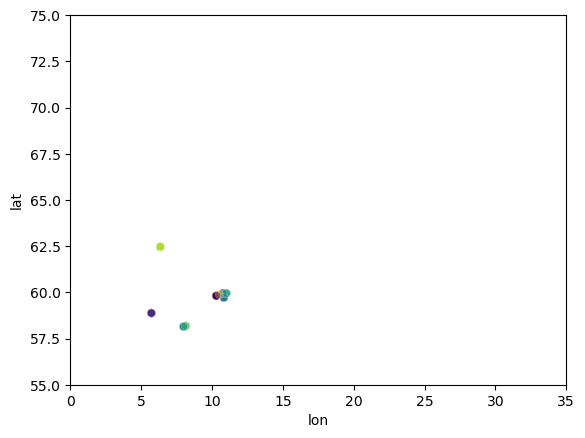

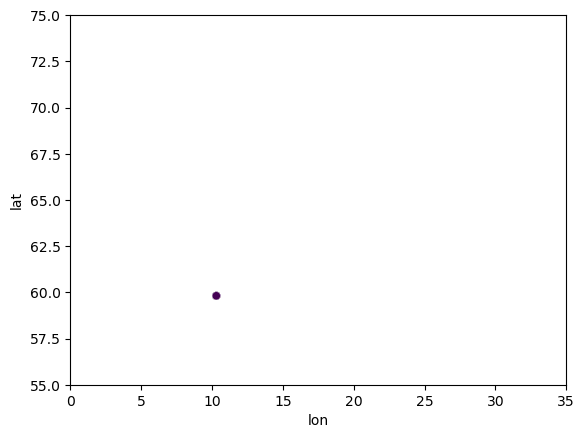

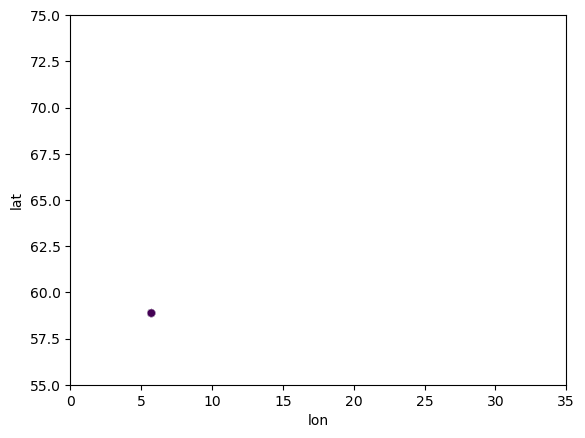

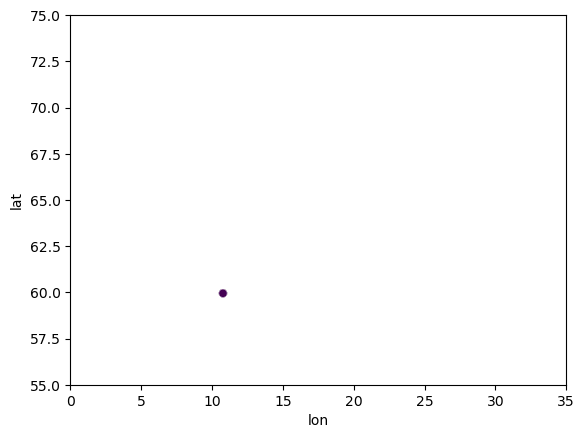

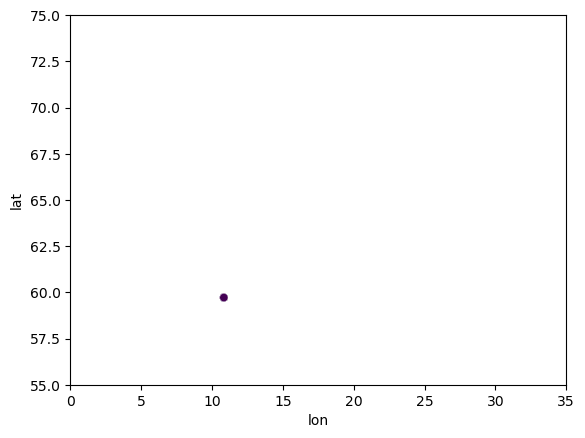

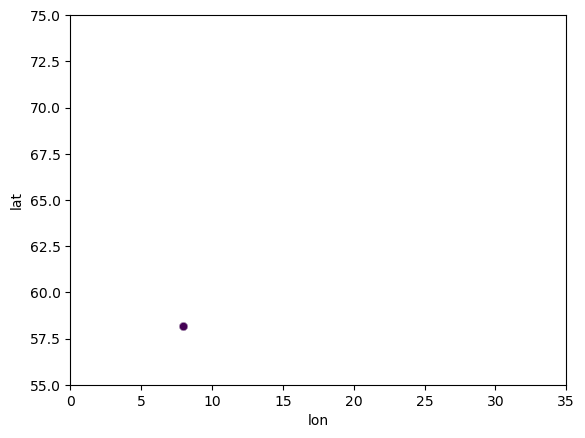

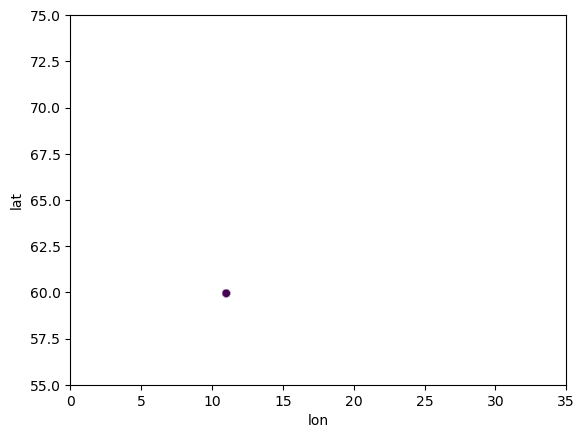

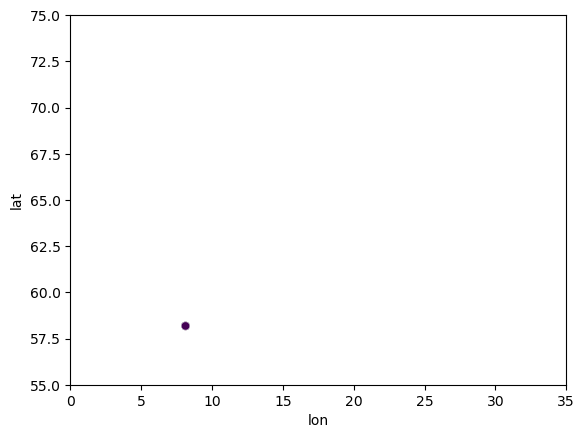

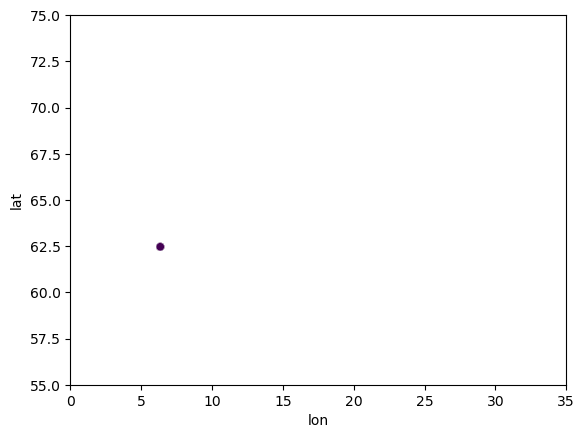

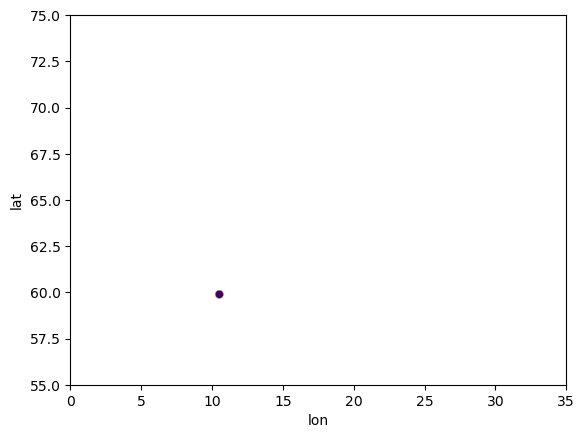

0.0007 100 13


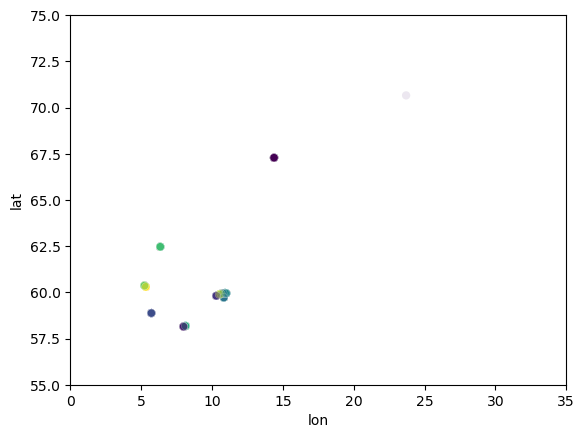

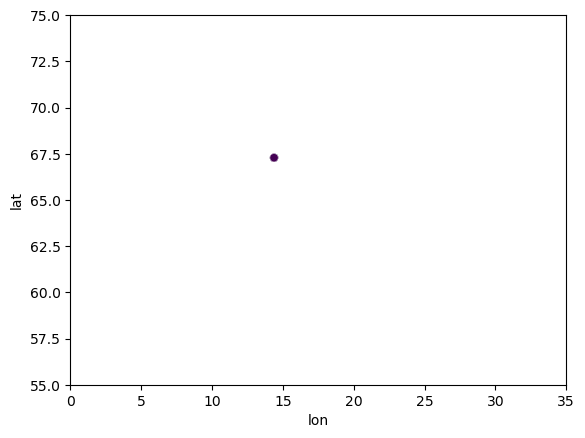

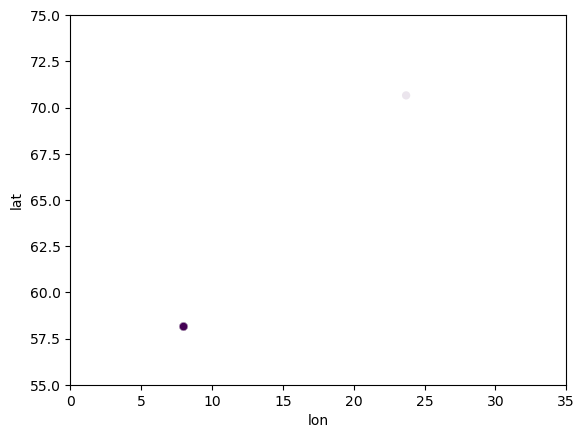

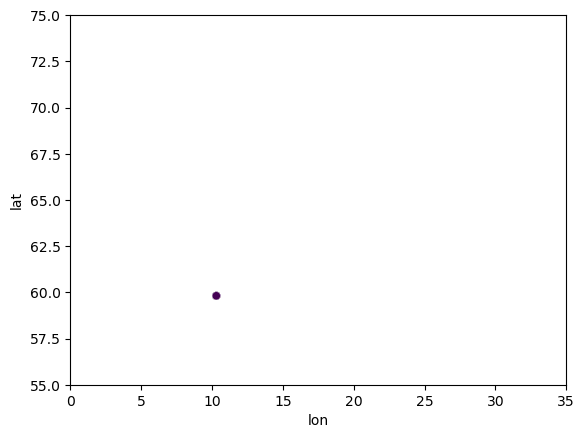

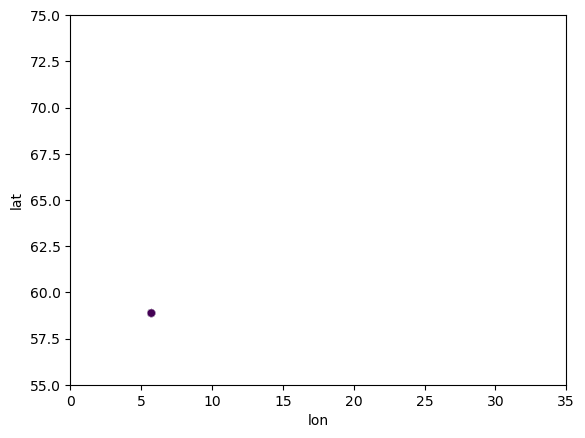

...

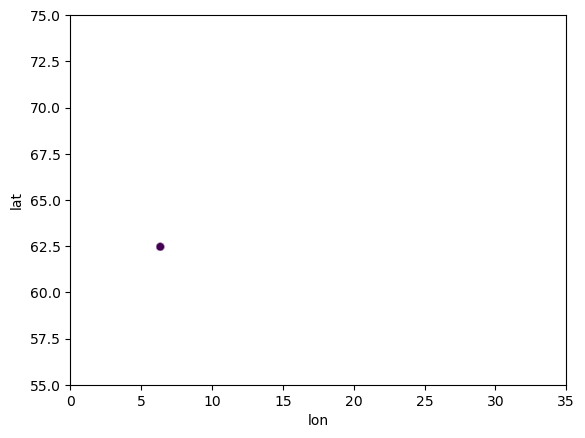

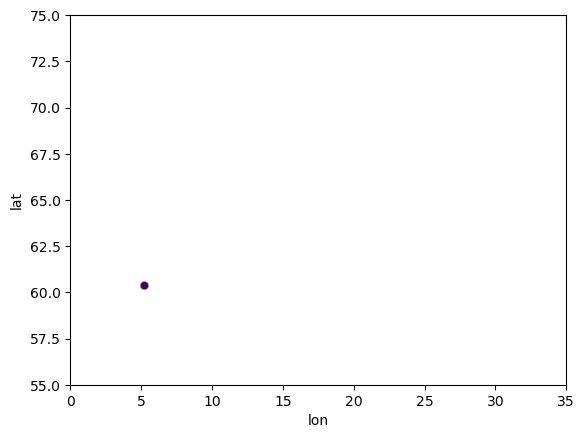

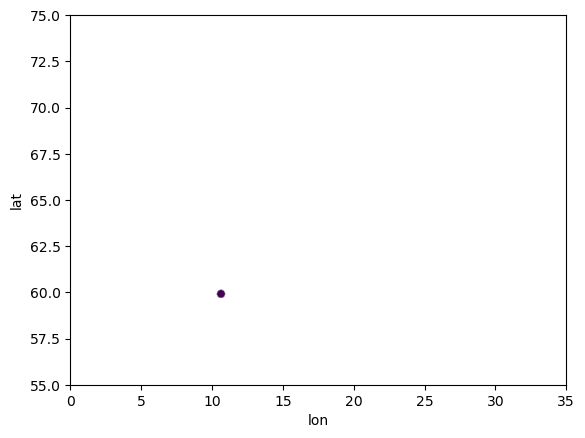

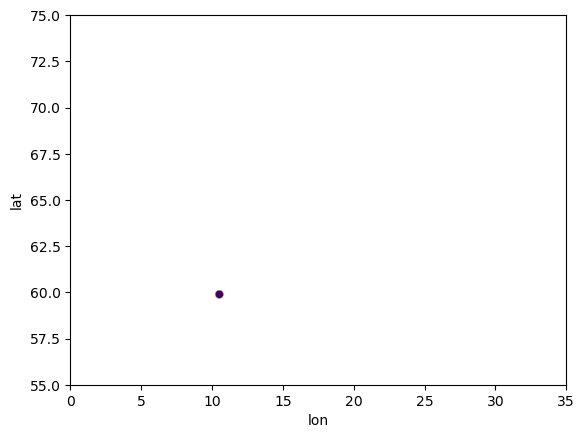

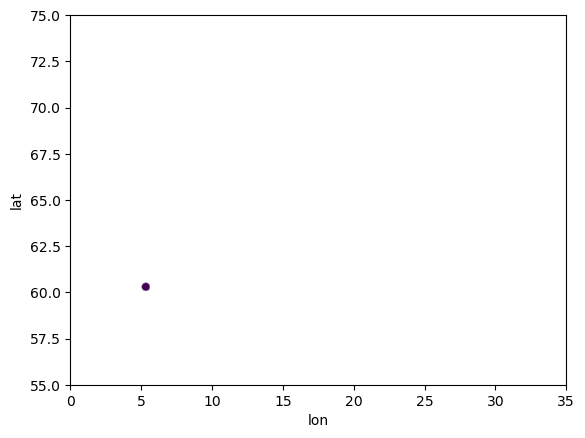

0.0007 125 8


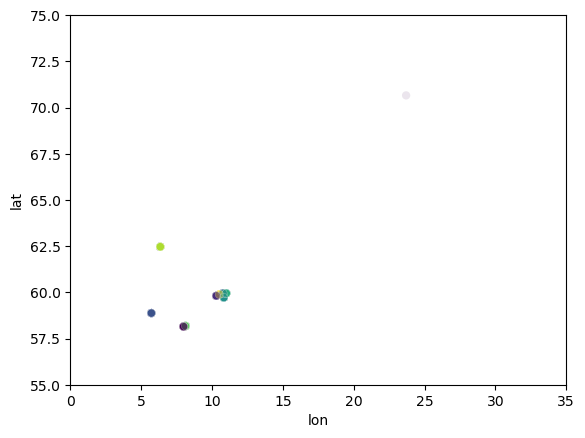

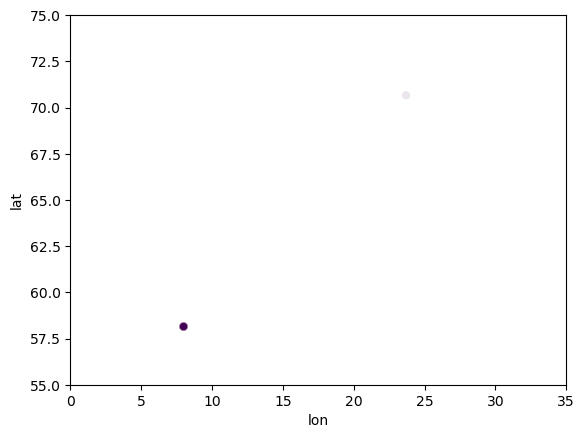

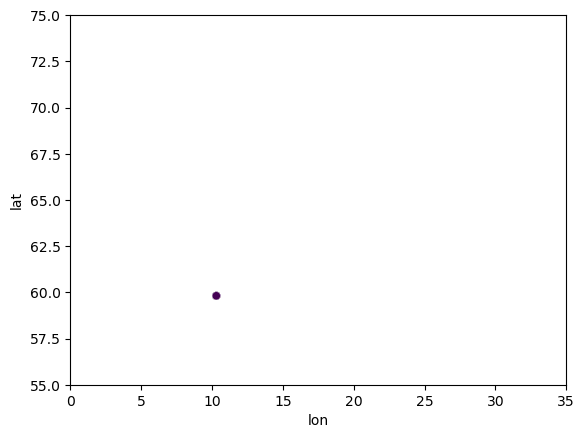

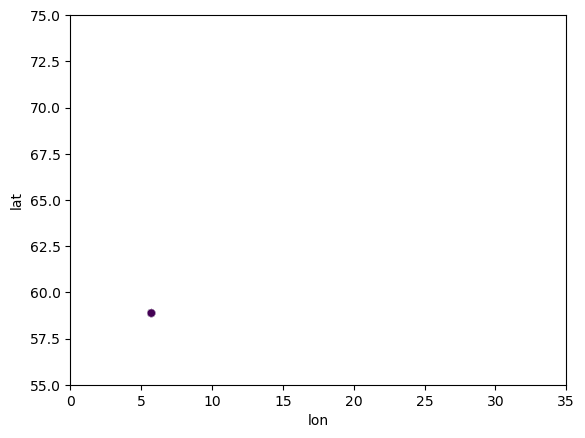

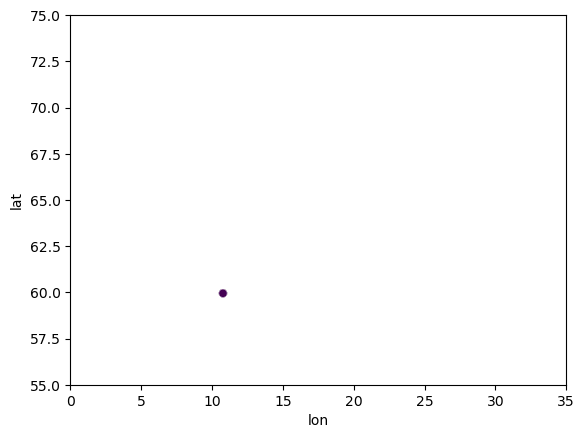

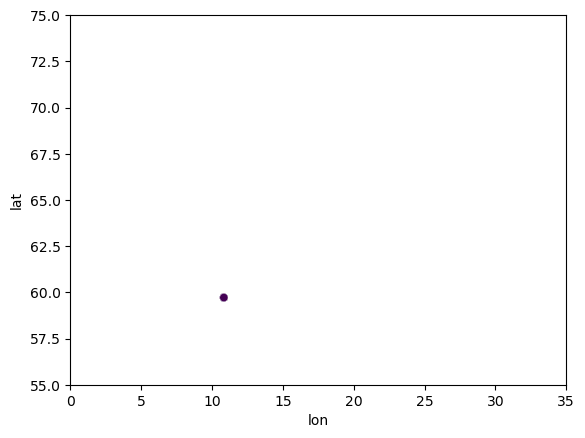

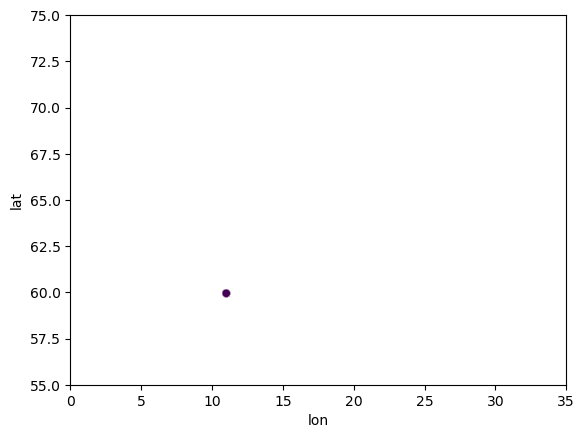

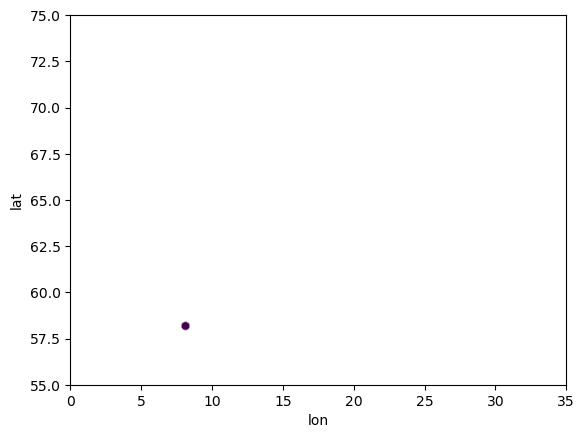

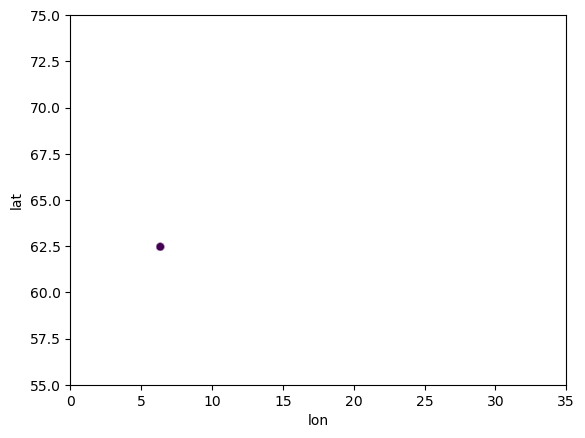

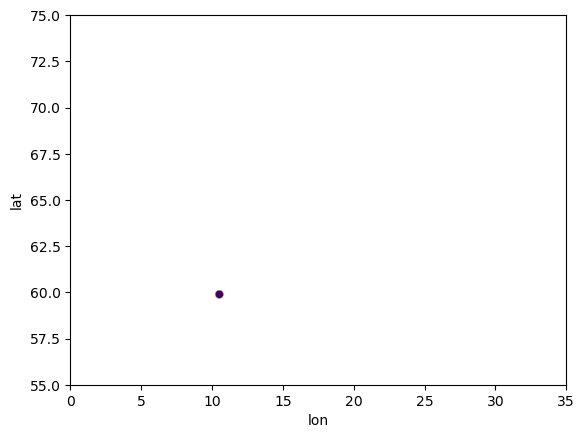

0.001 100 23


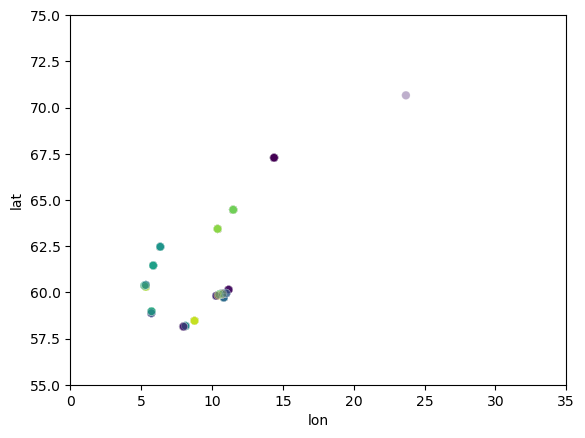

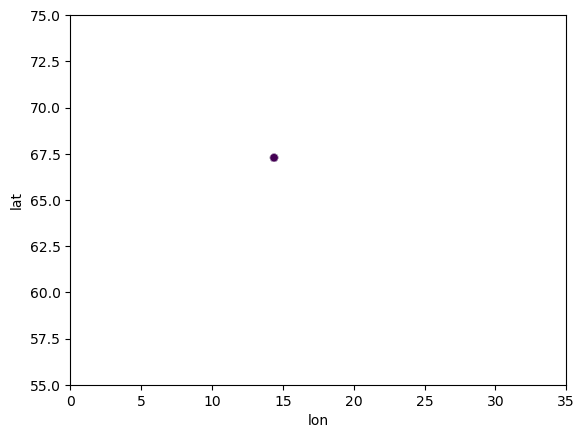

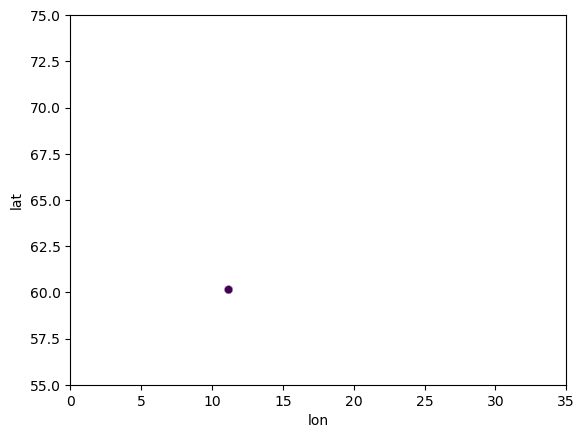

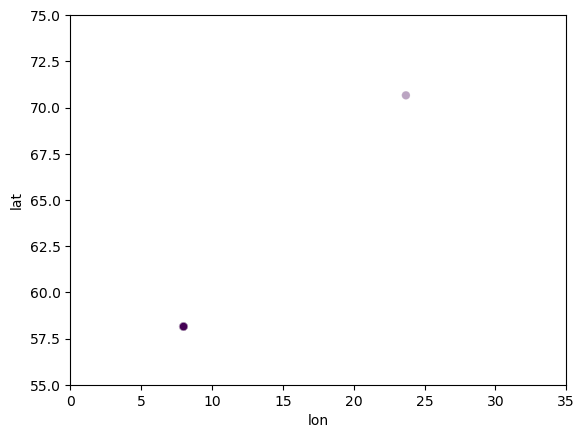

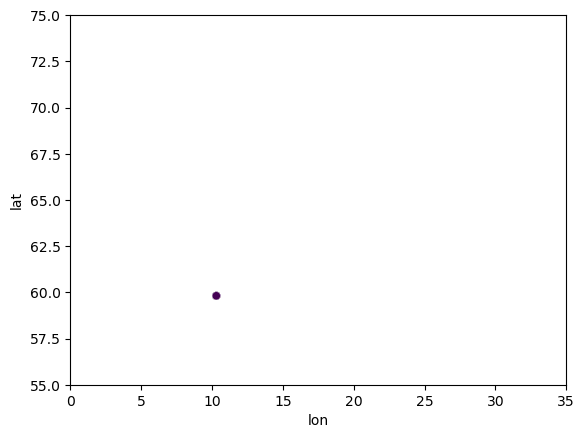

...

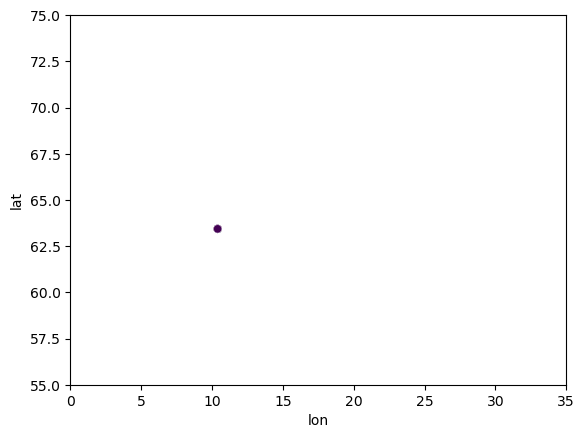

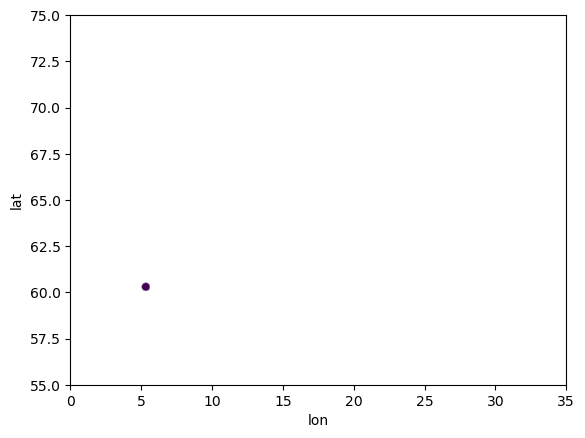

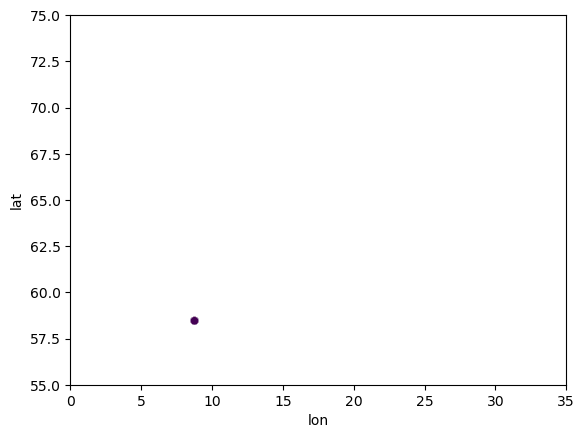

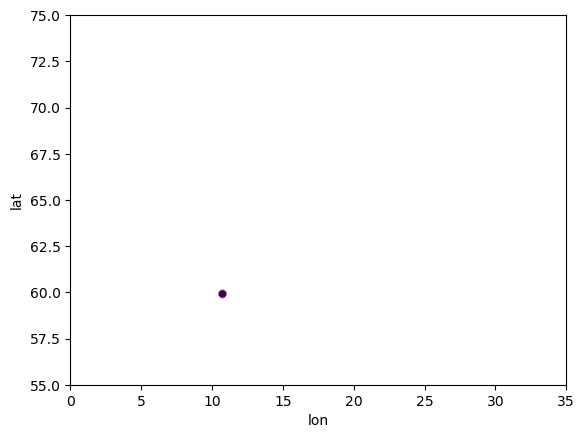

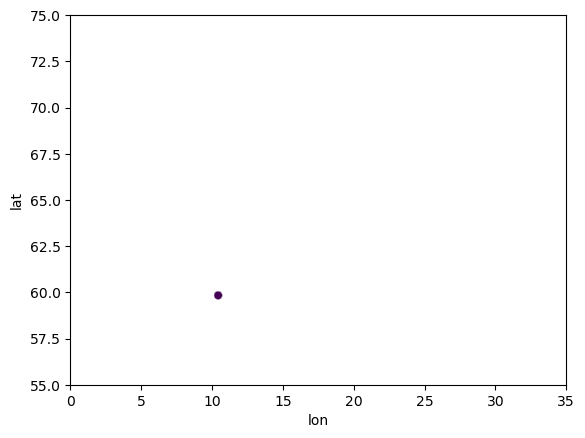

0.001 125 12


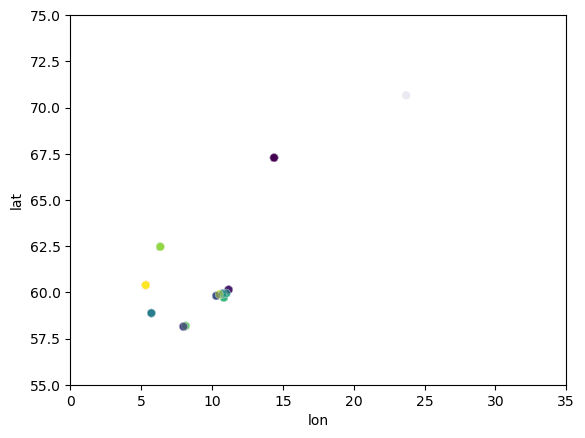

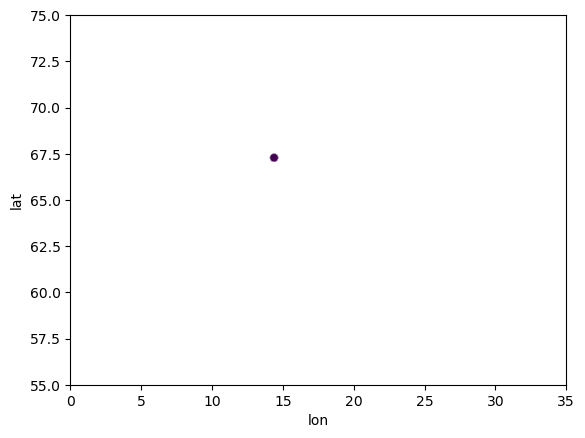

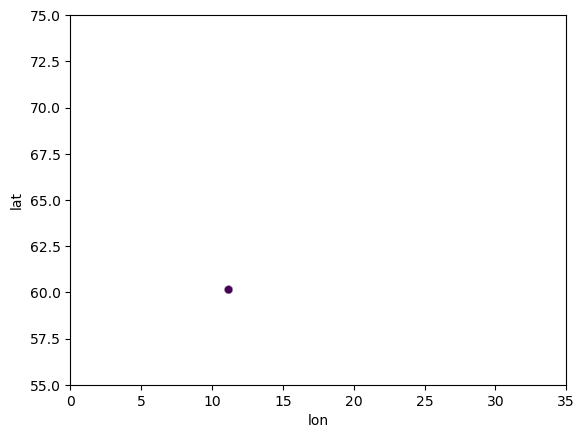

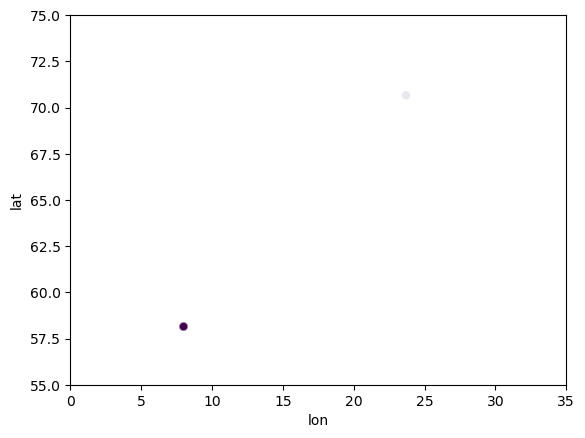

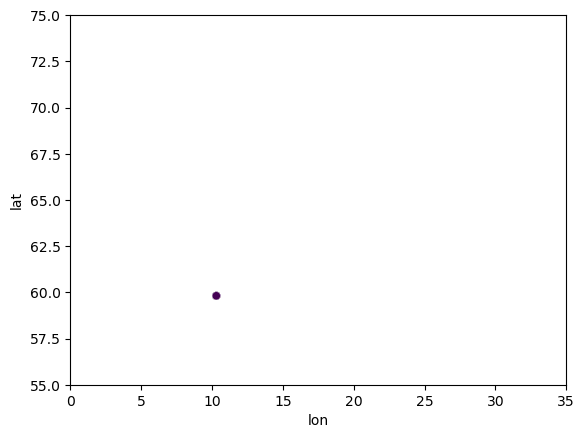

...

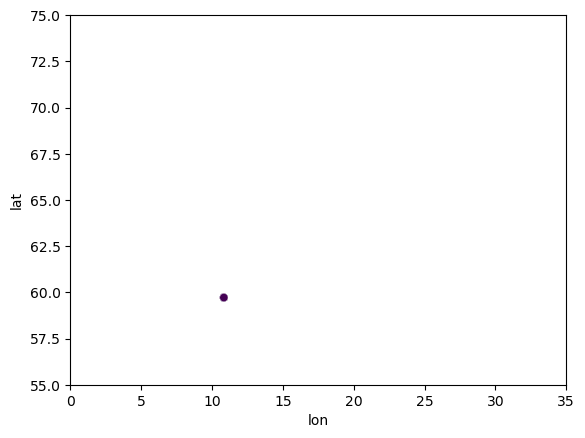

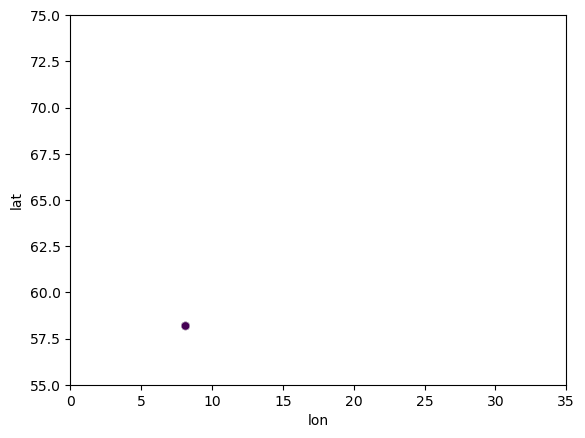

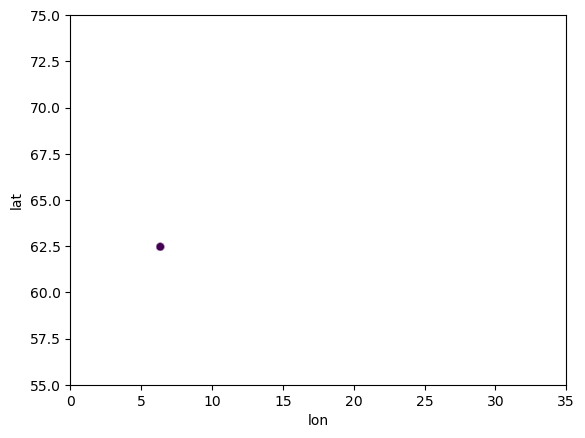

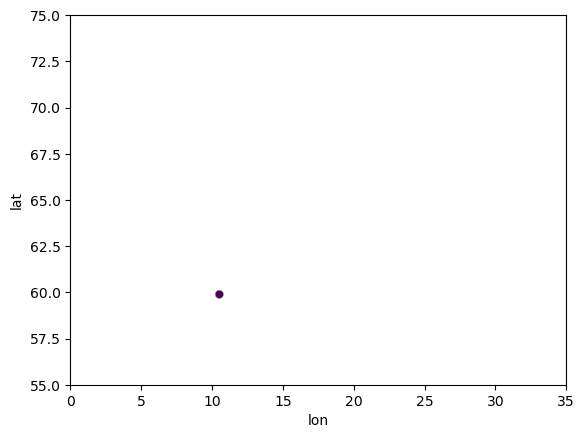

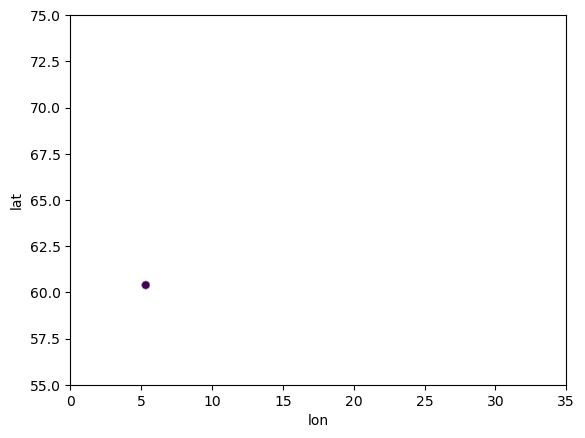

0.001 150 6


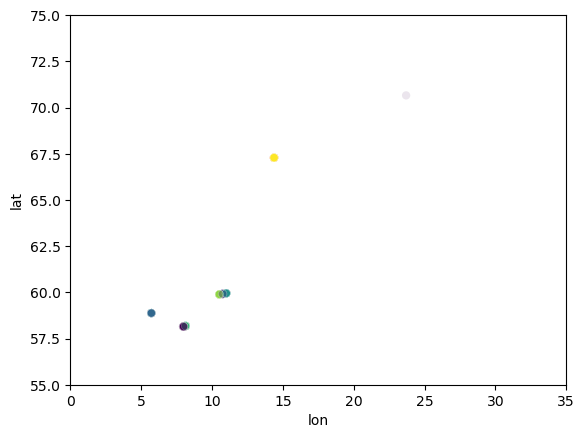

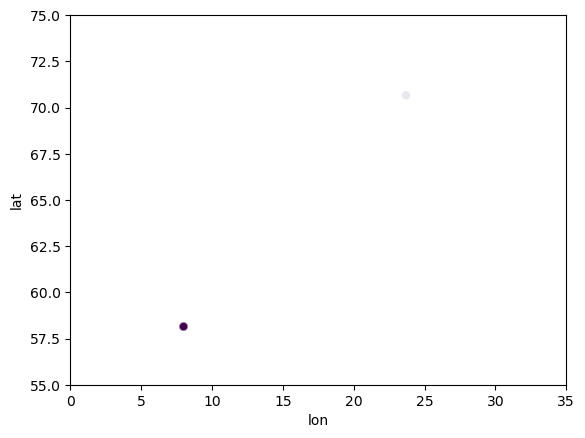

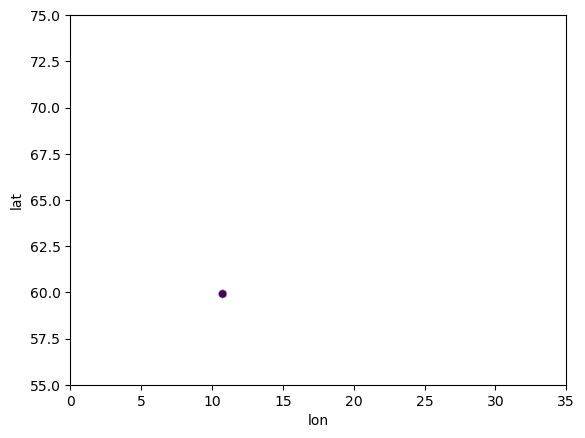

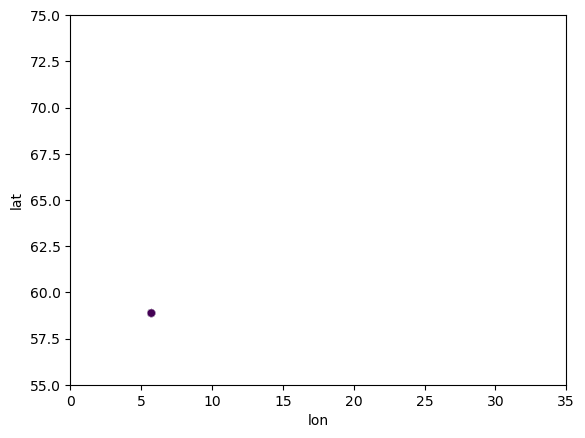

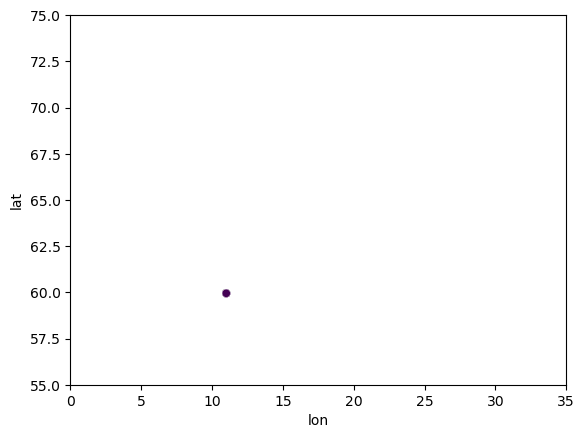

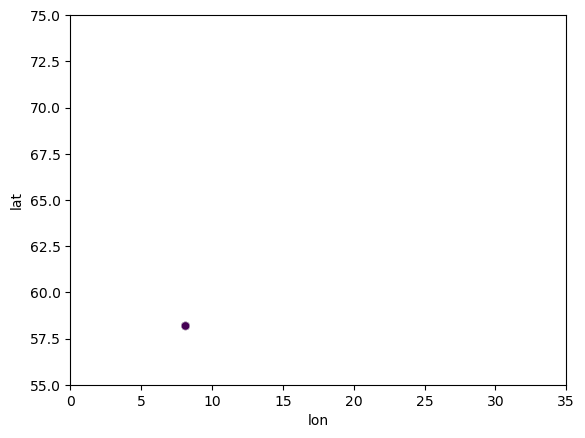

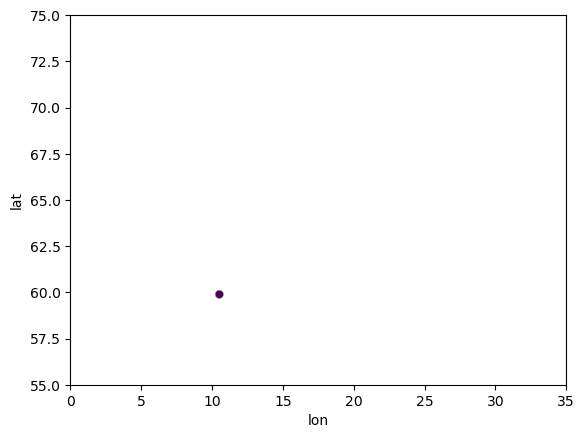

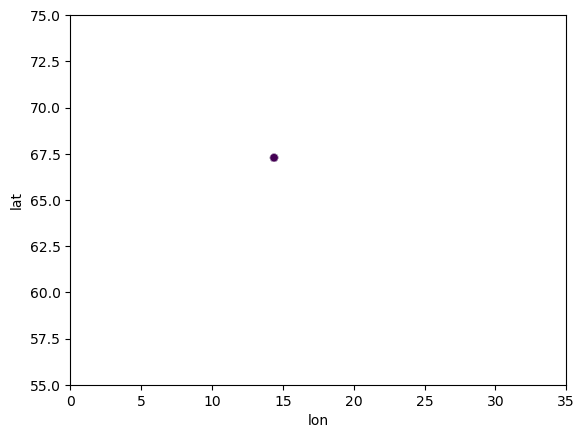

0.002 150 19
0.002 175 15
0.002 200 9
0.002 225 6


In [558]:
for g in good:
    geo_df['cluster'] = g[0]

    print(g[1], g[2], g[0].max())
    if g[1] > 0.001:
        continue

    df = geo_df[geo_df['cluster'] != -1]
    sns.scatterplot(data=df, x='lon', y="lat", c=df['cluster'], alpha=0.1)
    plt.xlim(0,35)
    plt.ylim(55,75)
    plt.show()

    for c in range(g[0].max()+1):
        df = geo_df[geo_df['cluster'] == c]
        # sns.scatterplot(data=df, x='lon', y="lat",  palette='red', alpha=0.1)
        sns.scatterplot(data=df, x='lon', y="lat", c=df['cluster'], alpha=0.1)
        plt.xlim(0,35)
        plt.ylim(55,75)
        plt.show()

In [559]:
labels = good[8][0]
good[8][1:3]

(0.001, 100)

In [560]:
geo_df['cluster'] = labels
geo_df['cluster'].value_counts()

-1     46203
 2       442
 7       245
 10      244
 14      233
 4       214
 0       200
 11      183
 5       178
 16      168
 1       151
 3       147
 6       139
 8       138
 21      127
 12      126
 20      124
 9       119
 22      110
 13      109
 18      108
 15      104
 19      104
 17      103
 23      101
Name: cluster, dtype: int64

In [561]:
geo_df

,lat,lon,store_id,cluster
0,59.743104,10.204928,983540538-974187930-44774,-1
1,59.913759,10.734031,987074191-973117734-44755,-1
2,60.164751,10.254656,984890265-981157303-64491,-1
3,67.283669,14.379796,914057442-992924179-126912,0
4,63.358068,10.374832,913018583-913063538-668469,-1
...,...,...,...,...
8572,59.259575,5.325813,917323003-917383529-844309,-1
8573,58.976219,5.721546,917353379-917411824-845904,-1
8574,59.928330,11.163202,917072302-917089248-833647,-1
8575,60.445790,5.161587,916960557-916993161-829908,-1


In [562]:
import numpy as np

full_df_train = pd.merge(stores_train, geo_df[['store_id', 'cluster']], on='store_id', how='left')
full_df_val = pd.merge(stores_val, geo_df[['store_id', 'cluster']], on='store_id', how='left')
full_df_train['count'] = 1
mapping_df = full_df_train.groupby('cluster').agg({'lat':'mean', 'lon':'mean', 'count':'sum', 'revenue':'mean', }).sort_values('revenue').reset_index()
mapping_df['new_cluster'] = mapping_df.index
# pd.merge(full_df, mapping_df, on='cluster')
full_new_df = pd.merge(full_df_val, mapping_df[['cluster', 'new_cluster']], on='cluster')
full_new_df.groupby('new_cluster').mean()

,year,grunnkrets_id,lat,lon,revenue,cluster
new_cluster,,,,,,
0,2016.0,3.013917e+06,59.962146,10.924524,4.195000,9.0
1,2016.0,9.065102e+06,58.460302,8.765509,5.680750,21.0
2,2016.0,6.260802e+06,59.811292,10.305843,4.409400,3.0
3,2016.0,1.001079e+07,58.146464,7.991759,10.081133,2.0
4,2016.0,2.350205e+06,60.142547,11.171911,6.106000,1.0
5,2016.0,1.804010e+07,67.283866,14.379629,3.475500,0.0
6,2016.0,1.201192e+07,60.363221,5.233627,6.268000,15.0
7,2016.0,1.102020e+07,58.876265,5.721772,7.376000,5.0
8,2016.0,1.601120e+07,63.432887,10.397168,7.325500,19.0


### Corresponding cities
0 Oslo 
1 Arendal
2 Lier
3 Kristiansand
4 Jessheim
5 Bodø
6 Bergen
7 Sandnes
8 Trondheim
9 Bærum
10 Ski
11 Bergen 
12 Asker 
13 Namsos
14 Hele landet
15 Bergen
16 Oslo 
17 Oslo
18 Stavanger
19 Sandvika
20 Førde
21 Strømmen
22 Ålesund
23 Kristiansand
24 Oslo



In [563]:
full_new_df['log_revenue'] = np.log1p(full_new_df['revenue'])
full_new_df[['revenue', 'log_revenue', 'new_cluster']].corr()

,revenue,log_revenue,new_cluster
revenue,1.000000,0.788272,0.007396
log_revenue,0.788272,1.000000,-0.018658
new_cluster,0.007396,-0.018658,1.000000


In [564]:
from clustering import create_cluster_csv, add_clusters
create_cluster_csv()
add_clusters(stores_test)

/home/halvorlinder/NTNU/Machine_Learning/TDT4173/clustering.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  geo_df = stores_total_train.append(stores_extra).append(stores_test)[['lat', 'lon', 'store_id']]


,store_id,year,store_name,plaace_hierarchy_id,sales_channel_name,grunnkrets_id,address,lat,lon,chain_name,mall_name,cluster
0,914206820-914239427-717245,2016,VÅLERENGA HALAL BURGER AS,1.1.1.0,Hamburger restaurants,3012704,STRØMSVEIEN 25 A,59.908672,10.787031,NaN,NaN,-1
1,916789157-916823770-824309,2016,BURGER KING MYREN,1.1.1.0,Hamburger restaurants,8061401,MYREN 1,59.201467,9.588243,BURGER KING,NaN,-1
2,913341082-977479363-2948,2016,BURGER KING STOVNER,1.1.1.0,Hamburger restaurants,3013917,STOVNER SENTER 3,59.962146,10.924524,BURGER KING,Stovner Senter,9
3,889682582-889697172-28720,2016,BURGER KING TUNGASLETTA,1.1.1.0,Hamburger restaurants,16012104,TUNGASLETTA 16,63.420785,10.461091,BURGER KING,NaN,-1
4,997991699-998006945-417222,2016,VULKAN BURGERBAR,1.1.1.0,Hamburger restaurants,3014305,AUD SCHØNEMANNS VEI 15,59.921102,10.785123,VULKAN BURGERBAR,NaN,-1
...,...,...,...,...,...,...,...,...,...,...,...,...
8572,917323003-917383529-844309,2016,GULATING HAUGESUND,2.8.11.2,Beer and soda shop,11490601,BRÅTAVEGEN 30,59.259575,5.325813,GULATING GRUPPEN,NaN,-1
8573,917353379-917411824-845904,2016,STAVANGER BEER AS,2.8.11.2,Beer and soda shop,11030901,SANDVIGÅ 7,58.976219,5.721546,NaN,NaN,-1
8574,917072302-917089248-833647,2016,GULATING ØLUTSALG OG PUB,2.8.11.2,Beer and soda shop,2270103,GARDERBAKKEN 6,59.928330,11.163202,GULATING GRUPPEN,NaN,-1
8575,916960557-916993161-829908,2016,VI BRYGGER BUTIKKDRIFT AS,2.8.11.2,Beer and soda shop,12470701,RAVNANGERVEGEN,60.445790,5.161587,NaN,NaN,-1


## Automatic Feature Selection Attempt

In [1]:
# Magic to automatically update imports if functions in utils are changed
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import seaborn as sns
import sklearn
import matplotlib.pyplot as plt
from tqdm import tqdm
from pathlib import Path
import featurewiz as fw

Imported 0.2.02 version. Select nrows to a small number when running on huge datasets.
output = featurewiz(dataname, target, corr_limit=0.90, verbose=2, sep=',', 
		header=0, test_data='',feature_engg='', category_encoders='',
		dask_xgboost_flag=False, nrows=None, skip_sulov=False)
Create new features via 'feature_engg' flag : ['interactions','groupby','target']



In [2]:
features = fw.FeatureWiz(corr_limit=0.70, feature_engg='', category_encoders='', 
dask_xgboost_flag=False, nrows=None, verbose=2)

wiz = FeatureWiz(verbose=1)
        X_train_selected = wiz.fit_transform(X_train, y_train)
        X_test_selected = wiz.transform(X_test)
        wiz.features  ### provides a list of selected features ###            
        


In [3]:
stores_train = pd.read_csv("temp_data/full_features_train.csv", index_col=0)
stores_val = pd.read_csv("temp_data/full_features_val.csv", index_col=0)
stores_extra = pd.read_csv("temp_data/full_features_extra.csv", index_col=0)
stores_test = pd.read_csv("temp_data/full_features_test.csv", index_col=0)

store_dataframes = {
    "train": stores_train, 
    "extra": stores_extra, 
    "test": stores_test, 
    "val": stores_val
    }

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Correlation Limit = 0.7
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
#### Single_Label Regression problem ####
    Loaded train data. Shape = (10287, 282)
    Some column names had special characters which were removed...
#### Single_Label Regression problem ####
No test data filename given...
Classifying features using a random sample of 10000 rows from dataset...
#### Single_Label Regression problem ####
    loading a sequential sample of 10000 rows into pandas for EDA
#############################################################

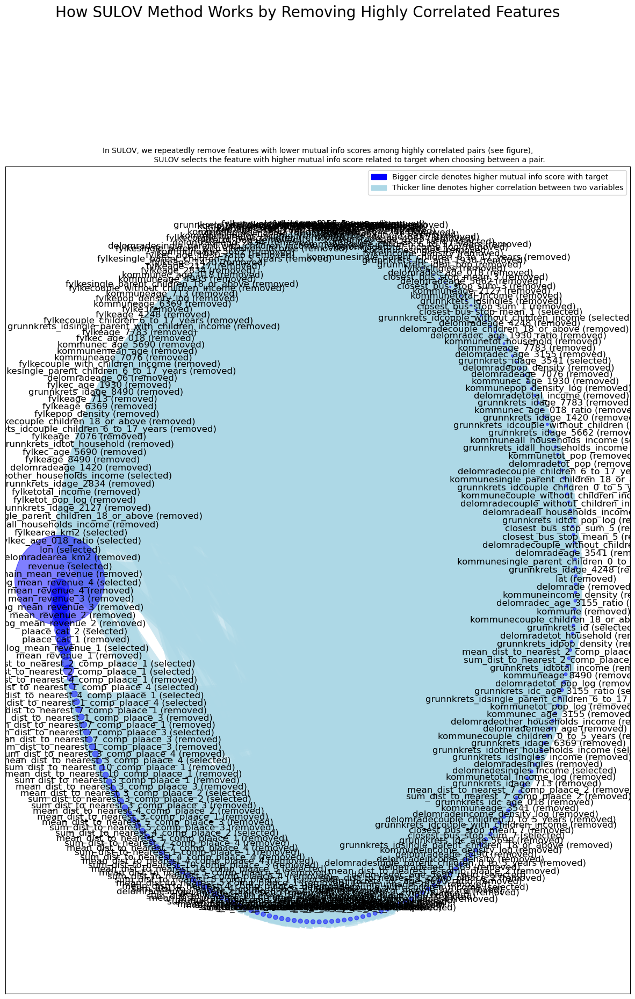

Time taken for SULOV method = 22 seconds
    Adding 9 categorical variables to reduced numeric variables  of 53
Finally 62 vars selected after SULOV
Converting all features to numeric before sending to XGBoost...
    there were no mixed data types or object columns that errored. Data is all numeric...
Shape of train data after adding missing values flags = (10287, 88)
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Current number of predictors before recursive XGBoost = 87 
    Taking top 41 features per iteration...
    XGBoost version using 1.7.1 as tree method: hist
Number of booster rounds = 100
        using 87 variables...
            selecting 1 features in this iteration
            Time taken for regular XGBoost feature selection = 3 secon

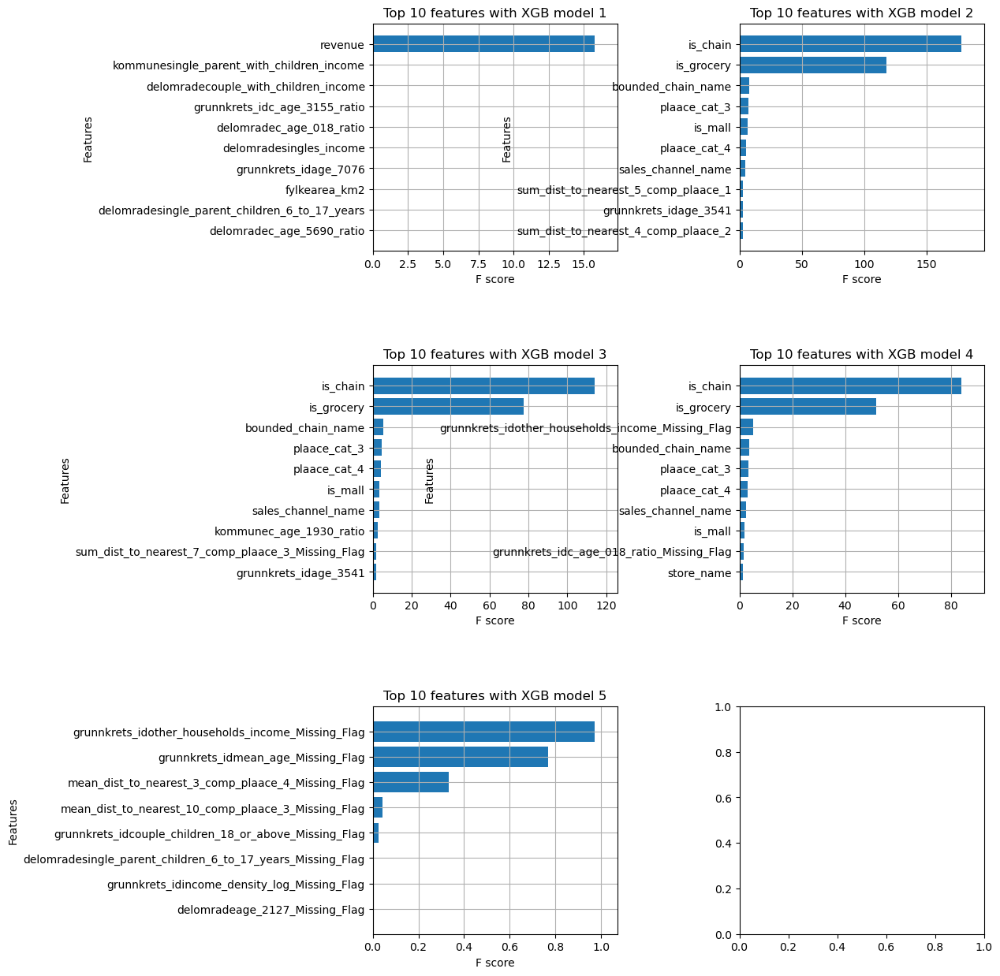

    Completed XGBoost feature selection in 1 seconds
    Alert: No ID variables ['store_id'] are included in selected features
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Alert: Dont forget to add a missing flag to sum_dist_to_nearest_7_comp_plaace_3 to create sum_dist_to_nearest_7_comp_plaace_3_Missing_Flag column
Alert: Dont forget to add a missing flag to grunnkrets_idincome_density_log to create grunnkrets_idincome_density_log_Missing_Flag column
Alert: Dont forget to add a missing flag to grunnkrets_idother_households_income to create grunnkrets_idother_households_income_Missing_Flag column
Alert: Dont forget to add a missing flag to grunnkrets_idc_age_018_ratio to create grunnkrets_idc_age_018_ratio_Missing_Flag column
Selected 30 important features:
['revenue', '

In [4]:
features = fw.featurewiz(stores_train, target='log_revenue', corr_limit=0.70, verbose=2)

In [5]:
relevant_features = features[0]

In [6]:
with open("relevant_features.txt", "w") as f:
    f.write(";".join(relevant_features))

## Outliers

In [7]:
# Magic to automatically update imports if functions in utils are changed
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import seaborn as sns
import sklearn
import matplotlib.pyplot as plt
import pprint

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [8]:
stores_train = pd.read_csv("temp_data/full_features_train.csv", index_col=0)
stores_val = pd.read_csv("temp_data/full_features_val.csv", index_col=0)
stores_extra = pd.read_csv("temp_data/full_features_extra.csv", index_col=0)
stores_test = pd.read_csv("temp_data/full_features_test.csv", index_col=0)

In [9]:
stores_train.shape

(10287, 282)

In [10]:
all_cols = list(stores_train.columns)

### Info about each variable

In [ ]:
stores_train["store_name"].nunique()

10265

### The plot thickens

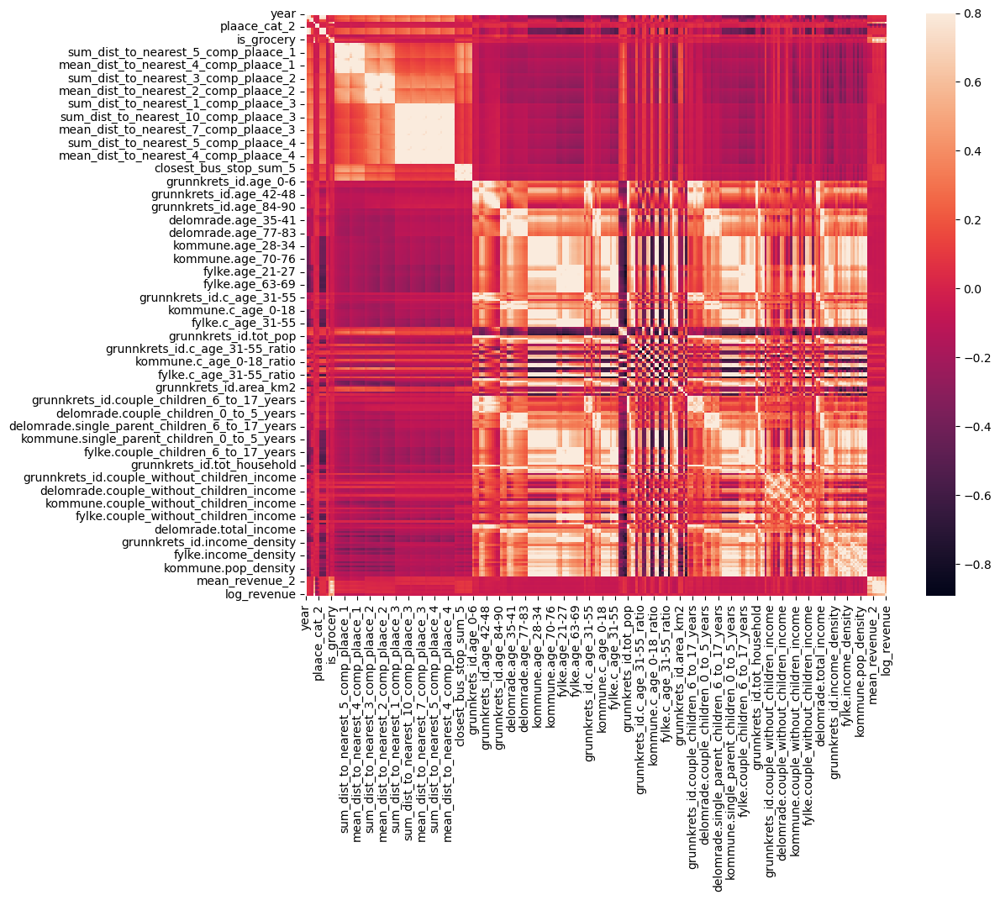

In [11]:
#correlation matrix
corrmat = stores_train.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);

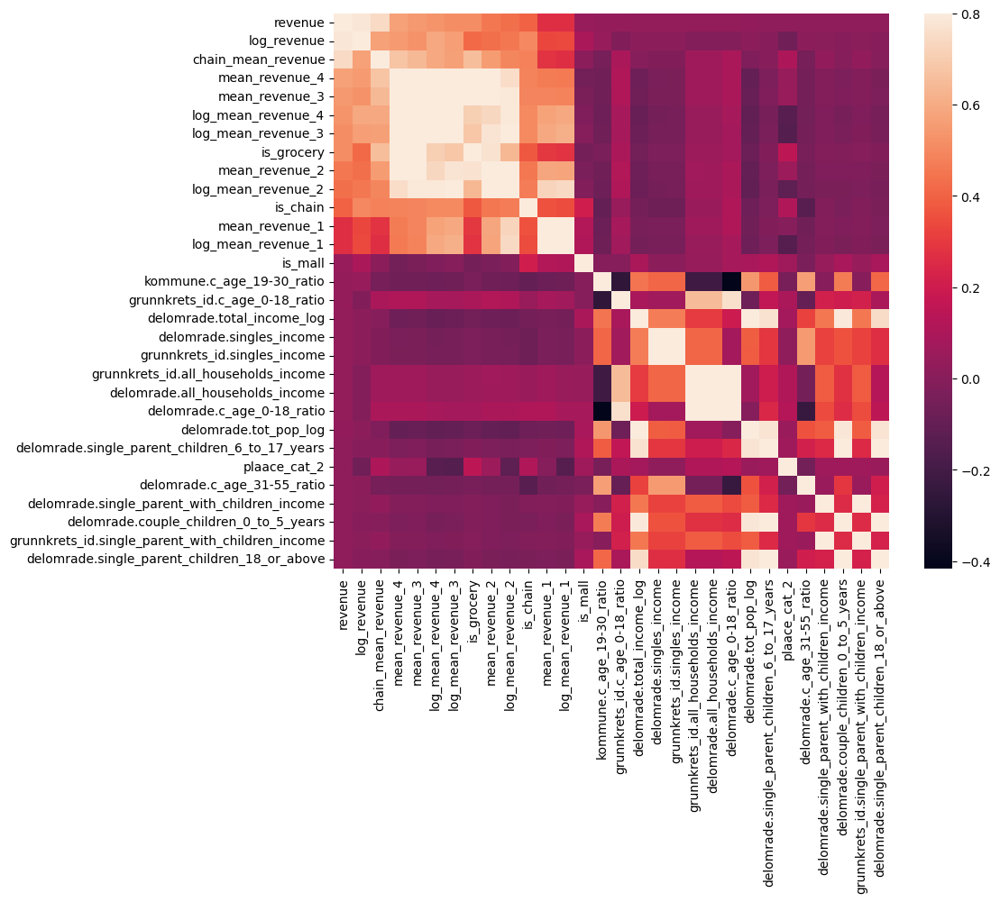

In [12]:
k = 30 #number of variables for heatmap
cols = corrmat.nlargest(k, 'revenue')['revenue'].index
#new correlation matrix
corrmat = stores_train[cols].corr()
f, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(corrmat, vmax=.8, square=True)
plt.show()

### Log Revenues

In [13]:
train_num = stores_train.select_dtypes(include=[np.float64, np.int64])

In [14]:
train_num.shape

(10287, 268)

In [15]:
train_num.plot(kind="box", subplots=True, layout=(17,16), figsize=(100,100));

In [16]:
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from utils import CustomTransformer

In [17]:
numerical_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="mean")), 
        ("scaler", StandardScaler(with_mean=True, with_std=True))]
)

In [18]:
train_num_sd = numerical_transformer.fit_transform(train_num)

In [19]:
train_num_sd = pd.DataFrame(train_num_sd, index=train_num.index, columns=train_num.columns)

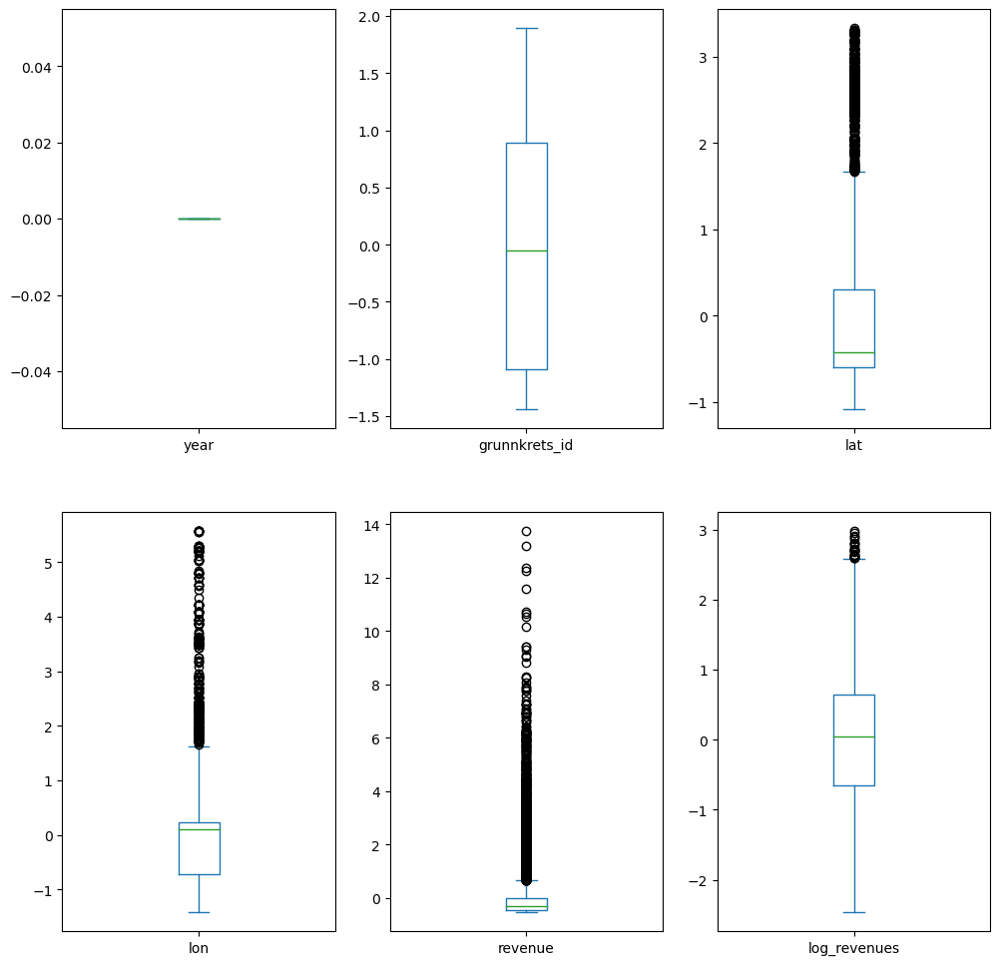

In [ ]:
train_num_sd.plot(kind="box", subplots=True, layout=(2,3), figsize=(12,12));

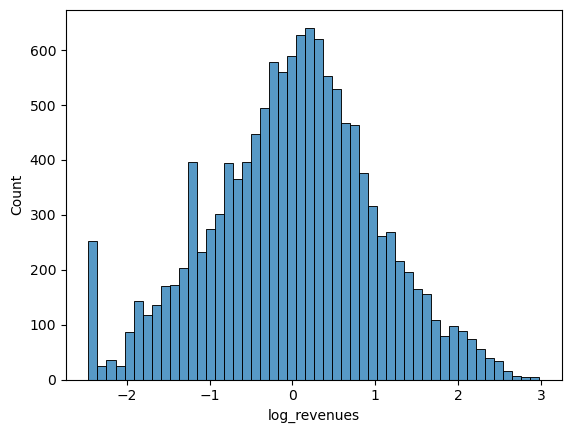

In [ ]:
sns.histplot(train_num_sd.log_revenues);

In [ ]:
import numpy as np
outliers = []
def detect_outliers_zscore(data):
    thres = 3
    mean = np.mean(data)
    std = np.std(data)
    for i in data:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers

sample_outliers = detect_outliers_zscore(train_num.revenue)
print("# of utliers from Z-scores method: ", len(sample_outliers))

# of utliers from Z-scores method:  328


In [ ]:
stores_test = pd.read_csv("data/stores_test.csv")

In [ ]:
stores_train.revenue.value_counts()

0.000     217
0.500     187
1.000      55
10.000     34
0.125      21
         ... 
66.367      1
16.966      1
4.335       1
18.750      1
2.328       1
Name: revenue, Length: 7971, dtype: int64

In [ ]:
top_n = 500
least_revenue = stores_train.sort_values(by=["revenue"], ascending=True).head(top_n)
most_revenue = stores_train.sort_values(by=["revenue"], ascending=False).head(top_n)
random_revenue = stores_train.sample(top_n)

### Check geographical location

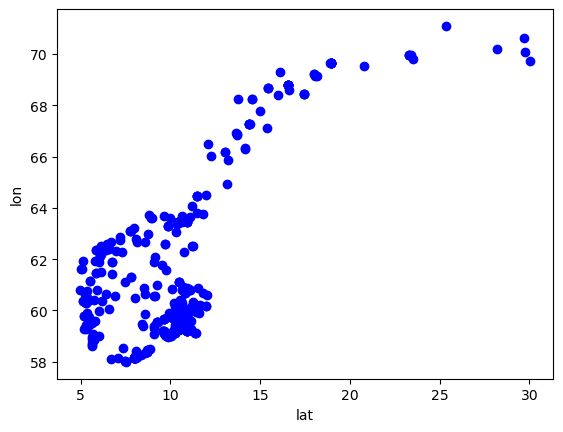

In [ ]:
plt.plot(random_revenue["lon"], random_revenue["lat"], "bo")
plt.ylabel("lon")
plt.xlabel("lat")
plt.show();

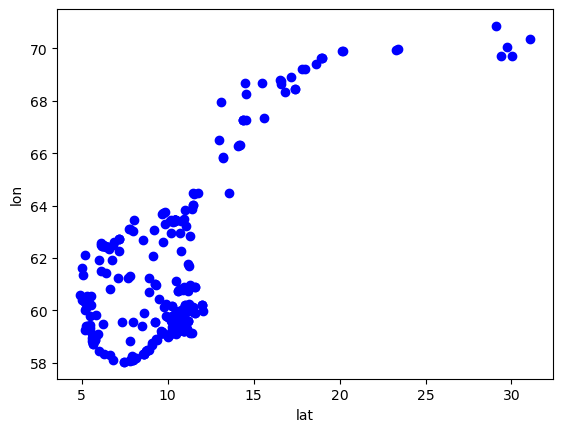

In [ ]:
plt.plot(least_revenue["lon"], least_revenue["lat"], "bo")
plt.ylabel("lon")
plt.xlabel("lat")
plt.show();

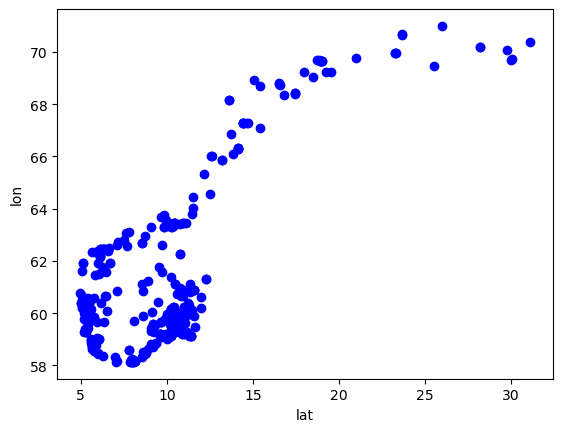

In [ ]:
plt.plot(most_revenue["lon"], most_revenue["lat"], "bo")
plt.ylabel("lon")
plt.xlabel("lat")
plt.show();

### Check distribution of categories

In [ ]:
def create_pie_chart(df_column, top_n = 10):
    df_col_dict = dict(df_column.value_counts())
    df_col_labels = list(df_col_dict.keys())
    df_col_values = list(df_col_dict.values())
    new_df_col_labels = df_col_labels[:top_n]
    new_df_col_labels.append("Other")
    new_df_col_values = df_col_values[:top_n]
    new_df_col_values.append(sum(df_col_values[top_n:]))
    plt.pie(new_df_col_values, labels = new_df_col_labels, autopct='%.0f%%')
    plt.show()

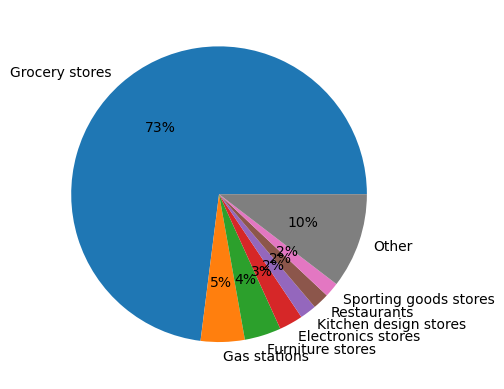

In [ ]:
create_pie_chart(most_revenue.sales_channel_name, top_n=7)

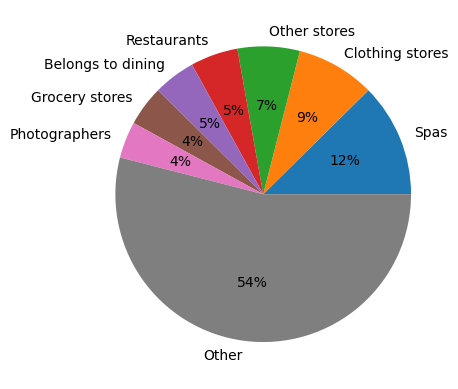

In [ ]:
create_pie_chart(least_revenue.sales_channel_name, top_n=7)

In [ ]:
zero_rev_stores = stores_train[stores_train["revenue"] == 0]

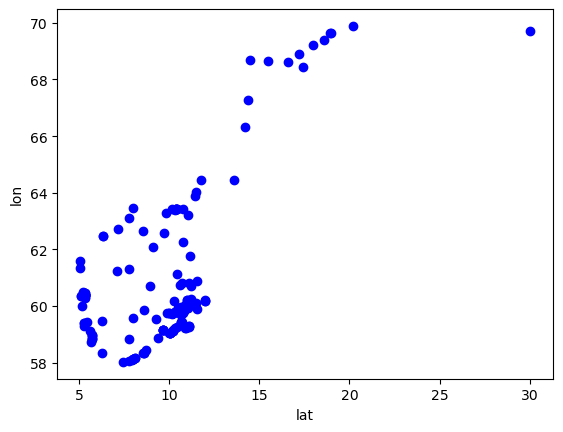

In [ ]:
plt.plot(zero_rev_stores["lon"], zero_rev_stores["lat"], "bo")
plt.ylabel("lon")
plt.xlabel("lat")
plt.show();

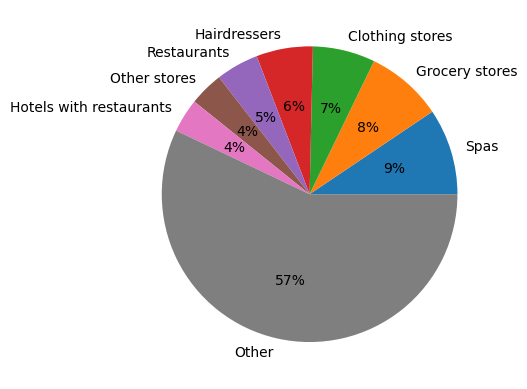

In [ ]:
create_pie_chart(stores_train.sales_channel_name, top_n=7)

### Remove Outliers

In [ ]:
stores_train.revenue.describe()

count    10287.000000
mean         8.328546
std         15.659131
min          0.000000
25%          1.188000
50%          3.363000
75%          8.052500
max        219.599000
Name: revenue, dtype: float64

We should remove stores with 0 revenue (does not make sense)

In [ ]:
small_rev = stores_train[(stores_train["revenue"] < 20) & (stores_train["revenue"] > 0.00)]

In [ ]:
small_rev[["store_name", "revenue", "chain_mean_revenue", "mean_revenue_4"]]

,store_name,revenue,chain_mean_revenue,mean_revenue_4
2506,BAKER KLAUSEN UNION,4.447,4.749203,5.448447
12305,PRIKKEN RENS AS,2.040,4.749203,2.971692
8561,INVIT AS,5.739,4.749203,6.400961
818,MUCHO MAS,15.573,4.749203,8.389096
10553,WHITE GALLERY AS,2.456,4.749203,1.933092
...,...,...,...,...
4859,ILONA AS,2.351,4.749203,4.652183
3264,FARGERIKE REINAAS,8.820,11.599725,8.585576
9845,NEXT FRISØR ÅLESUND,0.458,4.749203,2.632742
10799,HELSE OG VELVÆRE,0.592,4.749203,1.933092


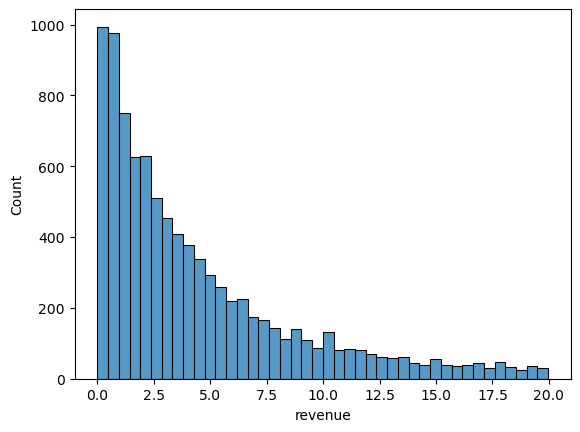

In [ ]:
sns.histplot(small_rev.revenue);

In [ ]:
from outlier_utils import remove_low_revenue

stores_train = remove_low_revenue(stores_train)

In [ ]:
stores_train.shape

(10043, 282)

# Submission

In [ ]:
# Magic to automatically update imports if functions in utils are changed
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
from tqdm import tqdm
from pathlib import Path

In [ ]:
from sklearn.model_selection import train_test_split

stores_train = pd.read_csv("data/stores_train.csv")
stores_test = pd.read_csv("data/stores_test.csv")
stores_extra = pd.read_csv("data/stores_extra.csv")

In [ ]:
from utils import split_plaace_cat


store_dataframes = {
    "train": stores_train, 
    "extra": stores_extra, 
    "test": stores_test, 
    }

for df_name, df in store_dataframes.items():
    df = split_plaace_cat(df)

In [ ]:
store_dataframes["train"]["log_revenue"] = store_dataframes["train"].revenue.apply(lambda x: np.log1p(x))

In [ ]:
from utils import mean_rev_of_competitor, log_mean_rev_of_competitor, create_geographical_columns, create_chain_and_mall_columns, generate_chain_rev_dict, generate_plaace_rev_dict, create_mean_chain_rev_col

chain_count = stores_train["chain_name"].value_counts().to_dict()

for df_name, df in tqdm(store_dataframes.items()):
    store_dataframes[df_name] = create_geographical_columns(df)
    store_dataframes[df_name] = create_chain_and_mall_columns(df, chain_count, lower_limit=1)

chain_rev_dict, log_bounded_chain_rev_dict = generate_chain_rev_dict(store_dataframes["train"], quantile=0)

for i in tqdm(range(1, 5)):
    rev_plaace_dict, mean_plaace_revenue, log_rev_plaace_dict, log_mean_plaace_revenue = generate_plaace_rev_dict(store_dataframes["train"], i, quantile=0)
    for df_name, df in store_dataframes.items():
            store_dataframes[df_name] = mean_rev_of_competitor(store_dataframes[df_name], i, rev_dict=rev_plaace_dict, mean_revenue=mean_plaace_revenue)
            store_dataframes[df_name] = log_mean_rev_of_competitor(store_dataframes[df_name], i, log_rev_dict=log_rev_plaace_dict, log_mean_revenue=log_mean_plaace_revenue)
    
for df_name, df in tqdm(store_dataframes.items()):
    store_dataframes[df_name] = create_mean_chain_rev_col(df, bounded_chain_revs=chain_rev_dict, log_bounded_chain_revs=log_bounded_chain_rev_dict)

100%|██████████| 3/3 [00:00<00:00, 181.77it/s]


In [ ]:
from utils import concat_df_keep_unq_index
concat_df = concat_df_keep_unq_index(store_dataframes["train"], store_dataframes["extra"])
concat_df = concat_df_keep_unq_index(concat_df, store_dataframes["test"])

In [ ]:
from utils import find_dist_to_nearest_comp

nearest_comp_plaace_cat_gran = [1, 2, 3, 4]
n_nearest_comp = [1, 2, 3, 4, 5, 7, 10]

store_dataframes["train"] = find_dist_to_nearest_comp(
    store_dataframes["train"], 
    nearest_comp_plaace_cat_gran, 
    n_nearest_comp, 
    training=True, 
    training_df=concat_df,
    )

In [ ]:
store_dataframes["test"] = find_dist_to_nearest_comp(
    store_dataframes["test"], 
    nearest_comp_plaace_cat_gran, 
    n_nearest_comp, 
    training=True,
    training_df=concat_df
)

In [ ]:
comp_plaace_cols = list(store_dataframes["train"].columns[-56:])

In [ ]:
dist_dict = store_dataframes["train"][['log_revenue'] + comp_plaace_cols].corr().iloc[0].to_dict()
sorted_relevant_dist_cols = [[k, v] for k, v in sorted(dist_dict.items(), key=lambda item: abs(item[1]), reverse=True)]

In [ ]:
comp_relevant_cols = sorted_relevant_dist_cols[1:14:2]
comp_relevant_cols = [r[0] for r in comp_relevant_cols]

In [ ]:
new_comp_relevant_cols = [
    'sum_dist_to_nearest_10_comp_plaace_1',
    'sum_dist_to_nearest_3_comp_plaace_1',
    'sum_dist_to_nearest_1_comp_plaace_1', 
    'sum_dist_to_nearest_3_comp_plaace_2',
    'sum_dist_to_nearest_1_comp_plaace_2',
    'sum_dist_to_nearest_1_comp_plaace_3',
    ]

In [ ]:
from bus_utils import find_closest_bus_stop

bus_stop_n = [1, 2, 3, 5, 7, 10, 15 ,25, 50, 100]
bus_mean = True
bus_sum = True

bus_stop_columns = []

if(bus_sum):
    bus_stop_columns += [f"closest_bus_stop_sum_{i}" for i in bus_stop_n]

if(bus_mean):
    bus_stop_columns += [f"closest_bus_stop_mean_{i}" for i in bus_stop_n]


for df_name, df in tqdm(store_dataframes.items()):
    store_dataframes[df_name] = find_closest_bus_stop(df, bus_stop_n, _sum=bus_sum, _mean=bus_mean)    

100%|██████████| 3/3 [12:03<00:00, 241.27s/it]


In [ ]:
bus_dict = store_dataframes["train"][['log_revenue'] + bus_stop_columns].corr().iloc[0].to_dict()
bus_sorted_relevant_dist_cols = [[k, v] for k, v in sorted(bus_dict.items(), key=lambda item: abs(item[1]), reverse=True)]

In [ ]:
bus_relevant_cols = bus_sorted_relevant_dist_cols[1::2]
bus_relevant_cols = [r[0] for r in bus_relevant_cols]

In [ ]:
bus_relevant_cols = bus_relevant_cols[:5]

In [ ]:
from grunnkrets_old import make_grunnkrets_df

full_population_dataframes = {}
full_pop_columns = []

for df_name, df in tqdm(store_dataframes.items()):
    full_population_dataframes[df_name] = make_grunnkrets_df(df)
    full_pop_columns = full_population_dataframes[df_name].columns

 33%|███▎      | 1/3 [00:07<00:14,  7.16s/it]/Users/oskarjor/NTNU/2022FALL/TDT4173/TDT4173/grunnkrets_old.py:101: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  full_population_df[f'{level}.income_density_log']  = np.log1p(full_population_df[f'{level}.income_density'])
/Users/oskarjor/NTNU/2022FALL/TDT4173/TDT4173/grunnkrets_old.py:100: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  full_population_df[f'{level}.income_density']  = full_population_df[f'{level}.total_income']/full_population_df[f'{level}.area_km2']
/Users/oskarjor/N

In [ ]:
full_pop_columns = list(full_pop_columns[-184:])

In [ ]:
for df_name, df in store_dataframes.items():
    store_dataframes[df_name] = df.merge(
        full_population_dataframes[df_name], 
        left_index=True,
        right_index=True,
        how="outer", 
        suffixes=('', '_redundant')
    )
    store_dataframes[df_name].drop(store_dataframes[df_name].filter(regex='_redundant$').columns, axis=1, inplace=True)

In [ ]:
full_pop_dict = store_dataframes["train"][['log_revenue'] + full_pop_columns].corr().iloc[0].to_dict()
full_pop_sorted_relevant_dist_cols = [[k, v] for k, v in sorted(full_pop_dict.items(), key=lambda item: abs(item[1]), reverse=True)]

In [ ]:
full_pop_relevant_cols = full_pop_sorted_relevant_dist_cols[1:8]
full_pop_relevant_cols = [r[0] for r in full_pop_relevant_cols]

In [ ]:
fylke_relevant_features = [col_name for col_name in store_dataframes["train"].columns if col_name.startswith("fylke.")]
kommune_relevant_features = [col_name for col_name in store_dataframes["train"].columns if col_name.startswith("kommune.")]
delomrade_relevant_features = [col_name for col_name in store_dataframes["train"].columns if col_name.startswith("delomrade.")]
grunnkrets_relevant_features = [col_name for col_name in store_dataframes["train"].columns if col_name.startswith("grunnkrets_id.")]

In [ ]:
from num_stores import add_num_stores_info

for df_name, df in store_dataframes.items():
    store_dataframes[df_name] = add_num_stores_info(df)

/Users/oskarjor/NTNU/2022FALL/TDT4173/TDT4173/num_stores.py:19: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped = geo_df.groupby([ level , cat]).sum()['count'].to_frame()
/Users/oskarjor/NTNU/2022FALL/TDT4173/TDT4173/num_stores.py:19: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped = geo_df.groupby([ level , cat]).sum()['count'].to_frame()
/Users/oskarjor/NTNU/2022FALL/TDT4173/TDT4173/num_stores.py:19: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns wh

In [ ]:
num_store_cols = list(store_dataframes["train"].columns[-64:])

In [ ]:
num_store_dict = store_dataframes["train"][['log_revenue'] + num_store_cols].corr().iloc[0].to_dict()
num_store_sorted_relevant_cols = [[k, v] for k, v in sorted(num_store_dict.items(), key=lambda item: abs(item[1]), reverse=True)]

In [ ]:
num_store_relevant_cols = num_store_sorted_relevant_cols[1:15]
num_store_relevant_cols = [r[0] for r in num_store_relevant_cols]

## Adding mean revenue (plaace_cat, level)

In [ ]:
from avg_revenue import add_avg_revenue, create_avg_revenue_csvs

create_avg_revenue_csvs()

for df_name, df in store_dataframes.items():
    store_dataframes[df_name] = add_avg_revenue(df, total=True)

In [ ]:
mean_rev_cols = list(store_dataframes["train"].columns)[-20:]

In [ ]:
mean_rev_dict = store_dataframes["train"][['log_revenue'] + mean_rev_cols].corr().iloc[0].to_dict()
mean_rev_sorted_relevant_cols = [[k, v] for k, v in sorted(mean_rev_dict.items(), key=lambda item: abs(item[1]), reverse=True)]

In [ ]:
mean_rev_relevant_cols = mean_rev_sorted_relevant_cols[1:]
mean_rev_relevant_cols = [r[0] for r in mean_rev_relevant_cols]

In [ ]:
mean_rev_relevant_log_cols = []
for col in mean_rev_relevant_cols:
    for df_name, df in store_dataframes.items():
        store_dataframes[df_name][col + "_log"] = store_dataframes[df_name][col].apply(lambda x: np.log1p(x))
    mean_rev_relevant_log_cols.append(col + "_log")

In [ ]:
from new_plaace_index import create_index_csv, add_new_plaace_index

create_index_csv()

for df_name, df in store_dataframes.items():
    store_dataframes[df_name] = add_new_plaace_index(store_dataframes[df_name])

In [ ]:
from clustering import add_clusters, create_cluster_csv

create_cluster_csv()

for df_name, df in store_dataframes.items():
    store_dataframes[df_name] = add_clusters(store_dataframes[df_name])

/Users/oskarjor/NTNU/2022FALL/TDT4173/TDT4173/clustering.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  geo_df = stores_total_train.append(stores_extra).append(stores_test)[['lat', 'lon', 'store_id']]


In [ ]:
for df_name, df in store_dataframes.items():
    store_dataframes[df_name]["chain_count"] = store_dataframes[df_name].bounded_chain_name.apply(lambda x: 0 if (x == "OTHER" or x in chain_count.keys()) else chain_count[x])

# Transforming the data

In [1]:
from RMSLE import rmsle
from pred_var_utils import reverse_log1p_transform_pred_var
from sklearn.model_selection import GridSearchCV

In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder


OE_categorical_features = ["bounded_chain_name", "kommune", "delomrade", "is_grocery", "plaace_cat_2", "plaace_cat_3", "plaace_cat_4", ]#"new_plaace"]
OE_categorical_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(missing_values=np.nan, strategy="constant")),
        ("encoder", OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=-1)),
    ]
)

OH_categorical_features = ["plaace_cat_1"] #["fylke", "plaace_cat_2"]
OH_categorical_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(missing_values=np.nan, strategy="constant")),
        ("encoder", OneHotEncoder(handle_unknown="ignore")),
    ]
)


numerical_features = ["lat", "lon", 
#"mean_revenue_1", "mean_revenue_2", "mean_revenue_3", "mean_revenue_4", 
"log_mean_revenue_1", "log_mean_revenue_2", "log_mean_revenue_3", "log_mean_revenue_4", 
"fylke.plaace_cat_1_mean_revenue_log", #"fylke.plaace_cat_3_mean_revenue_log", 
"log_chain_mean_revenue"
] + full_pop_relevant_cols + comp_relevant_cols + bus_relevant_cols + num_store_relevant_cols #+ mean_rev_relevant_log_cols
numerical_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="mean")), 
        ("scaler", StandardScaler(with_mean=True, with_std=True))]
)


preprocessor = ColumnTransformer(
   transformers=[
       ("oe_cat", OE_categorical_transformer, OE_categorical_features),
       ("oh_cat", OH_categorical_transformer, OH_categorical_features),
       ("num", numerical_transformer, numerical_features),
   ],
   remainder='drop'
)


X_train = preprocessor.fit_transform(store_dataframes["train"])

In [ ]:
y_train = np.array(store_dataframes["train"].log_revenue)
mean_y = y_train.mean()
std_y = y_train.std()

y_train -= mean_y
y_train /= std_y

# Training the model

## CatBoost

In [ ]:
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV

cb = CatBoostRegressor(
    random_seed=0, 
    verbose=False, 
    eval_metric="RMSE", 
    rsm=0.1,
    depth=6, 
    l2_leaf_reg= 10, 
    learning_rate= 0.05
    )

In [ ]:
cb.fit(X_train, y_train)

# Model Interpretation

In [ ]:
feature_importance = list(zip(list(preprocessor.get_feature_names_out()), list(cb.get_feature_importance())))

In [ ]:
sorted_feature_importance = sorted(feature_importance, key = lambda item: item[1], reverse=True)

In [ ]:
sorted_feature_importance

[('num__log_chain_mean_revenue', 28.9369837957904),
 ('num__log_mean_revenue_4', 9.263677464217828),
 ('num__log_mean_revenue_3', 5.3082975494216065),
 ('oe_cat__bounded_chain_name', 4.737861860495183),
 ('num__log_mean_revenue_2', 1.7233626960437556),
 ('num__grunnkrets_id.pop_density', 1.7040928399853934),
 ('num__closest_bus_stop_mean_50', 1.690165088643237),
 ('num__delomrade.plaace_cat_1_count', 1.6495843119614078),
 ('num__grunnkrets_id.plaace_cat_1_count', 1.6333700431495328),
 ('num__sum_dist_to_nearest_5_comp_plaace_1', 1.5691607968053756),
 ('num__fylke.plaace_cat_4_per_tot_income', 1.5474619921423822),
 ('num__grunnkrets_id.income_density', 1.5167674555991437),
 ('num__sum_dist_to_nearest_4_comp_plaace_1', 1.4651135837882812),
 ('num__delomrade.c_age_56-90_ratio', 1.4408126660375107),
 ('num__closest_bus_stop_mean_25', 1.4197632269177654),
 ('num__fylke.plaace_cat_3_per_tot_income', 1.3959681602113998),
 ('num__closest_bus_stop_sum_10', 1.3914472259355788),
 ('num__grunnkret

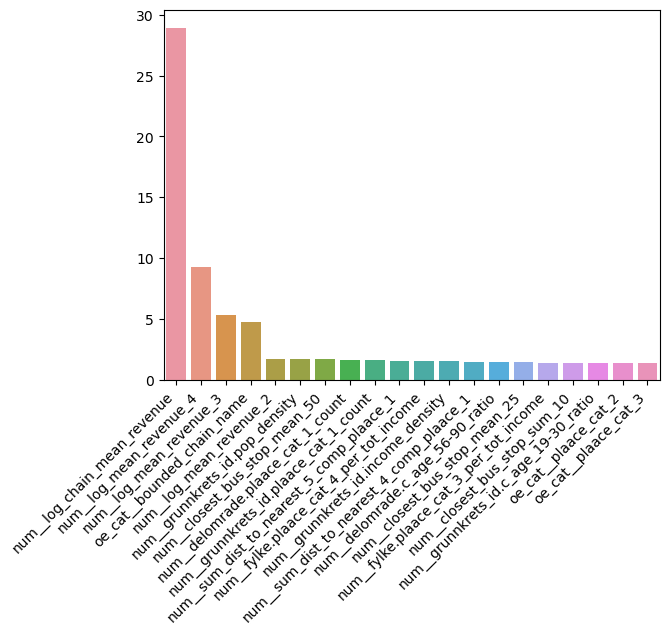

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

n_most_important_feat = 20

ax = sns.barplot(x=[x[0] for x in sorted_feature_importance[:n_most_important_feat]], y=[x[1] for x in sorted_feature_importance[:n_most_important_feat]])
ax.set_xticklabels([x[0] for x in sorted_feature_importance[:n_most_important_feat]], rotation = 45, ha="right");

From the plot of the 20 most important features, we see that the most important features in the model are related to the mean revenue of stores with similar plaace_id and the mean revenue of the chain the store belongs to. This makes sense, as there is a lot of information about the store implicilty encoded in these features. Stores of similar type (and/or belonging to similar chains) will be of similar size, have similar products and be located in similar locations. We also see that the population density of the grunnkrets is really important. As the majority of people shopping trips are to the local store, this also makes sense. The mean distance to the nearest 50 bus stops is also an important feature. Maybe this implicitly says something about whether or not the store is located in an urban area. We also see that the distance to nearest competitor (matching plaace_id) is important. Again, people probably go to their nearest store if possible, so it makes sense that the distance to the nearest competitor is an important feature. In the top 20 features, we also see data related to the age of the population in the area ("num_grunnkrets_id.c_age_19-30_ratio"), the higher levels of plaace_id ("oe_cat_plaace_cat_2") and the average income of the area ("num_grunnkrets_id.income_density"), all of which are features which we believe make sense when describing a store and predicting its revenue. 

It is, however, slightly concerning that 4 of the 5 most important features are target encoded, meaning that they use the revenue to decide the feature. This is an area where data leakage can easily happen, and it is important to clearly separate the training, validation and test set. Since the model performed well on the test set (for which there is no revenue available and so data leakage is impossible), and increases performance subsantially both on test and validation sets, we are fairly confident that the model is right in giving the features a lot of weight.